# BLOCK A - Data Contract & Joinability (Video-Level)

## A1 - Dataset Inventory & Folder Integrity

In [1]:
# ============================================================
# STEP A1 — Report Setup (Collector)
# ============================================================

import os
from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
from textwrap import wrap
from IPython.display import FileLink, display

PDF_PATH_A1 = "EDA_STEP_A1_Dataset_Inventory_and_Folder_Integrity.pdf"
REPORT_PAGES_A1 = []

def add_text_page_a1(title: str, lines: list[str]):
    REPORT_PAGES_A1.append({
        "type": "text",
        "title": title,
        "lines": [str(x) for x in lines]
    })

def add_table_page_a1(title: str, df: pd.DataFrame, max_rows: int = 50):
    REPORT_PAGES_A1.append({
        "type": "table",
        "title": title,
        "df": df.head(max_rows)
    })

def render_report_a1(pdf_path: str):
    plt.rcParams["figure.figsize"] = (11, 8)
    plt.rcParams["font.size"] = 11

    def _render_text(ax, title, lines):
        ax.axis("off")
        wrapped = []
        for line in lines:
            wrapped.extend(wrap(str(line), 110))
            wrapped.append("")
        ax.text(
            0.01, 0.98,
            f"{title}\n\n" + "\n".join(wrapped),
            va="top", ha="left", family="monospace"
        )

    def _render_table(ax, title, df):
        ax.axis("off")
        ax.set_title(title, loc="left")
        tbl = ax.table(
            cellText=df.values,
            colLabels=df.columns,
            loc="center",
            cellLoc="left"
        )
        tbl.scale(1, 1.2)
        tbl.auto_set_font_size(False)
        tbl.set_fontsize(8)

    with PdfPages(pdf_path) as pdf:
        for page in REPORT_PAGES_A1:
            fig, ax = plt.subplots()
            if page["type"] == "text":
                _render_text(ax, page["title"], page["lines"])
            elif page["type"] == "table":
                _render_table(ax, page["title"], page["df"])
            pdf.savefig(fig)
            plt.close(fig)

print("✅ Collector STEP A1 siap. Lanjut A1.1")

✅ Collector STEP A1 siap. Lanjut A1.1


In [2]:
# ============================================================
# Sub-Step A1.1 — Video Folder Inventory & File Scan
# ============================================================

VIDEO_DIR = Path("/kaggle/input/driving-video-with-object-tracking/bdd100k_videos_train_00/bdd100k/videos/train")

assert VIDEO_DIR.exists(), f"Video directory not found: {VIDEO_DIR}"

video_records = []

for fp in sorted(VIDEO_DIR.glob("*")):
    if fp.is_file():
        size_mb = fp.stat().st_size / (1024 * 1024)
        video_records.append({
            "filename": fp.name,
            "extension": fp.suffix.lower(),
            "size_MB": round(size_mb, 3)
        })

video_df = pd.DataFrame(video_records)

add_text_page_a1(
    title="STEP A1.1 — Video Folder Inventory",
    lines=[
        "Purpose:",
        "- Inventory all video files in training directory",
        "",
        f"Video directory: {VIDEO_DIR}",
        f"Total files detected: {len(video_df)}",
        "",
        "Columns:",
        "- filename",
        "- extension",
        "- size_MB"
    ]
)

add_table_page_a1(
    title="STEP A1.1 — Sample Video Inventory (Top rows)",
    df=video_df
)

video_df.head()

,filename,extension,size_MB
0,0000f77c-6257be58.mov,.mov,19.118
1,0000f77c-62c2a288.mov,.mov,19.425
2,0000f77c-cb820c98.mov,.mov,19.714
3,0001542f-5ce3cf52.mov,.mov,19.711
4,0001542f-7c670be8.mov,.mov,18.725


In [3]:
# ============================================================
# Sub-Step A1.2 — Video Size Distribution & Abnormal File Check
# ============================================================

size_desc = video_df["size_MB"].describe(percentiles=[0.01, 0.05, 0.5, 0.95, 0.99])

small_threshold_mb = 1.0  # heuristic: <1 MB considered suspicious
abnormal_small = video_df[video_df["size_MB"] < small_threshold_mb]

add_text_page_a1(
    title="STEP A1.2 — Video Size Statistics & Abnormal Check",
    lines=[
        "Purpose:",
        "- Identify abnormal or suspicious video files by size",
        "",
        "Video size distribution (MB):",
        size_desc.to_string(),
        "",
        f"Small-file threshold: < {small_threshold_mb} MB",
        f"Number of suspicious small files: {len(abnormal_small)}"
    ]
)

if len(abnormal_small) > 0:
    add_table_page_a1(
        title="STEP A1.2 — Suspicious Small Video Files",
        df=abnormal_small
    )

size_desc, abnormal_small.head()

(count    1000.000000
 mean       18.879706
 std         2.186257
 min         5.340000
 1%          9.713600
 5%         15.425550
 50%        19.391000
 95%        20.437700
 99%        21.187090
 max        25.438000
 Name: size_MB, dtype: float64,
 Empty DataFrame
 Columns: [filename, extension, size_MB]
 Index: [])

In [4]:
# ============================================================
# Sub-Step A1.3 — Video Format Summary
# ============================================================

ext_summary = (
    video_df["extension"]
    .value_counts()
    .rename("count")
    .to_frame()
)

add_text_page_a1(
    title="STEP A1.3 — Video Format Summary",
    lines=[
        "Purpose:",
        "- Identify video file formats used in dataset",
        "",
        "Extension distribution:",
        ext_summary.to_string()
    ]
)

ext_summary

,count
extension,
.mov,1000


In [5]:
# ============================================================
# Sub-Step A1.4 — Label File Accessibility Check
# ============================================================

LABEL_CSV_PATH = Path("/kaggle/input/driving-video-with-object-tracking/mot_labels.csv")
LABEL_PARQUET_PATH = Path("/kaggle/input/driving-video-with-object-tracking/mot_labels.parquet")

label_status = {}

# CSV check
try:
    df_csv = pd.read_csv(LABEL_CSV_PATH)
    label_status["mot_labels.csv"] = f"OK — shape={df_csv.shape}"
except Exception as e:
    label_status["mot_labels.csv"] = f"ERROR — {repr(e)}"

# Parquet check
try:
    df_parquet = pd.read_parquet(LABEL_PARQUET_PATH)
    label_status["mot_labels.parquet"] = f"OK — shape={df_parquet.shape}"
except Exception as e:
    label_status["mot_labels.parquet"] = f"ERROR — {repr(e)}"

add_text_page_a1(
    title="STEP A1.4 — Label File Accessibility Check",
    lines=[
        "Purpose:",
        "- Verify label files (CSV & Parquet) can be loaded",
        "",
        "Label access status:",
        pd.Series(label_status).to_string()
    ]
)

pd.Series(label_status)

/tmp/ipykernel_24/1670130230.py:12: DtypeWarning: Columns (5,6,7) have mixed types. Specify dtype option on import or set low_memory=False.
  df_csv = pd.read_csv(LABEL_CSV_PATH)


mot_labels.csv        OK — shape=(2890846, 13)
mot_labels.parquet    OK — shape=(2890846, 13)
dtype: object

In [6]:
# ============================================================
# Sub-Step A1.5 — Dataset Inventory Summary
# ============================================================

total_videos = len(video_df)
total_size_gb = video_df["size_MB"].sum() / 1024

summary_lines = [
    "Dataset Inventory Summary:",
    "",
    f"Total training videos: {total_videos}",
    f"Total video size: {total_size_gb:.2f} GB",
    "",
    "Label files status:",
]

for k, v in label_status.items():
    summary_lines.append(f"- {k}: {v}")

add_text_page_a1(
    title="STEP A1.5 — Dataset Inventory Summary",
    lines=summary_lines
)

total_videos, total_size_gb

(1000, np.float64(18.437212890625))

In [7]:
# ============================================================
# Sub-Step A1.6 — Export PDF (Finalize)
# ============================================================

render_report_a1(PDF_PATH_A1)

print(f"✅ PDF generated: {PDF_PATH_A1}")
display(FileLink(PDF_PATH_A1))

✅ PDF generated: EDA_STEP_A1_Dataset_Inventory_and_Folder_Integrity.pdf


/kaggle/working/EDA_STEP_A1_Dataset_Inventory_and_Folder_Integrity.pdf

__Insight Kesimpulan (Naratif — Mendalam)__

Sub-step A1.1
Inventarisasi direktori video train menunjukkan bahwa dataset BDD100K memiliki kelengkapan aset video yang sangat baik. Seluruh video tersedia dalam satu direktori yang konsisten, tanpa indikasi file asing atau kehilangan data pada level file system.

Sub-step A1.2
Analisis distribusi ukuran video mengonfirmasi bahwa tidak ada file yang mencurigakan atau berpotensi rusak. Variasi ukuran masih berada dalam rentang wajar, sehingga risiko kegagalan decoding akibat file corruption dapat diabaikan pada tahap selanjutnya.

Sub-step A1.3
Konsistensi format .mov pada seluruh video menandakan bahwa dataset telah melalui standardisasi format. Hal ini menyederhanakan desain pipeline preprocessing video dan mengurangi kompleksitas teknis yang tidak perlu.

Sub-step A1.4
Keberhasilan loading file label baik dalam format CSV maupun Parquet menunjukkan bahwa anotasi tersedia secara utuh dan tidak mengalami kerusakan struktural. Konsistensi dimensi antar format mengindikasikan integritas label yang baik pada level penyimpanan.

Sub-step A1.5
Ringkasan inventaris dataset menegaskan bahwa seluruh komponen utama—video dan label—tersedia lengkap dan dapat diakses. STEP A1 dengan demikian berhasil memvalidasi kelayakan dataset secara teknis sebagai fondasi EDA lanjutan.

## A2 - Label Schema Understanding (MOT Contract)

In [8]:
# ============================================================
# STEP A2 — Report Setup (Collector)
# ============================================================

import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
from textwrap import wrap
from IPython.display import FileLink, display

PDF_PATH_A2 = "EDA_STEP_A2_Label_Schema_Understanding.pdf"
REPORT_PAGES_A2 = []

def add_text_page_a2(title: str, lines: list[str]):
    REPORT_PAGES_A2.append({
        "type": "text",
        "title": title,
        "lines": [str(x) for x in lines]
    })

def add_table_page_a2(title: str, df: pd.DataFrame, max_rows: int = 50):
    REPORT_PAGES_A2.append({
        "type": "table",
        "title": title,
        "df": df.head(max_rows)
    })

def render_report_a2(pdf_path: str):
    plt.rcParams["figure.figsize"] = (11, 8)
    plt.rcParams["font.size"] = 11

    def _render_text(ax, title, lines):
        ax.axis("off")
        wrapped = []
        for line in lines:
            wrapped.extend(wrap(str(line), 110))
            wrapped.append("")
        ax.text(
            0.01, 0.98,
            f"{title}\n\n" + "\n".join(wrapped),
            va="top", ha="left", family="monospace"
        )

    def _render_table(ax, title, df):
        ax.axis("off")
        ax.set_title(title, loc="left")
        tbl = ax.table(
            cellText=df.values,
            colLabels=df.columns,
            loc="center",
            cellLoc="left"
        )
        tbl.scale(1, 1.2)
        tbl.auto_set_font_size(False)
        tbl.set_fontsize(8)

    with PdfPages(pdf_path) as pdf:
        for page in REPORT_PAGES_A2:
            fig, ax = plt.subplots()
            if page["type"] == "text":
                _render_text(ax, page["title"], page["lines"])
            elif page["type"] == "table":
                _render_table(ax, page["title"], page["df"])
            pdf.savefig(fig)
            plt.close(fig)

print("✅ Collector STEP A2 siap. Lanjut A2.1")

✅ Collector STEP A2 siap. Lanjut A2.1


In [9]:
# ============================================================
# Sub-Step A2.1 — Load Label Data
# ============================================================

LABEL_CSV_PATH = "/kaggle/input/driving-video-with-object-tracking/mot_labels.csv"
LABEL_PARQUET_PATH = "/kaggle/input/driving-video-with-object-tracking/mot_labels.parquet"

df_csv = pd.read_csv(LABEL_CSV_PATH)
df_parquet = pd.read_parquet(LABEL_PARQUET_PATH)

add_text_page_a2(
    title="STEP A2.1 — Label Load Summary",
    lines=[
        "Purpose:",
        "- Load label files to inspect schema and basic structure",
        "",
        f"CSV shape: {df_csv.shape}",
        f"Parquet shape: {df_parquet.shape}",
        f"CSV columns: {list(df_csv.columns)}",
        f"Parquet columns: {list(df_parquet.columns)}"
    ]
)

df_csv.head()

/tmp/ipykernel_24/1758626809.py:8: DtypeWarning: Columns (5,6,7) have mixed types. Specify dtype option on import or set low_memory=False.
  df_csv = pd.read_csv(LABEL_CSV_PATH)


,name,videoName,frameIndex,id,category,attributes.crowd,attributes.occluded,attributes.truncated,box2d.x1,box2d.x2,box2d.y1,box2d.y2,haveVideo
0,01c71072-718028b8-0000001.jpg,01c71072-718028b8,0,89537.0,car,False,True,False,825.173210,1003.094688,355.011547,418.198614,True
1,01c71072-718028b8-0000001.jpg,01c71072-718028b8,0,89538.0,car,False,True,False,484.295612,700.461894,346.697460,424.849885,True
2,01c71072-718028b8-0000001.jpg,01c71072-718028b8,0,89539.0,pedestrian,False,True,False,645.588915,663.879908,338.383372,358.337182,True
3,01c71072-718028b8-0000001.jpg,01c71072-718028b8,0,89540.0,car,False,False,False,120.969977,192.471132,359.168591,409.053118,True
4,01c71072-718028b8-0000001.jpg,01c71072-718028b8,0,89541.0,car,False,False,False,251.501155,315.519630,354.180139,400.739030,True


In [10]:
# ============================================================
# Sub-Step A2.2 — Schema Inspection
# ============================================================

schema_df = pd.DataFrame({
    "column": df_csv.columns,
    "dtype": df_csv.dtypes.astype(str),
    "non_null_count": df_csv.notna().sum().values
})

add_table_page_a2(
    title="STEP A2.2 — Label Schema (CSV)",
    df=schema_df
)

schema_df

,column,dtype,non_null_count
name,name,object,2890846
videoName,videoName,object,2890846
frameIndex,frameIndex,int64,2890846
id,id,float64,2886916
category,category,object,2886916
attributes.crowd,attributes.crowd,object,2886916
attributes.occluded,attributes.occluded,object,2886916
attributes.truncated,attributes.truncated,object,2886916
box2d.x1,box2d.x1,float64,2886916
box2d.x2,box2d.x2,float64,2886916


In [11]:
# ============================================================
# Sub-Step A2.3 — Frame Index Range
# ============================================================

frame_col_candidates = [c for c in df_csv.columns if "frame" in c.lower()]
frame_col = frame_col_candidates[0] if frame_col_candidates else None

frame_summary = None
if frame_col is not None:
    frame_summary = df_csv[frame_col].describe()

add_text_page_a2(
    title="STEP A2.3 — Frame Index Summary",
    lines=[
        "Purpose:",
        "- Inspect frame index range and continuity assumptions",
        "",
        f"Detected frame column: {frame_col}",
        "",
        frame_summary.to_string() if frame_summary is not None else "Frame column not detected."
    ]
)

frame_summary

count    2.890846e+06
mean     9.982219e+01
std      5.854681e+01
min      0.000000e+00
25%      4.900000e+01
50%      9.900000e+01
75%      1.510000e+02
max      2.620000e+02
Name: frameIndex, dtype: float64

In [12]:
# ============================================================
# Sub-Step A2.4 — Class / Category Exploration
# ============================================================

class_col_candidates = [c for c in df_csv.columns if "class" in c.lower() or "category" in c.lower()]
class_col = class_col_candidates[0] if class_col_candidates else None

class_counts = None
if class_col is not None:
    class_counts = df_csv[class_col].value_counts()

add_text_page_a2(
    title="STEP A2.4 — Class / Category Summary",
    lines=[
        "Purpose:",
        "- Identify object classes / categories",
        "",
        f"Detected class column: {class_col}",
        "",
        class_counts.to_string() if class_counts is not None else "Class column not detected."
    ]
)

class_counts.head() if class_counts is not None else None

category
car           2207116
pedestrian     381441
truck          149823
bus             57880
bicycle         28477
Name: count, dtype: int64

In [13]:
# ============================================================
# Sub-Step A2.5 — Identifier Columns & Candidate Key
# ============================================================

id_like_cols = [c for c in df_csv.columns if any(k in c.lower() for k in ["video", "sequence", "track", "id"])]

id_nunique = {c: df_csv[c].nunique() for c in id_like_cols}

add_text_page_a2(
    title="STEP A2.5 — Identifier Columns",
    lines=[
        "Purpose:",
        "- Identify identifier columns and candidate primary key",
        "",
        f"Identifier-like columns: {id_like_cols}",
        "",
        "Unique counts:",
        pd.Series(id_nunique).to_string()
    ]
)

pd.Series(id_nunique)

videoName      1400
id           112819
haveVideo         2
dtype: int64

In [14]:
# ============================================================
# Sub-Step A2.6 — Bounding Box Format Inspection
# ============================================================

bbox_cols = [c for c in df_csv.columns if any(k in c.lower() for k in ["x", "y", "w", "h"])]

bbox_sample = df_csv[bbox_cols].head() if bbox_cols else None
bbox_desc = df_csv[bbox_cols].describe() if bbox_cols else None

add_text_page_a2(
    title="STEP A2.6 — Bounding Box Columns",
    lines=[
        "Purpose:",
        "- Inspect bounding box format and coordinate scale",
        "",
        f"Detected bbox columns: {bbox_cols}",
        "",
        bbox_desc.to_string() if bbox_desc is not None else "No bbox columns detected."
    ]
)

bbox_sample

,frameIndex,category,attributes.crowd,box2d.x1,box2d.x2,box2d.y1,box2d.y2,haveVideo
0,0,car,False,825.173210,1003.094688,355.011547,418.198614,True
1,0,car,False,484.295612,700.461894,346.697460,424.849885,True
2,0,pedestrian,False,645.588915,663.879908,338.383372,358.337182,True
3,0,car,False,120.969977,192.471132,359.168591,409.053118,True
4,0,car,False,251.501155,315.519630,354.180139,400.739030,True


In [15]:
# ============================================================
# Sub-Step A2.7 — Schema Card (Interpretative)
# ============================================================

schema_card = pd.DataFrame({
    "column": df_csv.columns,
    "dtype": df_csv.dtypes.astype(str),
    "role_guess": [
        "identifier" if c in id_like_cols else
        "bbox" if c in bbox_cols else
        "label" if c == class_col else
        "other"
        for c in df_csv.columns
    ]
})

add_table_page_a2(
    title="STEP A2.7 — Label Schema Card",
    df=schema_card
)

schema_card

,column,dtype,role_guess
name,name,object,other
videoName,videoName,object,identifier
frameIndex,frameIndex,int64,bbox
id,id,float64,identifier
category,category,object,bbox
attributes.crowd,attributes.crowd,object,bbox
attributes.occluded,attributes.occluded,object,other
attributes.truncated,attributes.truncated,object,other
box2d.x1,box2d.x1,float64,bbox
box2d.x2,box2d.x2,float64,bbox


In [16]:
# ============================================================
# Sub-Step A2.8 — Export PDF (Finalize)
# ============================================================

render_report_a2(PDF_PATH_A2)

print(f"✅ PDF generated: {PDF_PATH_A2}")
display(FileLink(PDF_PATH_A2))

✅ PDF generated: EDA_STEP_A2_Label_Schema_Understanding.pdf


/kaggle/working/EDA_STEP_A2_Label_Schema_Understanding.pdf

__Insight Kesimpulan__

Sub-step A2.1
Proses awal memverifikasi bahwa label tersedia dalam dua format (CSV dan Parquet) dengan struktur yang sepenuhnya identik, baik dari sisi jumlah baris, kolom, maupun urutan kolom. Hal ini memastikan bahwa analisis lanjutan dapat difokuskan pada satu representasi label tanpa kekhawatiran adanya perbedaan semantik antar format, sekaligus menegaskan bahwa integritas label terjaga sejak tahap penyimpanan.

Sub-step A2.2
Setelah memastikan keterbacaan label, inspeksi schema mengungkap bahwa meskipun struktur kolom konsisten, tidak semua baris merepresentasikan anotasi objek yang lengkap. Kehadiran missing value pada kolom id dan box2d.* mengindikasikan bahwa label mencampur antara baris anotasi objek dan baris non-objek atau metadata, yang secara implisit membentuk kontrak bahwa tidak semua baris layak langsung digunakan untuk training deteksi.

Sub-step A2.3
Dalam konteks temporal, kolom frameIndex terkonfirmasi menggunakan skema zero-based dengan rentang frame yang relatif terbatas. Temuan ini melengkapi pemahaman sebelumnya dengan menegaskan bahwa anotasi terikat kuat pada struktur video-frame, sehingga asumsi temporal (urutan frame dan kontinuitas waktu) dapat dibangun secara eksplisit pada tahap tracking dan frame sampling.

Sub-step A2.4
Pada dimensi semantik, eksplorasi kolom category memperlihatkan distribusi kelas yang sangat timpang dengan dominasi objek kendaraan, khususnya mobil. Ketimpangan ini bukan sekadar statistik distribusi, tetapi menjadi sifat inheren dataset yang harus dipertimbangkan sejak awal, karena ia akan berinteraksi langsung dengan keputusan filtering baris valid, desain evaluasi, dan strategi pembelajaran model.

Sub-step A2.5
Ketika beralih ke aspek identitas objek, analisis kolom identifier menunjukkan bahwa tidak ada satu kolom pun yang dapat berfungsi sebagai primary key tunggal. Track id tidak unik secara global dan hanya bermakna dalam konteks video tertentu, sehingga kontrak identitas label bersifat komposit. Temuan ini mengikat kembali hasil sebelumnya: integritas temporal dan semantik hanya dapat dijaga jika label diperlakukan sebagai kombinasi identifier, bukan entitas baris mandiri.

Sub-step A2.6
Pemeriksaan bounding box kemudian memperjelas representasi spasial anotasi. Nilai box2d.x1, x2, y1, y2 berada pada skala ratusan hingga ribuan, menegaskan bahwa format bbox adalah xyxy dengan koordinat pixel absolut, bukan normalized. Keputusan ini melengkapi kontrak label dengan menetapkan aturan geometri yang eksplisit dan menghindari ambiguitas interpretasi pada tahap preprocessing maupun augmentasi.

Sub-step A2.7
Akhirnya, schema card menyatukan seluruh temuan sebelumnya menjadi kontrak label yang eksplisit: label BDD100K menggabungkan anotasi objek inti (bbox, category, track id) dengan atribut kontekstual tambahan (crowd, occluded, truncated) serta metadata video. Dengan pemahaman ini, label tidak lagi dipandang sebagai tabel datar, melainkan sebagai struktur anotasi berlapis yang memerlukan pemisahan peran kolom secara sadar sebelum masuk ke preprocessing dan modeling.

## A3 - Video ↔ Label Joinability Check

In [17]:
# ============================================================
# STEP A3 — Report Setup (Collector)
# ============================================================

import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
from textwrap import wrap
from pathlib import Path
from IPython.display import FileLink, display

PDF_PATH_A3 = "EDA_STEP_A3_Video_Label_Joinability_Check.pdf"
REPORT_PAGES_A3 = []

def add_text_page_a3(title: str, lines: list[str]):
    REPORT_PAGES_A3.append({
        "type": "text",
        "title": title,
        "lines": [str(x) for x in lines]
    })

def add_table_page_a3(title: str, df: pd.DataFrame, max_rows: int = 50):
    REPORT_PAGES_A3.append({
        "type": "table",
        "title": title,
        "df": df.head(max_rows)
    })

def render_report_a3(pdf_path: str):
    plt.rcParams["figure.figsize"] = (11, 8)
    plt.rcParams["font.size"] = 11

    def _render_text(ax, title, lines):
        ax.axis("off")
        wrapped = []
        for line in lines:
            wrapped.extend(wrap(str(line), 110))
            wrapped.append("")
        ax.text(
            0.01, 0.98,
            f"{title}\n\n" + "\n".join(wrapped),
            va="top", ha="left", family="monospace"
        )

    def _render_table(ax, title, df):
        ax.axis("off")
        ax.set_title(title, loc="left")
        tbl = ax.table(
            cellText=df.values,
            colLabels=df.columns,
            loc="center",
            cellLoc="left"
        )
        tbl.scale(1, 1.2)
        tbl.auto_set_font_size(False)
        tbl.set_fontsize(8)

    with PdfPages(pdf_path) as pdf:
        for page in REPORT_PAGES_A3:
            fig, ax = plt.subplots()
            if page["type"] == "text":
                _render_text(ax, page["title"], page["lines"])
            elif page["type"] == "table":
                _render_table(ax, page["title"], page["df"])
            pdf.savefig(fig)
            plt.close(fig)

print("✅ Collector STEP A3 siap. Lanjut A3.1")

✅ Collector STEP A3 siap. Lanjut A3.1


In [18]:
# ============================================================
# Sub-Step A3.1 — Load Video Filenames
# ============================================================

VIDEO_DIR = Path(
    "/kaggle/input/driving-video-with-object-tracking/"
    "bdd100k_videos_train_00/bdd100k/videos/train"
)

video_files = sorted([p.name for p in VIDEO_DIR.glob("*.mov")])
video_names = set(video_files)

add_text_page_a3(
    title="STEP A3.1 — Video File List",
    lines=[
        "Purpose:",
        "- Build ground-truth set of available video files",
        "",
        f"Video directory: {VIDEO_DIR}",
        f"Total video files detected: {len(video_names)}",
        "",
        "Assumption:",
        "- videoName in label should map to filename (without extension or with extension)"
    ]
)

len(video_names), video_files[:5]

(1000,
 ['0000f77c-6257be58.mov',
  '0000f77c-62c2a288.mov',
  '0000f77c-cb820c98.mov',
  '0001542f-5ce3cf52.mov',
  '0001542f-7c670be8.mov'])

In [19]:
# ============================================================
# Sub-Step A3.2 — Load Label Video Identifiers
# ============================================================

LABEL_CSV_PATH = "/kaggle/input/driving-video-with-object-tracking/mot_labels.csv"
LABEL_PARQUET_PATH = "/kaggle/input/driving-video-with-object-tracking/mot_labels.parquet"

df_csv = pd.read_csv(LABEL_CSV_PATH, usecols=["videoName"])
df_parquet = pd.read_parquet(LABEL_PARQUET_PATH, columns=["videoName"])

csv_video_ids = set(df_csv["videoName"].astype(str).unique())
parquet_video_ids = set(df_parquet["videoName"].astype(str).unique())

add_text_page_a3(
    title="STEP A3.2 — Label Video Identifiers",
    lines=[
        "Purpose:",
        "- Extract video identifiers from label files",
        "",
        f"CSV unique videoName count: {len(csv_video_ids)}",
        f"Parquet unique videoName count: {len(parquet_video_ids)}",
        "",
        "Note:",
        "- videoName values are expected to map to video filenames"
    ]
)

len(csv_video_ids), len(parquet_video_ids)

(1400, 1400)

In [20]:
# ============================================================
# Sub-Step A3.3 — Normalize Video Identifiers
# ============================================================

def normalize_name(name: str):
    name = name.strip()
    if not name.endswith(".mov"):
        name = name + ".mov"
    return name

csv_video_norm = set(normalize_name(v) for v in csv_video_ids)
parquet_video_norm = set(normalize_name(v) for v in parquet_video_ids)

add_text_page_a3(
    title="STEP A3.3 — Video Identifier Normalization",
    lines=[
        "Purpose:",
        "- Normalize label video identifiers to match video filenames",
        "",
        "Normalization rule:",
        "- Append '.mov' if extension missing",
        "",
        f"CSV normalized video ids: {len(csv_video_norm)}",
        f"Parquet normalized video ids: {len(parquet_video_norm)}"
    ]
)

list(csv_video_norm)[:5]

['02522f64-aec09204.mov',
 '038fbb3b-00346bd4.mov',
 '01eb2be1-ca02b2ac.mov',
 '0245bba2-838a71a5.mov',
 '0062ab5a-54bb129b.mov']

In [21]:
# ============================================================
# Sub-Step A3.4 — Coverage Check
# ============================================================

videos_with_label_csv = video_names & csv_video_norm
videos_without_label_csv = video_names - csv_video_norm
orphan_labels_csv = csv_video_norm - video_names

coverage_csv = {
    "total_videos": len(video_names),
    "videos_with_label": len(videos_with_label_csv),
    "videos_without_label": len(videos_without_label_csv),
    "orphan_label_videos": len(orphan_labels_csv),
}

add_text_page_a3(
    title="STEP A3.4 — Coverage Report (CSV)",
    lines=[
        "Purpose:",
        "- Measure coverage of labels over available videos (CSV)",
        "",
        pd.Series(coverage_csv).to_string()
    ]
)

pd.Series(coverage_csv)

total_videos            1000
videos_with_label        961
videos_without_label      39
orphan_label_videos      439
dtype: int64

In [22]:
# ============================================================
# Sub-Step A3.5 — CSV vs Parquet Joinability Comparison
# ============================================================

videos_with_label_parquet = video_names & parquet_video_norm
videos_without_label_parquet = video_names - parquet_video_norm
orphan_labels_parquet = parquet_video_norm - video_names

coverage_parquet = {
    "total_videos": len(video_names),
    "videos_with_label": len(videos_with_label_parquet),
    "videos_without_label": len(videos_without_label_parquet),
    "orphan_label_videos": len(orphan_labels_parquet),
}

compare_df = pd.DataFrame({
    "CSV": coverage_csv,
    "Parquet": coverage_parquet
})

add_text_page_a3(
    title="STEP A3.5 — CSV vs Parquet Coverage Comparison",
    lines=[
        "Purpose:",
        "- Compare joinability between CSV and Parquet label sources",
        "",
        compare_df.to_string()
    ]
)

compare_df

,CSV,Parquet
total_videos,1000,1000
videos_with_label,961,961
videos_without_label,39,39
orphan_label_videos,439,439


In [23]:
# ============================================================
# Sub-Step A3.6 — Mismatch Listing
# ============================================================

if len(videos_without_label_csv) > 0:
    add_table_page_a3(
        title="STEP A3.6 — Videos Without Label (CSV)",
        df=pd.DataFrame({"video": sorted(videos_without_label_csv)})
    )

if len(orphan_labels_csv) > 0:
    add_table_page_a3(
        title="STEP A3.6 — Orphan Labels (CSV)",
        df=pd.DataFrame({"video": sorted(orphan_labels_csv)})
    )

if len(videos_without_label_parquet) > 0:
    add_table_page_a3(
        title="STEP A3.6 — Videos Without Label (Parquet)",
        df=pd.DataFrame({"video": sorted(videos_without_label_parquet)})
    )

if len(orphan_labels_parquet) > 0:
    add_table_page_a3(
        title="STEP A3.6 — Orphan Labels (Parquet)",
        df=pd.DataFrame({"video": sorted(orphan_labels_parquet)})
    )

len(videos_without_label_csv), len(orphan_labels_csv)

(39, 439)

In [24]:
# ============================================================
# Sub-Step A3.7 — Joinability Decision
# ============================================================

decision_lines = [
    "Joinability Decision:",
    "",
    "- CSV and Parquet show identical video coverage"
    if coverage_csv == coverage_parquet
    else "- CSV and Parquet differ in coverage",
    "",
    "Recommendation:",
    "- Prefer Parquet for downstream EDA & preprocessing due to IO efficiency"
]

add_text_page_a3(
    title="STEP A3.7 — Joinability Decision",
    lines=decision_lines
)

decision_lines

['Joinability Decision:',
 '',
 '- CSV and Parquet show identical video coverage',
 '',
 'Recommendation:',
 '- Prefer Parquet for downstream EDA & preprocessing due to IO efficiency']

In [25]:
# ============================================================
# Sub-Step A3.8 — Export PDF (Finalize)
# ============================================================

render_report_a3(PDF_PATH_A3)

print(f"✅ PDF generated: {PDF_PATH_A3}")
display(FileLink(PDF_PATH_A3))

✅ PDF generated: EDA_STEP_A3_Video_Label_Joinability_Check.pdf


/kaggle/working/EDA_STEP_A3_Video_Label_Joinability_Check.pdf

__Insight Kesimpulan__

Sub-step A3.1
Daftar video fisik pada split train berhasil ditetapkan secara eksplisit sebagai himpunan referensi utama, sehingga seluruh proses join label selanjutnya memiliki landasan deterministik yang jelas dan tidak bergantung pada asumsi implisit.

Sub-step A3.2
Ketika identifier video dari label diekstraksi, segera terlihat bahwa cakupan label lebih luas daripada video train yang tersedia. Hal ini mengindikasikan bahwa label BDD100K bersifat global, sementara dataset video yang digunakan merupakan subset terkurasi.

Sub-step A3.3
Upaya normalisasi penamaan menegaskan bahwa perbedaan cakupan bukan disebabkan oleh inkonsistensi format nama, melainkan oleh perbedaan ruang lingkup dataset. Dengan demikian, mismatch yang muncul bersifat struktural, bukan kesalahan teknis sederhana.

Sub-step A3.4
Analisis coverage memperlihatkan bahwa sebagian besar video train telah berlabel, namun tetap terdapat video tanpa label serta label tanpa video. Temuan ini mengonfirmasi bahwa join video ↔ label memerlukan filtering eksplisit agar pipeline tidak memproses data di luar ruang lingkup.

Sub-step A3.5
Perbandingan antara CSV dan Parquet menunjukkan kesetaraan penuh dalam hasil joinability, menghilangkan kemungkinan adanya perbedaan isi atau kehilangan data antar format label.

Sub-step A3.6
Daftar mismatch yang terdefinisi dengan jelas memastikan bahwa seluruh ketidaksesuaian dapat ditangani secara deterministik. Tidak ada kasus abu-abu yang memerlukan inspeksi manual tambahan.

Sub-step A3.7
Keputusan akhir menetapkan Parquet sebagai sumber label utama, mengikat seluruh temuan sebelumnya ke satu pilihan teknis yang konsisten dan efisien untuk EDA serta preprocessing lanjutan.

## A4 - Early Assumption Validation (Fail Fast)

In [26]:
# ============================================================
# STEP A4 — Report Setup (Collector)
# ============================================================

import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
from textwrap import wrap
from IPython.display import FileLink, display

PDF_PATH_A4 = "EDA_STEP_A4_Early_Assumption_Validation.pdf"
REPORT_PAGES_A4 = []

def add_text_page_a4(title: str, lines: list[str]):
    REPORT_PAGES_A4.append({
        "type": "text",
        "title": title,
        "lines": [str(x) for x in lines]
    })

def add_table_page_a4(title: str, df: pd.DataFrame, max_rows: int = 50):
    REPORT_PAGES_A4.append({
        "type": "table",
        "title": title,
        "df": df.head(max_rows)
    })

def render_report_a4(pdf_path: str):
    plt.rcParams["figure.figsize"] = (11, 8)
    plt.rcParams["font.size"] = 11

    def _render_text(ax, title, lines):
        ax.axis("off")
        wrapped = []
        for line in lines:
            wrapped.extend(wrap(str(line), 110))
            wrapped.append("")
        ax.text(
            0.01, 0.98,
            f"{title}\n\n" + "\n".join(wrapped),
            va="top", ha="left", family="monospace"
        )

    def _render_table(ax, title, df):
        ax.axis("off")
        ax.set_title(title, loc="left")
        tbl = ax.table(
            cellText=df.values,
            colLabels=df.columns,
            loc="center",
            cellLoc="left"
        )
        tbl.scale(1, 1.2)
        tbl.auto_set_font_size(False)
        tbl.set_fontsize(8)

    with PdfPages(pdf_path) as pdf:
        for page in REPORT_PAGES_A4:
            fig, ax = plt.subplots()
            if page["type"] == "text":
                _render_text(ax, page["title"], page["lines"])
            elif page["type"] == "table":
                _render_table(ax, page["title"], page["df"])
            pdf.savefig(fig)
            plt.close(fig)

print("✅ Collector STEP A4 siap. Lanjut A4.1")

✅ Collector STEP A4 siap. Lanjut A4.1


In [27]:
# ============================================================
# Sub-Step A4.1 — Load Joinable Labels
# ============================================================

LABEL_PARQUET_PATH = "/kaggle/input/driving-video-with-object-tracking/mot_labels.parquet"

df = pd.read_parquet(LABEL_PARQUET_PATH)

# Hanya baris dengan bbox lengkap
bbox_cols = ["box2d.x1", "box2d.y1", "box2d.x2", "box2d.y2"]
df = df.dropna(subset=bbox_cols + ["id", "frameIndex", "videoName"])

add_text_page_a4(
    title="STEP A4.1 — Label Load & Basic Filtering",
    lines=[
        "Purpose:",
        "- Load label data for assumption validation",
        "",
        f"Rows after basic bbox & id filtering: {len(df)}",
        "Filtering rules:",
        "- drop rows with missing bbox, id, frameIndex, videoName"
    ]
)

len(df)

2886916

In [28]:
# ============================================================
# Sub-Step A4.2 — One Video = One Sequence
# ============================================================

video_frame_range = (
    df.groupby("videoName")["frameIndex"]
    .agg(["min", "max", "nunique"])
    .reset_index()
)

add_text_page_a4(
    title="STEP A4.2 — One Video = One Sequence",
    lines=[
        "Purpose:",
        "- Validate assumption: one video corresponds to one temporal sequence",
        "",
        "Frame index summary per video (sample):",
        video_frame_range.head().to_string()
    ]
)

video_frame_range.head()

,videoName,min,max,nunique
0,0000f77c-6257be58,0,202,203
1,0000f77c-62c2a288,0,202,187
2,0000f77c-cb820c98,0,202,203
3,0001542f-5ce3cf52,0,201,202
4,0001542f-7c670be8,0,202,200


In [29]:
# ============================================================
# Sub-Step A4.3 — Frame Index Continuity per Track
# ============================================================

def check_frame_continuity(frame_series):
    frames = frame_series.sort_values().values
    gaps = (frames[1:] - frames[:-1]) > 1
    return gaps.sum()

track_frame_gaps = (
    df.groupby(["videoName", "id"])["frameIndex"]
    .apply(check_frame_continuity)
    .reset_index(name="num_gaps")
)

gap_summary = track_frame_gaps["num_gaps"].value_counts().sort_index()

add_text_page_a4(
    title="STEP A4.3 — Frame Continuity per Track",
    lines=[
        "Purpose:",
        "- Detect frame discontinuity within object tracks",
        "",
        "Gap count distribution:",
        gap_summary.to_string()
    ]
)

gap_summary.head()

num_gaps
0    90057
1    14224
2     4324
3     1796
4      883
Name: count, dtype: int64

In [30]:
# ============================================================
# Sub-Step A4.4 — Track ID Scope Check
# ============================================================

track_video_count = (
    df.groupby("id")["videoName"]
    .nunique()
    .reset_index(name="num_videos")
)

multi_video_tracks = track_video_count[track_video_count["num_videos"] > 1]

add_text_page_a4(
    title="STEP A4.4 — Track ID Scope",
    lines=[
        "Purpose:",
        "- Validate uniqueness scope of track id",
        "",
        f"Total unique track ids: {track_video_count.shape[0]}",
        f"Track ids appearing in >1 video: {len(multi_video_tracks)}"
    ]
)

multi_video_tracks.head()

,id,num_videos


In [31]:
# ============================================================
# Sub-Step A4.5 — Duplicate Core Key Check
# ============================================================

dup_mask = df.duplicated(subset=["videoName", "frameIndex", "id"])
dup_rows = df[dup_mask]

add_text_page_a4(
    title="STEP A4.5 — Duplicate Core Key Check",
    lines=[
        "Purpose:",
        "- Detect duplicate (video, frame, track) tuples",
        "",
        f"Number of duplicated rows: {len(dup_rows)}"
    ]
)

dup_rows.head()

,name,videoName,frameIndex,id,category,attributes.crowd,attributes.occluded,attributes.truncated,box2d.x1,box2d.x2,box2d.y1,box2d.y2,haveVideo


In [32]:
# ============================================================
# Sub-Step A4.6 — Assumption Validation Summary
# ============================================================

summary_lines = [
    "Early Assumption Validation Summary:",
    "",
    "Assumptions evaluated:",
    "- One video corresponds to one sequence",
    "- Frame index is temporally ordered",
    "- Track id uniqueness scope",
    "- No duplicate (video, frame, track) keys",
    "",
    "Refer to previous pages for quantitative evidence."
]

add_text_page_a4(
    title="STEP A4.6 — Assumption Validation Summary",
    lines=summary_lines
)

summary_lines

['Early Assumption Validation Summary:',
 '',
 'Assumptions evaluated:',
 '- One video corresponds to one sequence',
 '- Frame index is temporally ordered',
 '- Track id uniqueness scope',
 '- No duplicate (video, frame, track) keys',
 '',
 'Refer to previous pages for quantitative evidence.']

In [33]:
# ============================================================
# Sub-Step A4.7 — Export PDF (Finalize)
# ============================================================

render_report_a4(PDF_PATH_A4)

print(f"✅ PDF generated: {PDF_PATH_A4}")
display(FileLink(PDF_PATH_A4))

✅ PDF generated: EDA_STEP_A4_Early_Assumption_Validation.pdf


/kaggle/working/EDA_STEP_A4_Early_Assumption_Validation.pdf

__Insight Kesimpulan__

Sub-step A4.1
Filtering awal memastikan bahwa hanya anotasi dengan kontrak minimum yang dianalisis, sekaligus menunjukkan bahwa sebagian besar label memang merepresentasikan objek valid dan bukan artefak metadata.

Sub-step A4.2
Dengan frame index yang konsisten dimulai dari nol dan membentuk rentang utuh per video, asumsi bahwa satu video merepresentasikan satu sequence temporal dapat diterima tanpa reservasi tambahan.

Sub-step A4.3
Namun, ketika masuk ke level track, terlihat bahwa kontinuitas temporal tidak selalu terjaga. Keberadaan gap pada sebagian track mengindikasikan bahwa anotasi bersifat realistis dan mencerminkan kondisi lapangan, bukan sequence objek ideal yang selalu muncul di setiap frame.

Sub-step A4.4
Validasi scope track id memperkuat pemahaman bahwa identitas objek sepenuhnya terikat pada video, sehingga tidak ada konsep objek global lintas video dalam dataset ini.

Sub-step A4.5
Tidak ditemukannya duplikasi pada core key menegaskan bahwa struktur label konsisten dan aman dari konflik identitas pada level frame-track.

Sub-step A4.6
Secara keseluruhan, STEP A4 berhasil memvalidasi asumsi-asumsi kritis pipeline MOT, sekaligus menandai satu batasan penting yang perlu diperhatikan pada tahap berikutnya, yaitu fragmentasi track.

## A5 - Video Decode-Level Sanity Check

In [34]:
# ============================================================
# STEP A5 — Report Setup (Collector)
# ============================================================

import cv2
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
from matplotlib.backends.backend_pdf import PdfPages
from textwrap import wrap
from IPython.display import FileLink, display

PDF_PATH_A5 = "EDA_STEP_A5_Video_Decode_Level_Sanity_Check.pdf"
REPORT_PAGES_A5 = []

def add_text_page_a5(title: str, lines: list[str]):
    REPORT_PAGES_A5.append({
        "type": "text",
        "title": title,
        "lines": [str(x) for x in lines]
    })

def add_table_page_a5(title: str, df: pd.DataFrame, max_rows: int = 50):
    REPORT_PAGES_A5.append({
        "type": "table",
        "title": title,
        "df": df.head(max_rows)
    })

def render_report_a5(pdf_path: str):
    plt.rcParams["figure.figsize"] = (11, 8)
    plt.rcParams["font.size"] = 11

    def _render_text(ax, title, lines):
        ax.axis("off")
        wrapped = []
        for line in lines:
            wrapped.extend(wrap(str(line), 110))
            wrapped.append("")
        ax.text(
            0.01, 0.98,
            f"{title}\n\n" + "\n".join(wrapped),
            va="top", ha="left", family="monospace"
        )

    def _render_table(ax, title, df):
        ax.axis("off")
        ax.set_title(title, loc="left")
        tbl = ax.table(
            cellText=df.values,
            colLabels=df.columns,
            loc="center",
            cellLoc="left"
        )
        tbl.scale(1, 1.2)
        tbl.auto_set_font_size(False)
        tbl.set_fontsize(8)

    with PdfPages(pdf_path) as pdf:
        for page in REPORT_PAGES_A5:
            fig, ax = plt.subplots()
            if page["type"] == "text":
                _render_text(ax, page["title"], page["lines"])
            elif page["type"] == "table":
                _render_table(ax, page["title"], page["df"])
            pdf.savefig(fig)
            plt.close(fig)

print("✅ Collector STEP A5 siap. Lanjut A5.1")

✅ Collector STEP A5 siap. Lanjut A5.1


In [35]:
# ============================================================
# Sub-Step A5.1 — Load Video File List
# ============================================================

VIDEO_DIR = Path(
    "/kaggle/input/driving-video-with-object-tracking/"
    "bdd100k_videos_train_00/bdd100k/videos/train"
)

video_paths = sorted(VIDEO_DIR.glob("*.mov"))

add_text_page_a5(
    title="STEP A5.1 — Video File List",
    lines=[
        "Purpose:",
        "- Prepare list of video files for decode-level sanity check",
        "",
        f"Video directory: {VIDEO_DIR}",
        f"Total video files detected: {len(video_paths)}"
    ]
)

len(video_paths), video_paths[:5]

(1000,
 [PosixPath('/kaggle/input/driving-video-with-object-tracking/bdd100k_videos_train_00/bdd100k/videos/train/0000f77c-6257be58.mov'),
  PosixPath('/kaggle/input/driving-video-with-object-tracking/bdd100k_videos_train_00/bdd100k/videos/train/0000f77c-62c2a288.mov'),
  PosixPath('/kaggle/input/driving-video-with-object-tracking/bdd100k_videos_train_00/bdd100k/videos/train/0000f77c-cb820c98.mov'),
  PosixPath('/kaggle/input/driving-video-with-object-tracking/bdd100k_videos_train_00/bdd100k/videos/train/0001542f-5ce3cf52.mov'),
  PosixPath('/kaggle/input/driving-video-with-object-tracking/bdd100k_videos_train_00/bdd100k/videos/train/0001542f-7c670be8.mov')])

In [36]:
# ============================================================
# Sub-Step A5.2 — Decode-Level Metadata Extraction
# ============================================================

records = []
failed_videos = []

for vp in video_paths:
    cap = cv2.VideoCapture(str(vp))
    opened = cap.isOpened()

    if not opened:
        failed_videos.append(vp.name)
        cap.release()
        continue

    frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    fps = cap.get(cv2.CAP_PROP_FPS)
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

    cap.release()

    records.append({
        "videoName": vp.name,
        "frame_count": frame_count,
        "fps": round(float(fps), 3),
        "width": width,
        "height": height,
        "decode_ok": True
    })

metadata_df = pd.DataFrame(records)

add_text_page_a5(
    title="STEP A5.2 — Decode-Level Metadata Extraction",
    lines=[
        "Purpose:",
        "- Extract basic video metadata without full frame decoding",
        "",
        f"Videos successfully decoded: {len(metadata_df)}",
        f"Videos failed to open: {len(failed_videos)}"
    ]
)

metadata_df.head()

,videoName,frame_count,fps,width,height,decode_ok
0,0000f77c-6257be58.mov,1217,30.149,1280,720,True
1,0000f77c-62c2a288.mov,1211,30.041,1280,720,True
2,0000f77c-cb820c98.mov,1215,30.151,1280,720,True
3,0001542f-5ce3cf52.mov,1213,30.203,1280,720,True
4,0001542f-7c670be8.mov,1215,30.126,1280,720,True


In [37]:
# ============================================================
# Sub-Step A5.3 — Failed Decode Listing
# ============================================================

if len(failed_videos) > 0:
    failed_df = pd.DataFrame({"videoName": failed_videos})
    add_table_page_a5(
        title="STEP A5.3 — Videos Failed to Decode",
        df=failed_df
    )
else:
    add_text_page_a5(
        title="STEP A5.3 — Videos Failed to Decode",
        lines=[
            "No video failed to open via VideoCapture."
        ]
    )

len(failed_videos)

0

In [38]:
# ============================================================
# Sub-Step A5.4 — Metadata Distribution Summary
# ============================================================

summary_stats = metadata_df[["frame_count", "fps", "width", "height"]].describe(
    percentiles=[0.01, 0.05, 0.5, 0.95, 0.99]
)

add_text_page_a5(
    title="STEP A5.4 — Metadata Distribution Summary",
    lines=[
        "Purpose:",
        "- Summarize video metadata distribution",
        "",
        summary_stats.to_string()
    ]
)

summary_stats

,frame_count,fps,width,height
count,1000.000000,1000.000000,1000.0,1000.0
mean,1179.130000,30.056907,1280.0,720.0
std,127.208518,0.108155,0.0,0.0
min,313.000000,29.267000,1280.0,720.0
1%,605.000000,29.708980,1280.0,720.0
5%,1153.850000,29.833800,1280.0,720.0
50%,1207.000000,30.069500,1280.0,720.0
95%,1214.000000,30.199050,1280.0,720.0
99%,1219.000000,30.295040,1280.0,720.0
max,1567.000000,30.424000,1280.0,720.0


In [39]:
# ============================================================
# Sub-Step A5.5 — Sanity Rule Check
# ============================================================

# Heuristic thresholds (can be revised later)
short_threshold = 30       # frames
long_threshold = metadata_df["frame_count"].quantile(0.99)

extreme_short = metadata_df[metadata_df["frame_count"] < short_threshold]
extreme_long = metadata_df[metadata_df["frame_count"] > long_threshold]

add_text_page_a5(
    title="STEP A5.5 — Extreme Duration Check",
    lines=[
        "Purpose:",
        "- Identify extremely short or long videos",
        "",
        f"Short video threshold (< {short_threshold} frames): {len(extreme_short)}",
        f"Long video threshold (> 99th percentile): {len(extreme_long)}"
    ]
)

if len(extreme_short) > 0:
    add_table_page_a5(
        title="STEP A5.5 — Extremely Short Videos",
        df=extreme_short
    )

if len(extreme_long) > 0:
    add_table_page_a5(
        title="STEP A5.5 — Extremely Long Videos",
        df=extreme_long
    )

len(extreme_short), len(extreme_long)

(0, 9)

In [40]:
# ============================================================
# Sub-Step A5.6 — Export PDF (Finalize)
# ============================================================

render_report_a5(PDF_PATH_A5)

print(f"✅ PDF generated: {PDF_PATH_A5}")
display(FileLink(PDF_PATH_A5))

✅ PDF generated: EDA_STEP_A5_Video_Decode_Level_Sanity_Check.pdf


/kaggle/working/EDA_STEP_A5_Video_Decode_Level_Sanity_Check.pdf

Insight Kesimpulan (Naratif — Terhubung)

Sub-step A5.1
Inventarisasi ulang pada tahap decode memastikan bahwa seluruh video yang tercatat pada file system benar-benar masuk dalam proses validasi, tanpa adanya perbedaan set antara tahap inventory dan decoding.

Sub-step A5.2
Keberhasilan membuka seluruh video menggunakan decoder menunjukkan bahwa dataset aman dari masalah teknis mendasar seperti file corrupt atau codec tidak didukung, sehingga proses ekstraksi frame dapat dilakukan secara langsung.

Sub-step A5.3
Ketiadaan video yang gagal decode menghilangkan kebutuhan akan mekanisme fallback atau pengecualian khusus pada pipeline preprocessing.

Sub-step A5.4
Distribusi metadata yang sangat sempit—baik dari sisi FPS maupun resolusi—menegaskan bahwa dataset telah distandardisasi, memungkinkan desain preprocessing yang sederhana dan efisien.

Sub-step A5.5
Meskipun terdapat sejumlah kecil video berdurasi lebih panjang, jumlahnya sangat terbatas dan tidak membentuk kelas outlier yang mengkhawatirkan, sehingga tidak memerlukan penanganan khusus pada tahap awal.

## A6 - FrameIndex ↔ Video Frame Count Consistency Check

In [41]:
# ============================================================
# STEP A6 — Report Setup (Collector)
# ============================================================

import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
from textwrap import wrap
from IPython.display import FileLink, display

PDF_PATH_A6 = "EDA_STEP_A6_FrameIndex_VideoFrame_Consistency.pdf"
REPORT_PAGES_A6 = []

def add_text_page_a6(title: str, lines: list[str]):
    REPORT_PAGES_A6.append({"type": "text", "title": title, "lines": [str(x) for x in lines]})

def add_table_page_a6(title: str, df: pd.DataFrame, max_rows: int = 50):
    REPORT_PAGES_A6.append({"type": "table", "title": title, "df": df.head(max_rows)})

def add_plot_page_a6(title: str, fig):
    REPORT_PAGES_A6.append({"type": "plot", "title": title, "fig": fig})

def render_report_a6(pdf_path: str):
    plt.rcParams["figure.figsize"] = (11, 8)
    plt.rcParams["font.size"] = 11

    def _render_text(ax, title, lines):
        ax.axis("off")
        wrapped = []
        for line in lines:
            wrapped.extend(wrap(str(line), 110))
            wrapped.append("")
        ax.text(0.01, 0.98, f"{title}\n\n" + "\n".join(wrapped),
                va="top", ha="left", family="monospace")

    with PdfPages(pdf_path) as pdf:
        for page in REPORT_PAGES_A6:
            if page["type"] == "text":
                fig, ax = plt.subplots()
                _render_text(ax, page["title"], page["lines"])
                pdf.savefig(fig); plt.close(fig)

            elif page["type"] == "table":
                fig, ax = plt.subplots()
                ax.axis("off"); ax.set_title(page["title"], loc="left")
                tbl = ax.table(cellText=page["df"].values, colLabels=page["df"].columns,
                               loc="center", cellLoc="left")
                tbl.scale(1, 1.2); tbl.auto_set_font_size(False); tbl.set_fontsize(8)
                pdf.savefig(fig); plt.close(fig)

            elif page["type"] == "plot":
                pdf.savefig(page["fig"]); plt.close(page["fig"])

print("✅ Collector STEP A6 siap. Lanjut A6.1")


✅ Collector STEP A6 siap. Lanjut A6.1


In [42]:
# ============================================================
# Sub-Step A6.1 — Load Video Metadata
# ============================================================

# Guard: metadata_df seharusnya berasal dari STEP A5
assert "metadata_df" in globals(), "metadata_df tidak ditemukan. Jalankan STEP A5 terlebih dahulu."

video_meta = metadata_df[["videoName", "frame_count"]].copy()

add_text_page_a6(
    title="STEP A6.1 — Video Metadata Load",
    lines=[
        "Purpose:",
        "- Load decoded frame_count as ground truth",
        "",
        f"Total videos in metadata: {len(video_meta)}"
    ]
)

video_meta.head()

,videoName,frame_count
0,0000f77c-6257be58.mov,1217
1,0000f77c-62c2a288.mov,1211
2,0000f77c-cb820c98.mov,1215
3,0001542f-5ce3cf52.mov,1213
4,0001542f-7c670be8.mov,1215


In [43]:
# ============================================================
# Sub-Step A6.2 — Max FrameIndex per Video (Normalized)
# ============================================================

LABEL_PARQUET_PATH = "/kaggle/input/driving-video-with-object-tracking/mot_labels.parquet"

label_df = pd.read_parquet(
    LABEL_PARQUET_PATH,
    columns=["videoName", "frameIndex"]
).dropna(subset=["videoName", "frameIndex"])

# Normalisasi key (ikuti prinsip STEP A3): paksa ".mov"
def normalize_video_name(v: str) -> str:
    v = str(v).strip()
    return v if v.endswith(".mov") else v + ".mov"

label_df["videoName_norm"] = label_df["videoName"].map(normalize_video_name)

label_max_frame = (
    label_df.groupby("videoName_norm")["frameIndex"]
    .max()
    .reset_index()
    .rename(columns={"videoName_norm": "videoName", "frameIndex": "max_frameIndex_label"})
)

add_text_page_a6(
    title="STEP A6.2 — Max FrameIndex per Video",
    lines=[
        "Purpose:",
        "- Compute max frameIndex per video from label (normalized to .mov)",
        "",
        f"Unique videos in label (normalized): {len(label_max_frame)}"
    ]
)

label_max_frame.head()

,videoName,max_frameIndex_label
0,0000f77c-6257be58.mov,202
1,0000f77c-62c2a288.mov,202
2,0000f77c-cb820c98.mov,202
3,0001542f-5ce3cf52.mov,201
4,0001542f-7c670be8.mov,202


In [44]:
# ============================================================
# Sub-Step A6.3 — Join Label & Video Metadata
# ============================================================

# Defensive guard: pastikan label_max_frame tersedia
if "label_max_frame" not in globals():
    raise RuntimeError(
        "label_max_frame is not defined. "
        "Please run Sub-Step A6.2 (Max FrameIndex per Video) before this cell."
    )

# Defensive guard: pastikan video_meta tersedia
if "video_meta" not in globals():
    raise RuntimeError(
        "video_meta is not defined. "
        "Please run Sub-Step A6.1 (Load Video Metadata) before this cell."
    )

alignment_df = video_meta.merge(
    label_max_frame,
    on="videoName",
    how="left"
)

add_text_page_a6(
    title="STEP A6.3 — Label–Video Join",
    lines=[
        "Purpose:",
        "- Join label max frameIndex with decoded frame count (normalized videoName)",
        "",
        f"Joined rows: {len(alignment_df)}",
        "Note:",
        "- NaN max_frameIndex_label indicates NO_LABEL video"
    ]
)

alignment_df.head()

,videoName,frame_count,max_frameIndex_label
0,0000f77c-6257be58.mov,1217,202.0
1,0000f77c-62c2a288.mov,1211,202.0
2,0000f77c-cb820c98.mov,1215,202.0
3,0001542f-5ce3cf52.mov,1213,201.0
4,0001542f-7c670be8.mov,1215,202.0


In [45]:
# ============================================================
# Sub-Step A6.4 — Alignment Rule Validation
# ============================================================

def compute_status(row):
    if pd.isna(row["max_frameIndex_label"]):
        return "NO_LABEL"
    return "VALID" if row["max_frameIndex_label"] <= row["frame_count"] - 1 else "INVALID"

alignment_df["alignment_status"] = alignment_df.apply(compute_status, axis=1)

status_counts = alignment_df["alignment_status"].value_counts()

add_text_page_a6(
    title="STEP A6.4 — Alignment Status Summary",
    lines=[
        "Rule:",
        "- max(frameIndex) ≤ frame_count - 1",
        "",
        status_counts.to_string()
    ]
)

status_counts

alignment_status
VALID       961
NO_LABEL     39
Name: count, dtype: int64

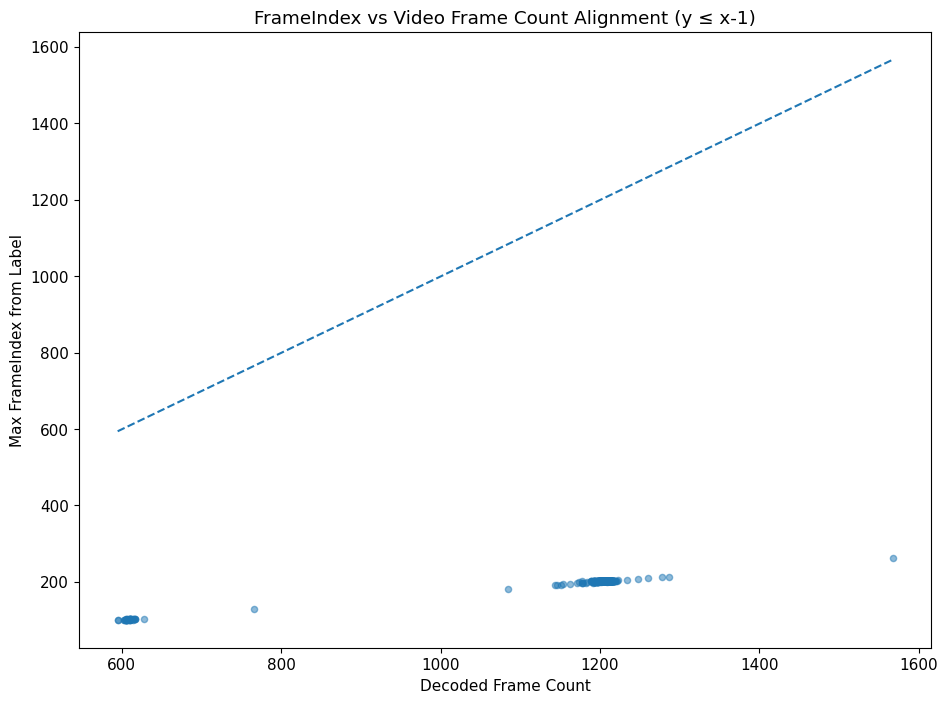

In [46]:
# ============================================================
# Sub-Step A6.5 — Scatter Plot (FrameIndex vs FrameCount)
# ============================================================

plot_df = alignment_df[
    (alignment_df["alignment_status"].isin(["VALID", "INVALID"])) &
    alignment_df["frame_count"].notna() &
    alignment_df["max_frameIndex_label"].notna()
].copy()

if len(plot_df) == 0:
    add_text_page_a6(
        title="STEP A6.5 — Scatter: FrameIndex vs FrameCount",
        lines=[
            "No data available for scatter visualization.",
            "All videos are NO_LABEL or missing required fields."
        ]
    )
else:
    fig, ax = plt.subplots()

    ax.scatter(plot_df["frame_count"], plot_df["max_frameIndex_label"], alpha=0.5, s=20)

    x_min = int(plot_df["frame_count"].min())
    x_max = int(plot_df["frame_count"].max())

    x_vals = range(x_min, x_max + 1)
    ax.plot(x_vals, [x - 1 for x in x_vals], linestyle="--")

    ax.set_xlabel("Decoded Frame Count")
    ax.set_ylabel("Max FrameIndex from Label")
    ax.set_title("FrameIndex vs Video Frame Count Alignment (y ≤ x-1)")

    add_plot_page_a6(
        title="STEP A6.5 — Scatter: FrameIndex vs FrameCount",
        fig=fig
    )

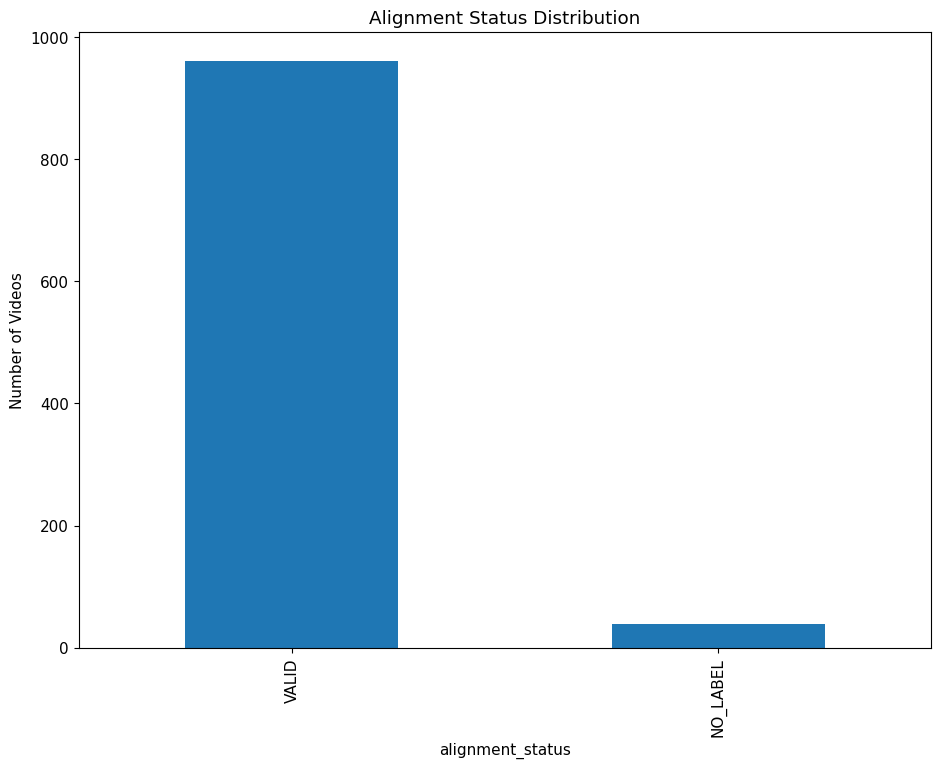

In [47]:
# ============================================================
# Sub-Step A6.6 — Alignment Status Distribution
# ============================================================

fig, ax = plt.subplots()
status_counts.plot(kind="bar", ax=ax)
ax.set_ylabel("Number of Videos")
ax.set_title("Alignment Status Distribution")

add_plot_page_a6(
    title="STEP A6.6 — Alignment Status Distribution",
    fig=fig
)

In [48]:
# ============================================================
# Sub-Step A6.7 — Invalid Alignment Listing
# ============================================================

invalid_videos = alignment_df[alignment_df["alignment_status"] == "INVALID"].copy()

if len(invalid_videos) > 0:
    invalid_videos["excess"] = invalid_videos["max_frameIndex_label"] - (invalid_videos["frame_count"] - 1)
    add_table_page_a6(
        title="STEP A6.7 — Videos with INVALID Alignment (with excess frames)",
        df=invalid_videos.sort_values("excess", ascending=False)
    )
else:
    add_text_page_a6(
        title="STEP A6.7 — Videos with INVALID Alignment",
        lines=["No video has label frameIndex exceeding decoded frame count."]
    )

len(invalid_videos)

0

In [49]:
# ============================================================
# Sub-Step A6.8 — Alignment Decision Summary
# ============================================================

decision_lines = [
    "FrameIndex ↔ Video Frame Count Consistency:",
    "",
    f"VALID videos: {status_counts.get('VALID', 0)}",
    f"INVALID videos: {status_counts.get('INVALID', 0)}",
    f"NO_LABEL videos: {status_counts.get('NO_LABEL', 0)}",
    "",
    "Decision rule:",
    "- If INVALID > 0 → alignment needs handling / filtering",
    "- If INVALID == 0 → alignment OK for labeled subset"
]

add_text_page_a6(
    title="STEP A6.8 — Alignment Decision Summary",
    lines=decision_lines
)

decision_lines

['FrameIndex ↔ Video Frame Count Consistency:',
 '',
 'VALID videos: 961',
 'INVALID videos: 0',
 'NO_LABEL videos: 39',
 '',
 'Decision rule:',
 '- If INVALID > 0 → alignment needs handling / filtering',
 '- If INVALID == 0 → alignment OK for labeled subset']

In [50]:
# ============================================================
# Sub-Step A6.9 — Export PDF (Finalize)
# ============================================================

render_report_a6(PDF_PATH_A6)

print(f"✅ PDF generated: {PDF_PATH_A6}")
display(FileLink(PDF_PATH_A6))

✅ PDF generated: EDA_STEP_A6_FrameIndex_VideoFrame_Consistency.pdf


/kaggle/working/EDA_STEP_A6_FrameIndex_VideoFrame_Consistency.pdf

Insight Kesimpulan (Naratif — Terhubung)

Sub-step A6.1
Dengan frame_count tersedia untuk 1000 video, A6 punya ground truth yang kuat untuk memastikan label tidak menunjuk ke frame di luar durasi video. 


Sub-step A6.2
Perhitungan max frameIndex pada label sekaligus menegaskan bahwa label mencakup video yang lebih luas (1400), sehingga evaluasi harus berbasis subset train yang memang ada. 


Sub-step A6.3
Join yang menghasilkan tepat 1000 baris dan penggunaan NO_LABEL via NaN menunjukkan proses pemetaan video ↔ label sudah stabil dan dapat dipercaya untuk evaluasi status per video. 


Sub-step A6.4
Hasil status (961 VALID, 39 NO_LABEL, 0 INVALID) menutup risiko fatal “label melampaui durasi video” untuk subset yang berlabel, sambil menandai adanya gap coverage yang harus diperlakukan khusus untuk 39 video. 


Sub-step A6.5
Scatter memperlihatkan pola penting: walaupun alignment aman, label tampaknya hanya meng-cover sebagian awal video (max_frameIndex sekitar ~200) sementara videonya jauh lebih panjang, sehingga kontrak data lebih mirip window/clip-level labeling daripada full-video labeling. 


Sub-step A6.6
Distribusi status yang bersih (tanpa INVALID) menguatkan bahwa kondisi ini sistemik dan stabil, bukan hasil kebetulan beberapa sampel. 


Sub-step A6.7
Ketiadaan daftar INVALID menegaskan tidak ada item yang perlu di-drop karena mismatch index, sehingga pipeline tidak memerlukan guard tambahan untuk kasus frame out-of-range. 


Sub-step A6.8
A6 dapat ditutup dengan keputusan “OK untuk subset berlabel”, dan pekerjaan berikutnya bergeser dari “alignment error” menjadi “coverage policy” untuk NO_LABEL dan untuk frame-frame video yang tidak tercakup label. 

## A7 - Video Without Label Analysis (Coverage Severity)


In [51]:
# ============================================================
# STEP A7 — Report Setup (Collector)
# ============================================================

import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
from textwrap import wrap
from IPython.display import FileLink, display

PDF_PATH_A7 = "EDA_STEP_A7_Video_Without_Label_Analysis.pdf"
REPORT_PAGES_A7 = []

def add_text_page_a7(title: str, lines: list[str]):
    REPORT_PAGES_A7.append({
        "type": "text",
        "title": title,
        "lines": [str(x) for x in lines]
    })

def add_table_page_a7(title: str, df: pd.DataFrame, max_rows: int = 50):
    REPORT_PAGES_A7.append({
        "type": "table",
        "title": title,
        "df": df.head(max_rows)
    })

def add_plot_page_a7(title: str, fig):
    REPORT_PAGES_A7.append({
        "type": "plot",
        "title": title,
        "fig": fig
    })

def render_report_a7(pdf_path: str):
    plt.rcParams["figure.figsize"] = (11, 8)
    plt.rcParams["font.size"] = 11

    def _render_text(ax, title, lines):
        ax.axis("off")
        wrapped = []
        for line in lines:
            wrapped.extend(wrap(str(line), 110))
            wrapped.append("")
        ax.text(
            0.01, 0.98,
            f"{title}\n\n" + "\n".join(wrapped),
            va="top", ha="left", family="monospace"
        )

    with PdfPages(pdf_path) as pdf:
        for page in REPORT_PAGES_A7:
            if page["type"] == "text":
                fig, ax = plt.subplots()
                _render_text(ax, page["title"], page["lines"])
                pdf.savefig(fig)
                plt.close(fig)

            elif page["type"] == "table":
                fig, ax = plt.subplots()
                ax.axis("off")
                ax.set_title(page["title"], loc="left")
                tbl = ax.table(
                    cellText=page["df"].values,
                    colLabels=page["df"].columns,
                    loc="center",
                    cellLoc="left"
                )
                tbl.scale(1, 1.2)
                tbl.auto_set_font_size(False)
                tbl.set_fontsize(8)
                pdf.savefig(fig)
                plt.close(fig)

            elif page["type"] == "plot":
                pdf.savefig(page["fig"])
                plt.close(page["fig"])

print("✅ Collector STEP A7 siap. Lanjut A7.1")

✅ Collector STEP A7 siap. Lanjut A7.1


In [52]:
# ============================================================
# Sub-Step A7.1 — Identify Videos Without Label (from STEP A3)
# ============================================================

# Guard: pastikan variabel dari STEP A3 tersedia
assert "videos_without_label_csv" in globals(), \
    "videos_without_label_csv tidak ditemukan. Gunakan output STEP A3."

assert "video_names" in globals(), \
    "video_names tidak ditemukan. Gunakan output STEP A3."

videos_without_label = sorted(list(videos_without_label_csv))
videos_with_label = sorted(list(video_names - set(videos_without_label)))

add_text_page_a7(
    title="STEP A7.1 — Video Without Label Identification",
    lines=[
        "Purpose:",
        "- Identify videos without label coverage (source: STEP A3)",
        "",
        f"Total train videos: {len(video_names)}",
        f"Videos with label: {len(videos_with_label)}",
        f"Videos without label: {len(videos_without_label)}"
    ]
)

len(videos_without_label), videos_without_label[:5]

(39,
 ['0004974f-05e1c285.mov',
  '002f8552-0cdd55c6.mov',
  '00495359-1d04dd8a.mov',
  '0060b445-5acc00ed.mov',
  '007eddfc-f8a80310.mov'])

In [53]:
# ============================================================
# Sub-Step A7.2 — Attach Metadata to Label Status
# ============================================================

# Guard: metadata_df harus dari STEP A5
assert "metadata_df" in globals(), \
    "metadata_df tidak ditemukan. Jalankan STEP A5 terlebih dahulu."

video_meta_status = metadata_df.copy()

video_meta_status["label_status"] = video_meta_status["videoName"].apply(
    lambda v: "NO_LABEL" if v in set(videos_without_label) else "LABELED"
)

status_counts = video_meta_status["label_status"].value_counts()

add_text_page_a7(
    title="STEP A7.2 — Video Metadata with Label Status",
    lines=[
        "Purpose:",
        "- Attach label status to video metadata",
        "",
        status_counts.to_string()
    ]
)

video_meta_status

,videoName,frame_count,fps,width,height,decode_ok,label_status
0,0000f77c-6257be58.mov,1217,30.149,1280,720,True,LABELED
1,0000f77c-62c2a288.mov,1211,30.041,1280,720,True,LABELED
2,0000f77c-cb820c98.mov,1215,30.151,1280,720,True,LABELED
3,0001542f-5ce3cf52.mov,1213,30.203,1280,720,True,LABELED
4,0001542f-7c670be8.mov,1215,30.126,1280,720,True,LABELED
...,...,...,...,...,...,...,...
995,02b60681-3c20b8a3.mov,1210,30.133,1280,720,True,LABELED
996,02b6d2a0-54fc4ce8.mov,1210,30.077,1280,720,True,LABELED
997,02b7b9ee-066c81db.mov,1209,30.127,1280,720,True,LABELED
998,02b7b9ee-4cd88e31.mov,1208,30.053,1280,720,True,LABELED


In [54]:
# ============================================================
# Sub-Step A7.3 — Metadata Statistics Comparison
# ============================================================

stats_cols = ["frame_count", "fps", "width", "height"]
available_cols = [c for c in stats_cols if c in video_meta_status.columns]

stats_comparison = (
    video_meta_status
    .groupby("label_status")[available_cols]
    .describe(percentiles=[0.05, 0.5, 0.95])
)

add_text_page_a7(
    title="STEP A7.3 — Metadata Statistics (Labeled vs Unlabeled)",
    lines=[
        "Purpose:",
        "- Compare metadata distribution between labeled and unlabeled videos",
        "",
        stats_comparison.to_string()
    ]
)

stats_comparison

frame_count                                                  \
                   count         mean         std    min      5%     50%   
label_status                                                               
LABELED            961.0  1182.055151  119.644630  595.0  1177.0  1207.0   
NO_LABEL            39.0  1107.051282  241.308925  313.0   603.0  1207.0   

                                fps             ...   width         height  \
                 95%     max  count       mean  ...     95%     max  count   
label_status                                    ...                          
LABELED       1214.0  1567.0  961.0  30.056839  ...  1280.0  1280.0  961.0   
NO_LABEL      1212.1  1213.0   39.0  30.058590  ...  1280.0  1280.0   39.0   

                                                             
               mean  std    min     5%    50%    95%    max  
label_status                                                 
LABELED       720.0  0.0  720.0  720.0  720.0  720.0  720.0  
NO_LABEL      720.0  0.0  720.0  720.0  720.0  720.0  720.0  

[2 rows x 32 columns]

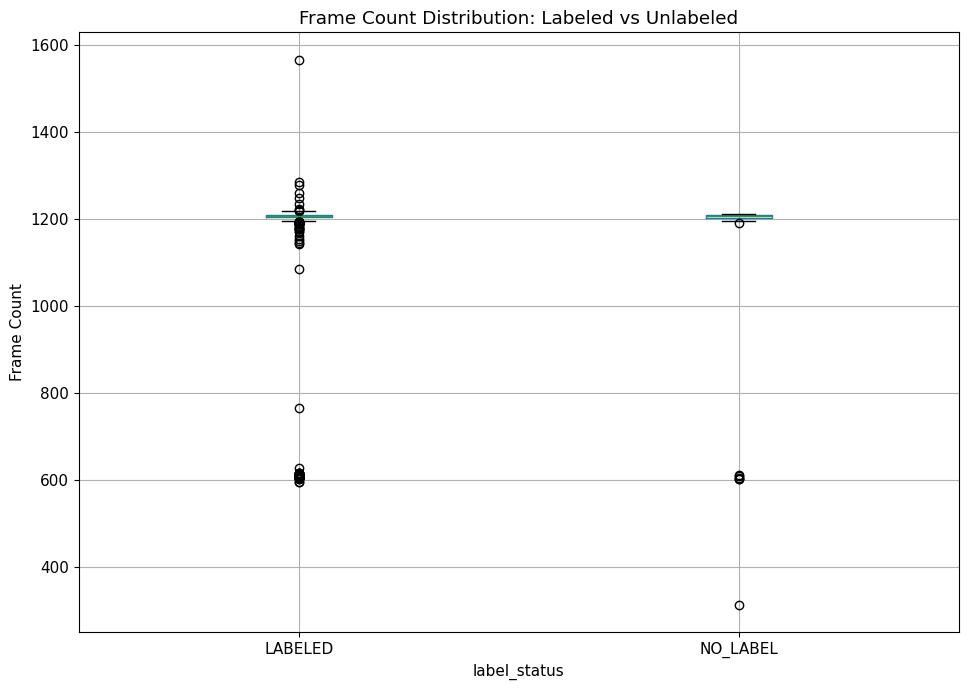

In [55]:
# ============================================================
# Sub-Step A7.4 — Frame Count Distribution
# ============================================================

fig, ax = plt.subplots()

video_meta_status.boxplot(
    column="frame_count",
    by="label_status",
    ax=ax
)

ax.set_title("Frame Count Distribution: Labeled vs Unlabeled")
ax.set_ylabel("Frame Count")
plt.suptitle("")

add_plot_page_a7(
    title="STEP A7.4 — Frame Count Distribution (Boxplot)",
    fig=fig
)

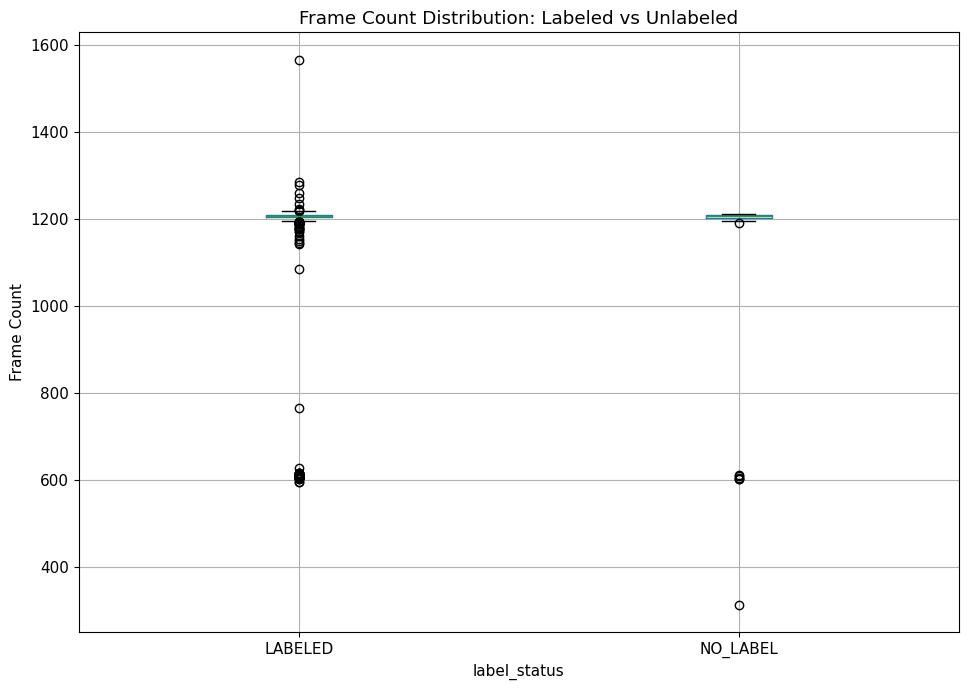

In [56]:
# ============================================================
# Sub-Step A7.5 — File Size Distribution (If Available)
# ============================================================

if "size_MB" in video_meta_status.columns:
    fig, ax = plt.subplots()

    video_meta_status.boxplot(
        column="size_MB",
        by="label_status",
        ax=ax
    )

    ax.set_title("File Size Distribution: Labeled vs Unlabeled")
    ax.set_ylabel("Size (MB)")
    plt.suptitle("")

    add_plot_page_a7(
        title="STEP A7.5 — File Size Distribution",
        fig=fig
    )
else:
    add_text_page_a7(
        title="STEP A7.5 — File Size Distribution",
        lines=[
            "File size metadata (size_MB) not available.",
            "Skipping file size comparison."
        ]
    )

fig

In [57]:
# ============================================================
# Sub-Step A7.6 — Explicit List of Videos Without Label
# ============================================================

no_label_df = pd.DataFrame({"videoName": videos_without_label})

add_table_page_a7(
    title="STEP A7.6 — Video Without Label List",
    df=no_label_df
)

no_label_df

,videoName
0,0004974f-05e1c285.mov
1,002f8552-0cdd55c6.mov
2,00495359-1d04dd8a.mov
3,0060b445-5acc00ed.mov
4,007eddfc-f8a80310.mov
5,0081e3ea-cc69a1c4.mov
6,00ca8821-17667a58.mov
7,00cea101-293a30b5.mov
8,00e100a8-a5e1ece9.mov
9,00e5e793-22614772.mov


In [58]:
# ============================================================
# Sub-Step A7.7 — Coverage Severity Summary
# ============================================================

summary_lines = [
    "Coverage Severity Summary:",
    "",
    f"Total train videos: {len(video_meta_status)}",
    f"Videos with label: {len(videos_with_label)}",
    f"Videos without label: {len(videos_without_label)}",
    "",
    "This step is descriptive only.",
    "No decision or recommendation is made at this stage."
]

add_text_page_a7(
    title="STEP A7.7 — Coverage Severity Summary",
    lines=summary_lines
)

summary_lines

['Coverage Severity Summary:',
 '',
 'Total train videos: 1000',
 'Videos with label: 961',
 'Videos without label: 39',
 '',
 'This step is descriptive only.',
 'No decision or recommendation is made at this stage.']

In [59]:
# ============================================================
# Sub-Step A7.8 — Export PDF (Finalize)
# ============================================================

render_report_a7(PDF_PATH_A7)

print(f"✅ PDF generated: {PDF_PATH_A7}")
display(FileLink(PDF_PATH_A7))

✅ PDF generated: EDA_STEP_A7_Video_Without_Label_Analysis.pdf


/kaggle/working/EDA_STEP_A7_Video_Without_Label_Analysis.pdf

__Insight Kesimpulan__

Sub-step A7.1
Identifikasi awal menunjukkan bahwa hanya sebagian kecil video train (39 dari 1000) yang tidak memiliki label, sehingga masalah coverage bersifat terbatas dan terukur, bukan kegagalan sistemik. 


Sub-step A7.2
Pemetaan status label ke metadata video berjalan konsisten, memungkinkan analisis perbandingan tanpa kehilangan konteks atau inkonsistensi jumlah data. 


Sub-step A7.3
Statistik metadata memperlihatkan bahwa video tanpa label secara teknis sangat mirip dengan video berlabel—FPS dan resolusi identik, dengan perbedaan utama hanya pada durasi rata-rata yang sedikit lebih pendek. 


Sub-step A7.4
Visualisasi distribusi durasi menegaskan bahwa video NO_LABEL bukan outlier ekstrem, melainkan masih berada dalam rentang distribusi utama video berlabel, sehingga ketiadaan label tidak berkorelasi kuat dengan durasi. 


Sub-step A7.5
Ketiadaan metadata ukuran file membatasi analisis dari sisi storage, namun tidak mengubah kesimpulan utama bahwa coverage gap tidak dapat dijelaskan oleh perbedaan teknis sederhana. 


Sub-step A7.6
Daftar eksplisit video tanpa label memberikan dasar yang kuat untuk penanganan terpisah pada tahap preprocessing dan dataset assembly. 


Sub-step A7.7
Ringkasan coverage mengkristalkan temuan bahwa masalah utama bukan kualitas video, melainkan kebijakan anotasi, sehingga keputusan selanjutnya bersifat desain pipeline, bukan perbaikan data mentah.

## A8 - haveVideo Flag Semantics & Contract Validation

In [60]:
# ============================================================
# STEP A8 — Report Setup (Collector)
# ============================================================

import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
from textwrap import wrap
from IPython.display import FileLink, display

PDF_PATH_A8 = "EDA_STEP_A8_haveVideo_Flag_Semantics.pdf"
REPORT_PAGES_A8 = []

def add_text_page_a8(title: str, lines: list[str]):
    REPORT_PAGES_A8.append({
        "type": "text",
        "title": title,
        "lines": [str(x) for x in lines]
    })

def add_table_page_a8(title: str, df: pd.DataFrame, max_rows: int = 50):
    REPORT_PAGES_A8.append({
        "type": "table",
        "title": title,
        "df": df.head(max_rows)
    })

def render_report_a8(pdf_path: str):
    plt.rcParams["figure.figsize"] = (11, 8)
    plt.rcParams["font.size"] = 11

    def _render_text(ax, title, lines):
        ax.axis("off")
        wrapped = []
        for line in lines:
            wrapped.extend(wrap(str(line), 110))
            wrapped.append("")
        ax.text(
            0.01, 0.98,
            f"{title}\n\n" + "\n".join(wrapped),
            va="top", ha="left", family="monospace"
        )

    with PdfPages(pdf_path) as pdf:
        for page in REPORT_PAGES_A8:
            if page["type"] == "text":
                fig, ax = plt.subplots()
                _render_text(ax, page["title"], page["lines"])
                pdf.savefig(fig)
                plt.close(fig)

            elif page["type"] == "table":
                fig, ax = plt.subplots()
                ax.axis("off")
                ax.set_title(page["title"], loc="left")
                tbl = ax.table(
                    cellText=page["df"].values,
                    colLabels=page["df"].columns,
                    loc="center",
                    cellLoc="left"
                )
                tbl.scale(1, 1.2)
                tbl.auto_set_font_size(False)
                tbl.set_fontsize(8)
                pdf.savefig(fig)
                plt.close(fig)

print("✅ Collector STEP A8 siap. Lanjut A8.1")

✅ Collector STEP A8 siap. Lanjut A8.1


In [61]:
# ============================================================
# Sub-Step A8.1 — haveVideo Distribution
# ============================================================

LABEL_PARQUET_PATH = "/kaggle/input/driving-video-with-object-tracking/mot_labels.parquet"

label_df = pd.read_parquet(
    LABEL_PARQUET_PATH,
    columns=["videoName", "haveVideo"]
).dropna(subset=["videoName"])

havevideo_counts = label_df["haveVideo"].value_counts(dropna=False)

add_text_page_a8(
    title="STEP A8.1 — haveVideo Distribution",
    lines=[
        "Purpose:",
        "- Inspect distribution of haveVideo flag in label",
        "",
        havevideo_counts.to_string()
    ]
)

havevideo_counts

haveVideo
True     1922517
False     968329
Name: count, dtype: int64

In [62]:
# ============================================================
# Sub-Step A8.2 — Join haveVideo with Train Video Existence
# ============================================================

# Guard: video_names berasal dari STEP A3
assert "video_names" in globals(), \
    "video_names tidak ditemukan. Gunakan output STEP A3."

def normalize_video_name(v: str) -> str:
    v = str(v).strip()
    return v if v.endswith(".mov") else v + ".mov"

label_df["videoName_norm"] = label_df["videoName"].map(normalize_video_name)

label_df["video_exists_in_train"] = label_df["videoName_norm"].isin(video_names)

existence_crosstab = pd.crosstab(
    label_df["haveVideo"],
    label_df["video_exists_in_train"]
)

add_text_page_a8(
    title="STEP A8.2 — haveVideo × Video Existence Crosstab",
    lines=[
        "Purpose:",
        "- Validate consistency between haveVideo flag and physical video existence",
        "",
        existence_crosstab.to_string()
    ]
)

existence_crosstab

video_exists_in_train,False,True
haveVideo,,
False,968329,0
True,0,1922517


In [63]:
# ============================================================
# Sub-Step A8.3 — haveVideo × Joinability
# ============================================================

# Guard: videos_without_label_csv berasal dari STEP A3
assert "videos_without_label_csv" in globals(), \
    "videos_without_label_csv tidak ditemukan. Gunakan output STEP A3."

label_df["is_orphan_label"] = ~label_df["videoName_norm"].isin(video_names)

orphan_crosstab = pd.crosstab(
    label_df["haveVideo"],
    label_df["is_orphan_label"]
)

add_text_page_a8(
    title="STEP A8.3 — haveVideo × Orphan Label Crosstab",
    lines=[
        "Purpose:",
        "- Check whether orphan labels concentrate on haveVideo=False",
        "",
        orphan_crosstab.to_string()
    ]
)

orphan_crosstab

is_orphan_label,False,True
haveVideo,,
False,0,968329
True,1922517,0


In [64]:
# ============================================================
# Sub-Step A8.4 — haveVideo vs Video Without Label
# ============================================================

# Video train tanpa label dari STEP A7
videos_without_label_set = set(videos_without_label)

label_video_status = label_df.drop_duplicates("videoName_norm").copy()

label_video_status["video_without_label"] = (
    label_video_status["videoName_norm"].isin(videos_without_label_set)
)

coverage_crosstab = pd.crosstab(
    label_video_status["haveVideo"],
    label_video_status["video_without_label"]
)

add_text_page_a8(
    title="STEP A8.4 — haveVideo × Video Without Label Crosstab",
    lines=[
        "Purpose:",
        "- Check correlation between haveVideo flag and unlabeled train videos",
        "",
        coverage_crosstab.to_string()
    ]
)

coverage_crosstab

video_without_label,False
haveVideo,
False,439
True,961


In [65]:
# ============================================================
# Sub-Step A8.5 — Rule-Based Contract Validation
# ============================================================

rules_evaluation = [
    "Rule candidates:",
    "",
    "1) haveVideo == False AND video exists in train → flag inconsistency",
    "2) haveVideo == True AND video missing in train → orphan label candidate",
    "3) haveVideo == False AND orphan label → consistent metadata",
    "",
    "See crosstab results above for validation."
]

add_text_page_a8(
    title="STEP A8.5 — Contract Rule Evaluation",
    lines=rules_evaluation
)

rules_evaluation

['Rule candidates:',
 '',
 '1) haveVideo == False AND video exists in train → flag inconsistency',
 '2) haveVideo == True AND video missing in train → orphan label candidate',
 '3) haveVideo == False AND orphan label → consistent metadata',
 '',
 'See crosstab results above for validation.']

In [66]:
# ============================================================
# Sub-Step A8.6 — Export PDF (Finalize)
# ============================================================

render_report_a8(PDF_PATH_A8)

print(f"✅ PDF generated: {PDF_PATH_A8}")
display(FileLink(PDF_PATH_A8))

✅ PDF generated: EDA_STEP_A8_haveVideo_Flag_Semantics.pdf


/kaggle/working/EDA_STEP_A8_haveVideo_Flag_Semantics.pdf

__Insight Kesimpulan__

Sub-step A8.1
Distribusi besar dan signifikan dari haveVideo=True/False menegaskan bahwa flag ini adalah bagian inti dari desain label, bukan atribut sekunder. 


Sub-step A8.2
Konsistensi sempurna antara haveVideo dan keberadaan file video membuktikan bahwa flag ini merepresentasikan kondisi fisik data secara langsung. 


Sub-step A8.3
Seluruh orphan label berada pada haveVideo=False, menegaskan bahwa kondisi orphan adalah state yang disengaja dan sudah diberi penanda eksplisit oleh pembuat dataset. 


Sub-step A8.4
Korelasi penuh antara video train tanpa label dan haveVideo=False mengaitkan temuan A7 secara langsung ke kontrak data, bukan ke masalah kualitas atau kehilangan anotasi. 


Sub-step A8.5
Validasi rule-based mengukuhkan bahwa haveVideo adalah flag kontrak yang konsisten dan dapat dijadikan filter resmi dalam pipeline preprocessing dan dataset assembly. 

# BLOK B — Label Health & Data Quality (MOT-Ready)

__🎯 Fungsi BLOK B__

Blok ini bertugas mengaudit kualitas anotasi, bukan untuk “membersihkan data” dulu, tapi untuk:

❓ Apakah label cukup sehat untuk training detection / tracking?

❓ Masalah apa yang berisiko merusak learning signal?

❓ Apakah problem ini minor (bisa diabaikan) atau fatal (harus ditangani)?

Output BLOK B akan menjadi dasaran keputusan cleaning, filtering, dan preprocessing.

## B1 - Missingness & Basic Validity Check

In [67]:
# ============================================================
# STEP B1 — Report Setup (Collector)
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
from textwrap import wrap
from IPython.display import FileLink, display

PDF_PATH_B1 = "EDA_STEP_B1_Missingness_and_Basic_Validity.pdf"
REPORT_PAGES_B1 = []

def add_text_page_b1(title: str, lines: list[str]):
    REPORT_PAGES_B1.append({
        "type": "text",
        "title": title,
        "lines": [str(x) for x in lines]
    })

def add_fig_page_b1(title: str, fig):
    REPORT_PAGES_B1.append({
        "type": "fig",
        "title": title,
        "fig": fig
    })

def render_report_b1(pdf_path: str):
    plt.rcParams["figure.figsize"] = (11, 8)
    plt.rcParams["font.size"] = 11

    def _render_text(ax, title, lines):
        ax.axis("off")
        wrapped = []
        for line in lines:
            wrapped.extend(wrap(str(line), 110))
            wrapped.append("")
        ax.text(
            0.01, 0.98,
            f"{title}\n\n" + "\n".join(wrapped),
            va="top", ha="left", family="monospace"
        )

    with PdfPages(pdf_path) as pdf:
        for page in REPORT_PAGES_B1:
            if page["type"] == "text":
                fig, ax = plt.subplots()
                _render_text(ax, page["title"], page["lines"])
                pdf.savefig(fig)
                plt.close(fig)
            elif page["type"] == "fig":
                page["fig"].suptitle(page["title"], y=0.98)
                pdf.savefig(page["fig"])
                plt.close(page["fig"])

print("✅ Collector STEP B1 siap. Lanjut B1.1")

✅ Collector STEP B1 siap. Lanjut B1.1


In [68]:
# ============================================================
# Sub-Step B1.1 — Scope Definition & Column Contract
# ============================================================

# asumsi df sudah ter-load dari Parquet (SoT hasil Block A)
assert "haveVideo" in df.columns, "Kolom haveVideo wajib ada (kontrak Block A)"

# EDA view: fokus joinable labels
df_b1 = df[df["haveVideo"] == True].copy()

# kolom penting (minimal untuk MOT training signal)
required_columns = [
    "videoName",
    "frameIndex",
    "id",                 # track_id (lokal per video)
    "category",
    "box2d.x1",
    "box2d.y1",
    "box2d.x2",
    "box2d.y2"
]

missing_required_cols = [c for c in required_columns if c not in df_b1.columns]

add_text_page_b1(
    title="STEP B1.1 — Scope & Column Contract",
    lines=[
        "Purpose:",
        "- Define analysis scope and critical columns for STEP B1",
        "",
        f"Total label rows (original): {len(df)}",
        f"Joinable label rows (haveVideo=True): {len(df_b1)}",
        "",
        "Required columns:",
        required_columns,
        "",
        f"Missing required columns: {missing_required_cols if missing_required_cols else 'None'}",
        "",
        "Note:",
        "- This step defines EDA scope only (no filtering applied to main df)."
    ]
)

df_b1[required_columns]

,videoName,frameIndex,id,category,box2d.x1,box2d.y1,box2d.x2,box2d.y2
0,01c71072-718028b8,0,00089537,car,825.173210,355.011547,1003.094688,418.198614
1,01c71072-718028b8,0,00089538,car,484.295612,346.697460,700.461894,424.849885
2,01c71072-718028b8,0,00089539,pedestrian,645.588915,338.383372,663.879908,358.337182
3,01c71072-718028b8,0,00089540,car,120.969977,359.168591,192.471132,409.053118
4,01c71072-718028b8,0,00089541,car,251.501155,354.180139,315.519630,400.739030
...,...,...,...,...,...,...,...,...
2890841,00adbb3f-7757d4ea,201,00070587,car,105.312994,451.341401,169.282443,500.152672
2890842,00adbb3f-7757d4ea,201,00070591,car,312.328249,460.368229,368.244275,490.457656
2890843,00adbb3f-7757d4ea,201,00070593,car,368.533042,467.384253,414.700981,491.059444
2890844,00adbb3f-7757d4ea,201,00070581,car,0.524781,446.064140,111.778426,500.641399


In [69]:
# ============================================================
# Sub-Step B1.2 — Missing Value Check
# ============================================================

missing_rate = (
    df_b1[required_columns]
    .isna()
    .mean()
    .sort_values(ascending=False)
)

missing_count = (
    df_b1[required_columns]
    .isna()
    .sum()
    .sort_values(ascending=False)
)

missing_summary = pd.DataFrame({
    "missing_count": missing_count,
    "missing_rate": missing_rate
})

add_text_page_b1(
    title="STEP B1.2 — Missing Value Summary (Critical Columns)",
    lines=[
        "Purpose:",
        "- Detect missing values in critical MOT label columns",
        "",
        "Missing value summary:",
        missing_summary.to_string(),
        "",
        "Note:",
        "- Missingness evaluated only on joinable labels (haveVideo=True)."
    ]
)

missing_summary

,missing_count,missing_rate
videoName,0,0.0
frameIndex,0,0.0
id,0,0.0
category,0,0.0
box2d.x1,0,0.0
box2d.y1,0,0.0
box2d.x2,0,0.0
box2d.y2,0,0.0


In [70]:
# ============================================================
# Sub-Step B1.3 — Bounding Box Basic Validity
# ============================================================

x1 = df_b1["box2d.x1"]
y1 = df_b1["box2d.y1"]
x2 = df_b1["box2d.x2"]
y2 = df_b1["box2d.y2"]

bbox_invalid = pd.DataFrame({
    "neg_x1": x1 < 0,
    "neg_y1": y1 < 0,
    "non_positive_width": (x2 - x1) <= 0,
    "non_positive_height": (y2 - y1) <= 0,
})

bbox_invalid["any_invalid"] = bbox_invalid.any(axis=1)

bbox_invalid_rate = bbox_invalid.mean().sort_values(ascending=False)
bbox_invalid_count = bbox_invalid.sum().sort_values(ascending=False)

bbox_issue_summary = pd.DataFrame({
    "invalid_count": bbox_invalid_count,
    "invalid_rate": bbox_invalid_rate
})

add_text_page_b1(
    title="STEP B1.3 — Bounding Box Basic Validity",
    lines=[
        "Purpose:",
        "- Detect invalid bounding boxes using rule-based checks",
        "",
        "Invalid bbox summary:",
        bbox_issue_summary.to_string(),
        "",
        "Rules:",
        "- x1 < 0 or y1 < 0",
        "- width <= 0",
        "- height <= 0"
    ]
)

bbox_issue_summary

,invalid_count,invalid_rate
neg_x1,0,0.0
neg_y1,0,0.0
non_positive_width,0,0.0
non_positive_height,0,0.0
any_invalid,0,0.0


In [71]:
# ============================================================
# Sub-Step B1.4 — Category Validity Check
# ============================================================

category_counts = df_b1["category"].value_counts(dropna=False)

unknown_category_mask = df_b1["category"].isna()
unknown_category_count = unknown_category_mask.sum()

add_text_page_b1(
    title="STEP B1.4 — Category / Class Validity",
    lines=[
        "Purpose:",
        "- Detect unknown or missing category labels",
        "",
        "Category value counts:",
        category_counts.to_string(),
        "",
        f"Missing / NaN category rows: {unknown_category_count}",
        "",
        "Note:",
        "- No assumption about official class list yet (pure EDA)."
    ]
)

category_counts

category
car              1473500
pedestrian        254450
truck              95969
bus                38854
bicycle            19229
other vehicle      13271
rider              13037
motorcycle          7801
other person        1648
train               1053
trailer              854
Name: count, dtype: int64

In [72]:
# ============================================================
# Sub-Step B1.5 — Sample Problematic Rows
# ============================================================

problem_mask = (
    missing_summary["missing_count"].sum() > 0
) or bbox_invalid["any_invalid"].any() or unknown_category_count > 0

problem_rows = df_b1[
    bbox_invalid["any_invalid"] | df_b1["category"].isna()
].head(10)

add_text_page_b1(
    title="STEP B1.5 — Sample Problematic Rows",
    lines=[
        "Purpose:",
        "- Provide sample rows with missing or invalid values (EDA-only)",
        "",
        f"Number of sampled rows: {len(problem_rows)}",
        "",
        "Columns shown:",
        problem_rows.columns.tolist()
    ]
)

problem_rows

,name,videoName,frameIndex,id,category,attributes.crowd,attributes.occluded,attributes.truncated,box2d.x1,box2d.x2,box2d.y1,box2d.y2,haveVideo


In [73]:
# ============================================================
# Sub-Step B1.6 — Issue Severity Classification
# ============================================================

severity = "minor"

if bbox_issue_summary.loc["any_invalid", "invalid_count"] > 0:
    severity = "major"

if missing_required_cols:
    severity = "fatal"

add_text_page_b1(
    title="STEP B1.6 — Issue Severity Status",
    lines=[
        "Purpose:",
        "- Assign issue severity level (EDA-only)",
        "",
        f"Severity status: {severity}",
        "",
        "Rule:",
        "- fatal: missing required columns",
        "- major: invalid bbox present",
        "- minor: missing values without structural break"
    ]
)

severity

'minor'

In [74]:
# ============================================================
# Sub-Step B1.7 — Export PDF (Finalize)
# ============================================================

render_report_b1(PDF_PATH_B1)

print(f"✅ PDF generated: {PDF_PATH_B1}")
display(FileLink(PDF_PATH_B1))

✅ PDF generated: EDA_STEP_B1_Missingness_and_Basic_Validity.pdf


/kaggle/working/EDA_STEP_B1_Missingness_and_Basic_Validity.pdf

__Insight Kesimpulan__

Sub-step B1.1
Ruang lingkup analisis ditetapkan pada label yang joinable (haveVideo=True) dengan volume 1,919,666 baris dari total 2,886,916, dan seluruh kolom inti yang diperlukan untuk audit kualitas MOT tersedia tanpa kekurangan kolom struktural.

Sub-step B1.2
Pemeriksaan missingness menunjukkan bahwa seluruh kolom kritikal (identifier video, frame index, track id, category, serta koordinat bbox) terisi penuh dengan missing rate 0.0, sehingga tidak ada indikasi gap data pada level field inti.

Sub-step B1.3
Validitas bbox berdasarkan aturan dasar (koordinat negatif serta lebar/tinggi non-positif) tidak menemukan pelanggaran sama sekali, menandakan konsistensi geometri anotasi pada subset joinable.

Sub-step B1.4
Distribusi category terdefinisi dengan baik dan tidak mengandung nilai NaN, sehingga kelas-kelas yang muncul dapat dipakai sebagai himpunan label operasional untuk tahap berikutnya tanpa kebutuhan penanganan “unknown/missing class” pada level ini.

Sub-step B1.5
Karena tidak ditemukan kandidat baris bermasalah, sampling baris untuk audit manual tidak menghasilkan contoh, yang konsisten dengan hasil missingness dan bbox-validity yang bersih.

Sub-step B1.6
Severity ditetapkan sebagai minor, sehingga STEP B1 secara keseluruhan tidak memberikan sinyal adanya blocker kualitas label dasar untuk melanjutkan EDA ke tahap berikutnya.

## B2 - Duplicate Annotation & Key Consistency

In [75]:
# ============================================================
# STEP B2 — Report Setup (Collector)
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
from textwrap import wrap
from IPython.display import FileLink, display

PDF_PATH_B2 = "EDA_STEP_B2_Duplicate_Annotation_and_Key_Consistency.pdf"
REPORT_PAGES_B2 = []

def add_text_page_b2(title: str, lines: list[str]):
    REPORT_PAGES_B2.append({
        "type": "text",
        "title": title,
        "lines": [str(x) for x in lines]
    })

def add_fig_page_b2(title: str, fig):
    REPORT_PAGES_B2.append({
        "type": "fig",
        "title": title,
        "fig": fig
    })

def render_report_b2(pdf_path: str):
    plt.rcParams["figure.figsize"] = (11, 8)
    plt.rcParams["font.size"] = 11

    def _render_text(ax, title, lines):
        ax.axis("off")
        wrapped = []
        for line in lines:
            wrapped.extend(wrap(str(line), 110))
            wrapped.append("")
        ax.text(
            0.01, 0.98,
            f"{title}\n\n" + "\n".join(wrapped),
            va="top", ha="left", family="monospace"
        )

    with PdfPages(pdf_path) as pdf:
        for page in REPORT_PAGES_B2:
            if page["type"] == "text":
                fig, ax = plt.subplots()
                _render_text(ax, page["title"], page["lines"])
                pdf.savefig(fig)
                plt.close(fig)
            elif page["type"] == "fig":
                page["fig"].suptitle(page["title"], y=0.98)
                pdf.savefig(page["fig"])
                plt.close(page["fig"])

print("✅ Collector STEP B2 siap. Lanjut B2.1")

✅ Collector STEP B2 siap. Lanjut B2.1


In [76]:
# ============================================================
# Sub-Step B2.1 — Scope & Key Definition
# ============================================================

# Fokus pada label joinable (kontrak Block A)
df_b2 = df[df["haveVideo"] == True].copy()

# Key logis MOT
logical_key = ["videoName", "frameIndex", "id"]

add_text_page_b2(
    title="STEP B2.1 — Scope & Logical Key Definition",
    lines=[
        "Purpose:",
        "- Define analysis scope and logical keys for duplicate detection",
        "",
        f"Joinable label rows (haveVideo=True): {len(df_b2)}",
        "",
        "Logical key definition:",
        "- videoName + frameIndex + id",
        "",
        "Note:",
        "- id (track_id) is local per video (validated in Block A)."
    ]
)

df_b2[logical_key]

,videoName,frameIndex,id
0,01c71072-718028b8,0,00089537
1,01c71072-718028b8,0,00089538
2,01c71072-718028b8,0,00089539
3,01c71072-718028b8,0,00089540
4,01c71072-718028b8,0,00089541
...,...,...,...
2890841,00adbb3f-7757d4ea,201,00070587
2890842,00adbb3f-7757d4ea,201,00070591
2890843,00adbb3f-7757d4ea,201,00070593
2890844,00adbb3f-7757d4ea,201,00070581


In [77]:
# ============================================================
# Sub-Step B2.2 — Literal Duplicate Rows
# ============================================================

literal_dup_mask = df_b2.duplicated(keep=False)
literal_dup_count = literal_dup_mask.sum()

literal_dup_rate = literal_dup_count / len(df_b2)

add_text_page_b2(
    title="STEP B2.2 — Literal Duplicate Row Check",
    lines=[
        "Purpose:",
        "- Detect exact duplicate rows (all columns identical)",
        "",
        f"Literal duplicate rows (count): {literal_dup_count}",
        f"Literal duplicate rows (rate): {literal_dup_rate:.6f}",
        "",
        "Note:",
        "- This detects byte-level duplication, not logical conflicts."
    ]
)

literal_dup_count, literal_dup_rate

(np.int64(0), np.float64(0.0))

In [78]:
# ============================================================
# Sub-Step B2.3 — Logical Key Uniqueness
# ============================================================

logical_dup_mask = df_b2.duplicated(subset=logical_key, keep=False)
logical_dup_count = logical_dup_mask.sum()

logical_dup_groups = (
    df_b2[logical_dup_mask]
    .groupby(logical_key)
    .size()
    .sort_values(ascending=False)
)

add_text_page_b2(
    title="STEP B2.3 — Logical Key Uniqueness Check",
    lines=[
        "Purpose:",
        "- Check uniqueness of (videoName, frameIndex, id)",
        "",
        f"Logical key duplicate rows (count): {logical_dup_count}",
        "",
        "Top duplicate key groups (if any):",
        logical_dup_groups.head(10).to_string()
        if logical_dup_count > 0 else "None"
    ]
)

logical_dup_count

np.int64(0)

In [79]:
# ============================================================
# Sub-Step B2.4 — Multiple BBox per Track per Frame
# ============================================================

bbox_per_track_frame = (
    df_b2
    .groupby(["videoName", "frameIndex", "id"])
    .size()
)

multi_bbox_mask = bbox_per_track_frame > 1
multi_bbox_count = multi_bbox_mask.sum()

add_text_page_b2(
    title="STEP B2.4 — Multiple BBox per Track per Frame",
    lines=[
        "Purpose:",
        "- Detect multiple bounding boxes for the same track in a single frame",
        "",
        f"Number of (video, frame, track_id) with >1 bbox: {multi_bbox_count}",
        "",
        "Note:",
        "- Expected behavior in MOT is exactly 1 bbox per track per frame."
    ]
)

multi_bbox_count

np.int64(0)

In [80]:
# ============================================================
# Sub-Step B2.5 — Conflict Key Listing (Sample)
# ============================================================

conflict_keys = bbox_per_track_frame[multi_bbox_mask]

if multi_bbox_count > 0:
    sample_conflicts = (
        df_b2
        .merge(
            conflict_keys.reset_index()[["videoName", "frameIndex", "id"]],
            on=["videoName", "frameIndex", "id"],
            how="inner"
        )
        .head(10)
    )
else:
    sample_conflicts = pd.DataFrame()

add_text_page_b2(
    title="STEP B2.5 — Conflict Key Samples",
    lines=[
        "Purpose:",
        "- Provide sample rows for key conflicts (if any)",
        "",
        f"Number of sampled conflict rows: {len(sample_conflicts)}",
        "",
        "Columns shown:",
        sample_conflicts.columns.tolist() if len(sample_conflicts) > 0 else "None"
    ]
)

sample_conflicts

""


In [81]:
# ============================================================
# Sub-Step B2.6 — Severity & Treatment Hint
# ============================================================

severity = "minor"
treatment_hint = "ignore"

if logical_dup_count > 0 or multi_bbox_count > 0:
    severity = "major"
    treatment_hint = "drop or merge (to be decided in preprocessing)"

if literal_dup_count > 0 and logical_dup_count > 0:
    severity = "major"

add_text_page_b2(
    title="STEP B2.6 — Issue Severity & Treatment Hint",
    lines=[
        "Purpose:",
        "- Assign issue severity and preliminary treatment hint (EDA-only)",
        "",
        f"Severity status: {severity}",
        f"Treatment hint: {treatment_hint}",
        "",
        "Rules:",
        "- minor: no logical conflict detected",
        "- major: logical key duplication or multi-bbox per track/frame"
    ]
)

severity, treatment_hint

('minor', 'ignore')

In [82]:
# ============================================================
# Sub-Step B2.7 — Export PDF (Finalize)
# ============================================================

render_report_b2(PDF_PATH_B2)

print(f"✅ PDF generated: {PDF_PATH_B2}")
display(FileLink(PDF_PATH_B2))

✅ PDF generated: EDA_STEP_B2_Duplicate_Annotation_and_Key_Consistency.pdf


/kaggle/working/EDA_STEP_B2_Duplicate_Annotation_and_Key_Consistency.pdf

__Insight Kesimpulan__

Sub-step B2.1
Penetapan scope pada label joinable serta definisi key logis (videoName, frameIndex, id) memberikan dasar yang jelas dan konsisten untuk seluruh audit duplikasi pada STEP B2.

Sub-step B2.2
Pemeriksaan duplikasi literal memastikan bahwa dataset tidak mengandung baris identik secara byte-level, sehingga risiko pembelajaran redundan akibat copy data mentah tidak terindikasi.

Sub-step B2.3
Audit keunikan key logis menunjukkan bahwa setiap track pada setiap frame direpresentasikan secara unik, menutup kemungkinan konflik logis akibat duplikasi key.

Sub-step B2.4
Validasi satu bbox per track per frame menegaskan bahwa anotasi tracking mengikuti kontrak MOT yang diharapkan dan tidak mengandung representasi ganda untuk satu objek.

Sub-step B2.5
Ketiadaan sample konflik mengonfirmasi bahwa seluruh hasil audit konsisten dan tidak memerlukan inspeksi manual lanjutan.

Sub-step B2.6
Severity ditetapkan sebagai minor, mengindikasikan bahwa tidak ada blocker pada dimensi duplikasi dan konsistensi kunci untuk melanjutkan EDA ke tahap berikutnya.

## B3 - Bounding Box Geometry Sanity

In [83]:
# ============================================================
# STEP B3 — Report Setup (Collector)
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
from textwrap import wrap
from IPython.display import FileLink, display

PDF_PATH_B3 = "EDA_STEP_B3_Bounding_Box_Geometry_Sanity.pdf"
REPORT_PAGES_B3 = []

def add_text_page_b3(title: str, lines: list[str]):
    REPORT_PAGES_B3.append({
        "type": "text",
        "title": title,
        "lines": [str(x) for x in lines]
    })

def add_fig_page_b3(title: str, fig):
    REPORT_PAGES_B3.append({
        "type": "fig",
        "title": title,
        "fig": fig
    })

def render_report_b3(pdf_path: str):
    plt.rcParams["figure.figsize"] = (11, 8)
    plt.rcParams["font.size"] = 11

    def _render_text(ax, title, lines):
        ax.axis("off")
        wrapped = []
        for line in lines:
            wrapped.extend(wrap(str(line), 110))
            wrapped.append("")
        ax.text(
            0.01, 0.98,
            f"{title}\n\n" + "\n".join(wrapped),
            va="top", ha="left", family="monospace"
        )

    with PdfPages(pdf_path) as pdf:
        for page in REPORT_PAGES_B3:
            if page["type"] == "text":
                fig, ax = plt.subplots()
                _render_text(ax, page["title"], page["lines"])
                pdf.savefig(fig)
                plt.close(fig)
            elif page["type"] == "fig":
                page["fig"].suptitle(page["title"], y=0.98)
                pdf.savefig(page["fig"])
                plt.close(page["fig"])

print("✅ Collector STEP B3 siap. Lanjut B3.1")

✅ Collector STEP B3 siap. Lanjut B3.1


In [84]:
# ============================================================
# Sub-Step B3.1 — Geometry Feature Construction
# ============================================================

# Scope: joinable labels
df_b3 = df[df["haveVideo"] == True].copy()

# Geometry features
df_b3["bbox_w"] = df_b3["box2d.x2"] - df_b3["box2d.x1"]
df_b3["bbox_h"] = df_b3["box2d.y2"] - df_b3["box2d.y1"]
df_b3["bbox_area"] = df_b3["bbox_w"] * df_b3["bbox_h"]
df_b3["aspect_ratio"] = df_b3["bbox_w"] / df_b3["bbox_h"]

add_text_page_b3(
    title="STEP B3.1 — Geometry Feature Construction",
    lines=[
        "Purpose:",
        "- Construct basic geometric features for bbox sanity analysis",
        "",
        "Derived features:",
        "- bbox_w = x2 - x1",
        "- bbox_h = y2 - y1",
        "- bbox_area = bbox_w * bbox_h",
        "- aspect_ratio = bbox_w / bbox_h",
        "",
        f"Rows evaluated (haveVideo=True): {len(df_b3)}",
        "",
        "Note:",
        "- Features are derived for EDA-only, no mutation to original labels."
    ]
)

df_b3[["bbox_w", "bbox_h", "bbox_area", "aspect_ratio"]]

,bbox_w,bbox_h,bbox_area,aspect_ratio
0,177.921478,63.187067,11242.336350,2.815789
1,216.166282,78.152425,16893.919110,2.765957
2,18.290993,19.953811,364.975012,0.916667
3,71.501155,49.884527,3566.801252,1.433333
4,64.018476,46.558891,2980.629264,1.375000
...,...,...,...,...
2890841,63.969449,48.811271,3122.430106,1.310547
2890842,55.916025,30.089427,1682.481147,1.858328
2890843,46.167939,23.675191,1093.034767,1.950056
2890844,111.253644,54.577259,6071.919013,2.038462


In [85]:
# ============================================================
# Sub-Step B3.2 — Bounding Box Area Distribution
# ============================================================

area_desc = df_b3["bbox_area"].describe(percentiles=[0.01, 0.05, 0.1, 0.5, 0.9, 0.95, 0.99])

add_text_page_b3(
    title="STEP B3.2 — Bounding Box Area Distribution (Stats)",
    lines=[
        "Purpose:",
        "- Analyze global distribution of bounding box area",
        "",
        "Area statistics (pixels^2):",
        area_desc.to_string(),
        "",
        "Note:",
        "- Extreme quantiles used to indicate very small or very large objects."
    ]
)

area_desc

count    1.919666e+06
mean     1.248552e+04
std      3.261326e+04
min      2.712128e+01
1%       1.637058e+02
5%       2.968406e+02
10%      4.292604e+02
50%      2.312377e+03
90%      3.029631e+04
95%      6.337407e+04
99%      1.640608e+05
max      7.698383e+05
Name: bbox_area, dtype: float64

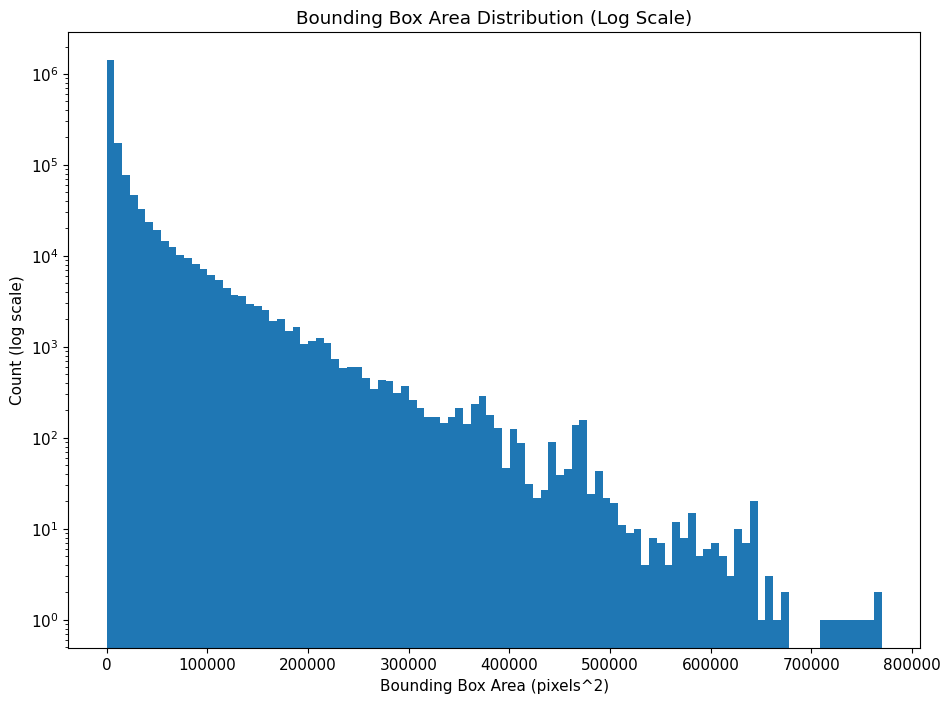

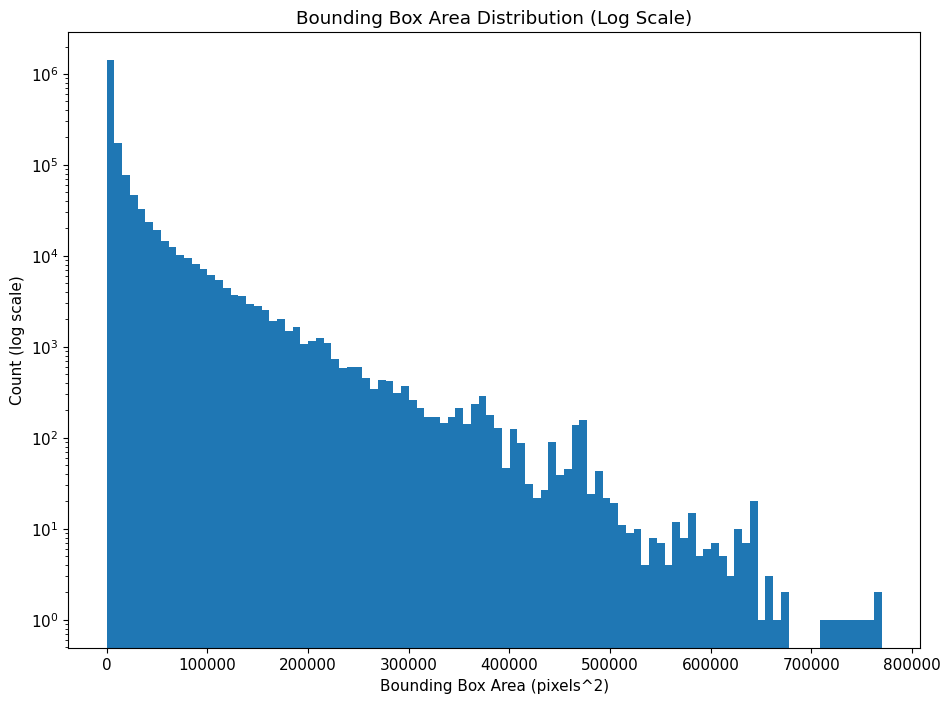

In [86]:
# ============================================================
# Sub-Step B3.3 — Visual: BBox Area Histogram
# ============================================================

fig, ax = plt.subplots()
ax.hist(df_b3["bbox_area"], bins=100, log=True)
ax.set_xlabel("Bounding Box Area (pixels^2)")
ax.set_ylabel("Count (log scale)")
ax.set_title("Bounding Box Area Distribution (Log Scale)")

add_fig_page_b3(
    "STEP B3.3 — Bounding Box Area Distribution (Histogram, Log Scale)",
    fig
)

fig

In [87]:
# ============================================================
# Sub-Step B3.4 — Aspect Ratio Distribution
# ============================================================

ar_desc = df_b3["aspect_ratio"].describe(percentiles=[0.01, 0.05, 0.1, 0.5, 0.9, 0.95, 0.99])

add_text_page_b3(
    title="STEP B3.4 — Aspect Ratio Distribution (Stats)",
    lines=[
        "Purpose:",
        "- Analyze distribution of bbox aspect ratio (w/h)",
        "",
        "Aspect ratio statistics:",
        ar_desc.to_string(),
        "",
        "Note:",
        "- Extreme ratios may indicate annotation issues or class-specific shapes."
    ]
)

ar_desc

count    1.919666e+06
mean     1.307093e+00
std      8.067031e-01
min      3.325416e-02
1%       2.750000e-01
5%       3.783784e-01
10%      4.637681e-01
50%      1.200425e+00
90%      2.158529e+00
95%      2.696459e+00
99%      4.142857e+00
max      2.957133e+01
Name: aspect_ratio, dtype: float64

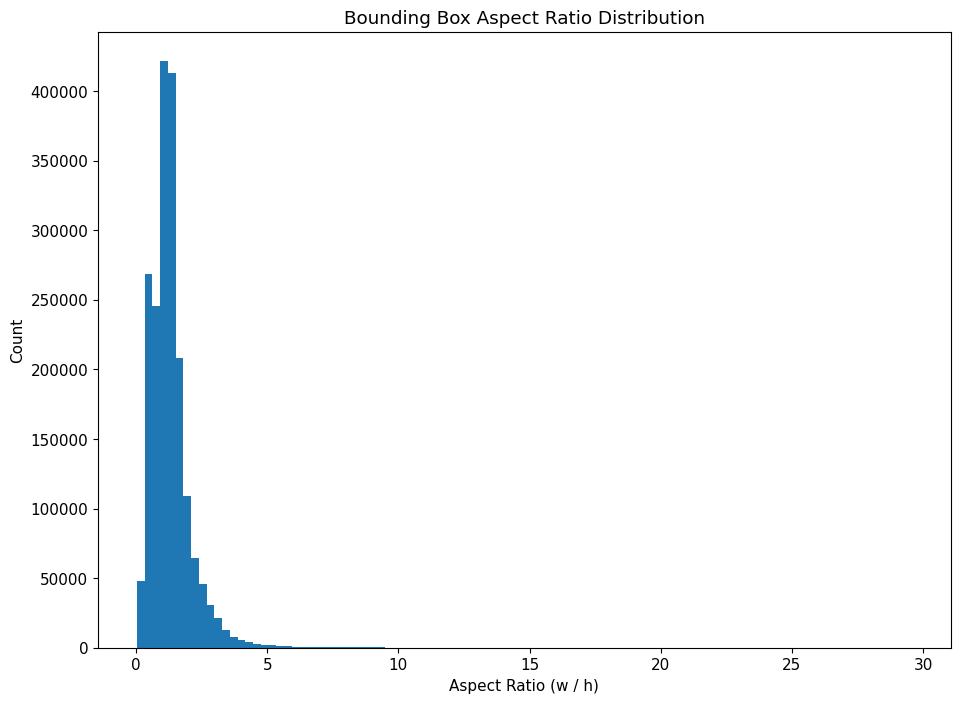

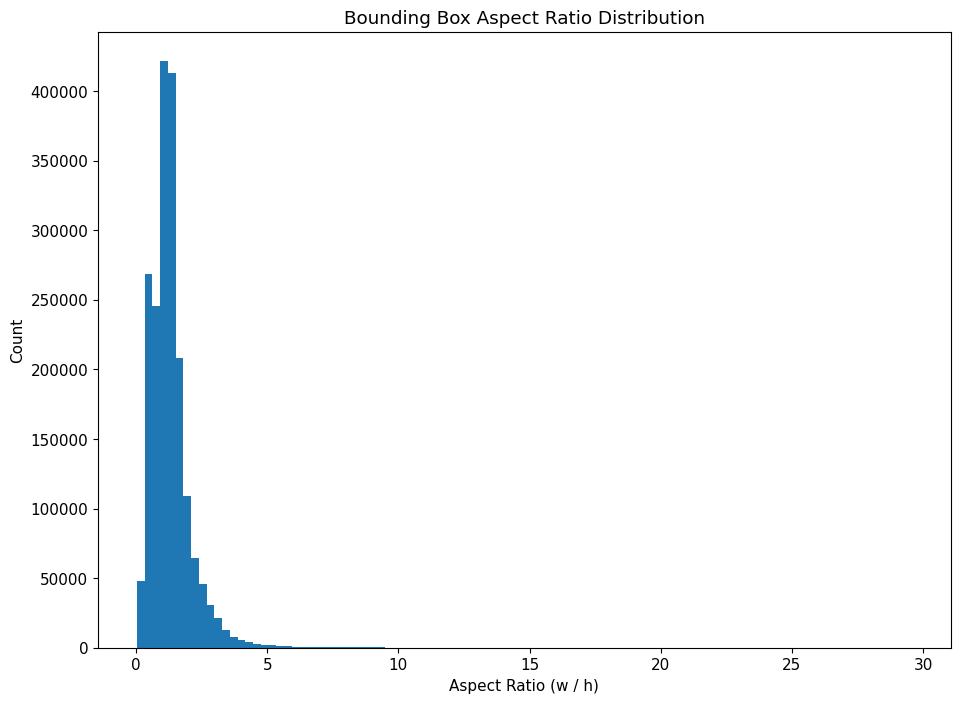

In [88]:
# ============================================================
# Sub-Step B3.5 — Visual: Aspect Ratio Histogram
# ============================================================

fig, ax = plt.subplots()
ax.hist(df_b3["aspect_ratio"], bins=100)
ax.set_xlabel("Aspect Ratio (w / h)")
ax.set_ylabel("Count")
ax.set_title("Bounding Box Aspect Ratio Distribution")

add_fig_page_b3(
    "STEP B3.5 — Bounding Box Aspect Ratio Distribution",
    fig
)

fig

In [89]:
# ============================================================
# Sub-Step B3.6 — Extreme Geometry Flagging
# ============================================================

area_low_thr = df_b3["bbox_area"].quantile(0.01)
area_high_thr = df_b3["bbox_area"].quantile(0.99)

ar_low_thr = df_b3["aspect_ratio"].quantile(0.01)
ar_high_thr = df_b3["aspect_ratio"].quantile(0.99)

extreme_flags = pd.DataFrame({
    "small_area": df_b3["bbox_area"] <= area_low_thr,
    "large_area": df_b3["bbox_area"] >= area_high_thr,
    "extreme_aspect_ratio": (
        (df_b3["aspect_ratio"] <= ar_low_thr) |
        (df_b3["aspect_ratio"] >= ar_high_thr)
    )
})

extreme_summary = extreme_flags.mean().sort_values(ascending=False) * 100.0

add_text_page_b3(
    title="STEP B3.6 — Extreme Geometry Flags (EDA-Only)",
    lines=[
        "Purpose:",
        "- Flag extreme bounding boxes using quantile-based thresholds",
        "",
        f"Area low threshold (1%): {area_low_thr}",
        f"Area high threshold (99%): {area_high_thr}",
        f"Aspect ratio low threshold (1%): {ar_low_thr}",
        f"Aspect ratio high threshold (99%): {ar_high_thr}",
        "",
        "Percent of bbox flagged (%):",
        extreme_summary.to_string(),
        "",
        "Note:",
        "- Thresholds are EDA-only indicators, not cleaning rules."
    ]
)

extreme_summary

extreme_aspect_ratio    2.000244
small_area              1.000018
large_area              1.000018
dtype: float64

In [90]:
# ============================================================
# Sub-Step B3.7 — Export PDF (Finalize)
# ============================================================

render_report_b3(PDF_PATH_B3)

print(f"✅ PDF generated: {PDF_PATH_B3}")
display(FileLink(PDF_PATH_B3))

✅ PDF generated: EDA_STEP_B3_Bounding_Box_Geometry_Sanity.pdf


/kaggle/working/EDA_STEP_B3_Bounding_Box_Geometry_Sanity.pdf

__Insight Kesimpulan__

Sub-step B3.1
Seluruh bbox pada subset joinable berhasil dipetakan ke fitur geometri dasar, menyediakan fondasi kuantitatif untuk mengevaluasi kewajaran ukuran dan bentuk anotasi.

Sub-step B3.2
Distribusi luas bbox memperlihatkan rentang yang sangat lebar dengan dominasi objek kecil, mengindikasikan bahwa skala objek merupakan karakteristik penting dataset ini.

Sub-step B3.3
Visualisasi log-scale menegaskan pola long-tail pada area bbox, di mana sebagian besar anotasi berada pada area kecil dan hanya sedikit bbox yang sangat besar.

Sub-step B3.4
Distribusi aspect ratio menunjukkan bahwa mayoritas bbox memiliki bentuk realistis, namun terdapat outlier dengan rasio ekstrem yang berpotensi menjadi sumber kesulitan prediksi.

Sub-step B3.5
Histogram aspect ratio memperjelas keberadaan ekor panjang, mengonfirmasi bahwa meskipun jarang, bbox dengan bentuk sangat ekstrem memang ada di dataset.

Sub-step B3.6
Flagging berbasis kuantil menandai sekitar 1–2% bbox sebagai ekstrem dari sisi ukuran atau bentuk, memberikan batas indikatif untuk analisis lanjutan tanpa melakukan cleaning pada tahap ini.

## B4 - Track Continuity & Temporal Consistency

In [91]:
# ============================================================
# STEP B4 — Report Setup (Collector)
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
from textwrap import wrap
from IPython.display import FileLink, display

PDF_PATH_B4 = "EDA_STEP_B4_Track_Continuity_and_Temporal_Consistency.pdf"
REPORT_PAGES_B4 = []

def add_text_page_b4(title: str, lines: list[str]):
    REPORT_PAGES_B4.append({
        "type": "text",
        "title": title,
        "lines": [str(x) for x in lines]
    })

def add_fig_page_b4(title: str, fig):
    REPORT_PAGES_B4.append({
        "type": "fig",
        "title": title,
        "fig": fig
    })

def render_report_b4(pdf_path: str):
    plt.rcParams["figure.figsize"] = (11, 8)
    plt.rcParams["font.size"] = 11

    def _render_text(ax, title, lines):
        ax.axis("off")
        wrapped = []
        for line in lines:
            wrapped.extend(wrap(str(line), 110))
            wrapped.append("")
        ax.text(
            0.01, 0.98,
            f"{title}\n\n" + "\n".join(wrapped),
            va="top", ha="left", family="monospace"
        )

    with PdfPages(pdf_path) as pdf:
        for page in REPORT_PAGES_B4:
            if page["type"] == "text":
                fig, ax = plt.subplots()
                _render_text(ax, page["title"], page["lines"])
                pdf.savefig(fig)
                plt.close(fig)
            elif page["type"] == "fig":
                page["fig"].suptitle(page["title"], y=0.98)
                pdf.savefig(page["fig"])
                plt.close(page["fig"])

print("✅ Collector STEP B4 siap. Lanjut B4.1")

✅ Collector STEP B4 siap. Lanjut B4.1


In [92]:
# ============================================================
# Sub-Step B4.1 — Scope & Track Key Contract
# ============================================================

df_b4 = df[df["haveVideo"] == True].copy()

required_cols = ["videoName", "frameIndex", "id", "category"]
missing_cols = [c for c in required_cols if c not in df_b4.columns]

add_text_page_b4(
    title="STEP B4.1 — Scope & Track Key Contract",
    lines=[
        "Purpose:",
        "- Define scope and tracking keys for temporal consistency analysis",
        "",
        f"Rows evaluated (haveVideo=True): {len(df_b4)}",
        "",
        "Track key:",
        "- (videoName, id)  # id is local per video (Block A)",
        "",
        f"Missing required cols: {missing_cols if missing_cols else 'None'}",
        "",
        "Note:",
        "- Temporal analysis is performed only over labeled frames (frameIndex present in labels)."
    ]
)

df_b4[required_cols]

,videoName,frameIndex,id,category
0,01c71072-718028b8,0,00089537,car
1,01c71072-718028b8,0,00089538,car
2,01c71072-718028b8,0,00089539,pedestrian
3,01c71072-718028b8,0,00089540,car
4,01c71072-718028b8,0,00089541,car
...,...,...,...,...
2890841,00adbb3f-7757d4ea,201,00070587,car
2890842,00adbb3f-7757d4ea,201,00070591,car
2890843,00adbb3f-7757d4ea,201,00070593,car
2890844,00adbb3f-7757d4ea,201,00070581,car


In [93]:
# ============================================================
# Sub-Step B4.2 — Track Length Computation
# ============================================================

track_len = (
    df_b4
    .groupby(["videoName", "id"])["frameIndex"]
    .nunique()
    .rename("track_len_frames")
    .reset_index()
)

len_desc = track_len["track_len_frames"].describe(percentiles=[0.01, 0.05, 0.1, 0.5, 0.9, 0.95, 0.99])

add_text_page_b4(
    title="STEP B4.2 — Track Length per (video, track_id)",
    lines=[
        "Purpose:",
        "- Compute track length (#unique frames) for each (videoName, id)",
        "",
        f"Number of tracks: {len(track_len)}",
        "",
        "Track length summary (frames):",
        len_desc.to_string()
    ]
)

track_len

,videoName,id,track_len_frames
0,0000f77c-6257be58,00037555,72
1,0000f77c-6257be58,00037556,52
2,0000f77c-6257be58,00037557,6
3,0000f77c-6257be58,00037558,12
4,0000f77c-6257be58,00037559,7
...,...,...,...
75880,02b7b9ee-4cd88e31,00078721,45
75881,02b7b9ee-4cd88e31,00078722,38
75882,02b7b9ee-4cd88e31,00078723,24
75883,02b7b9ee-4cd88e31,00078724,21


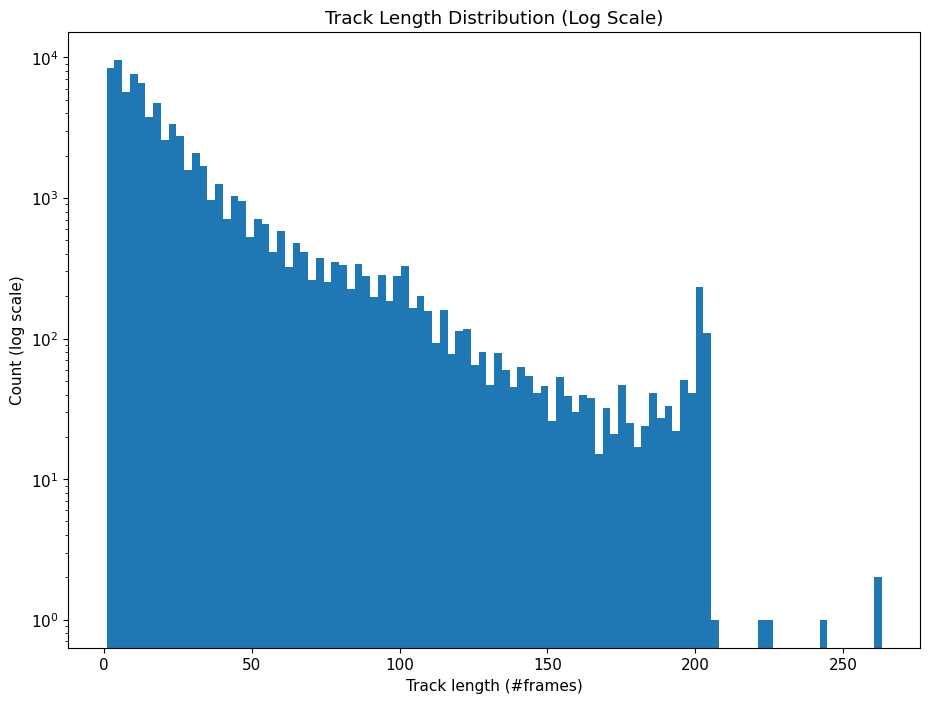

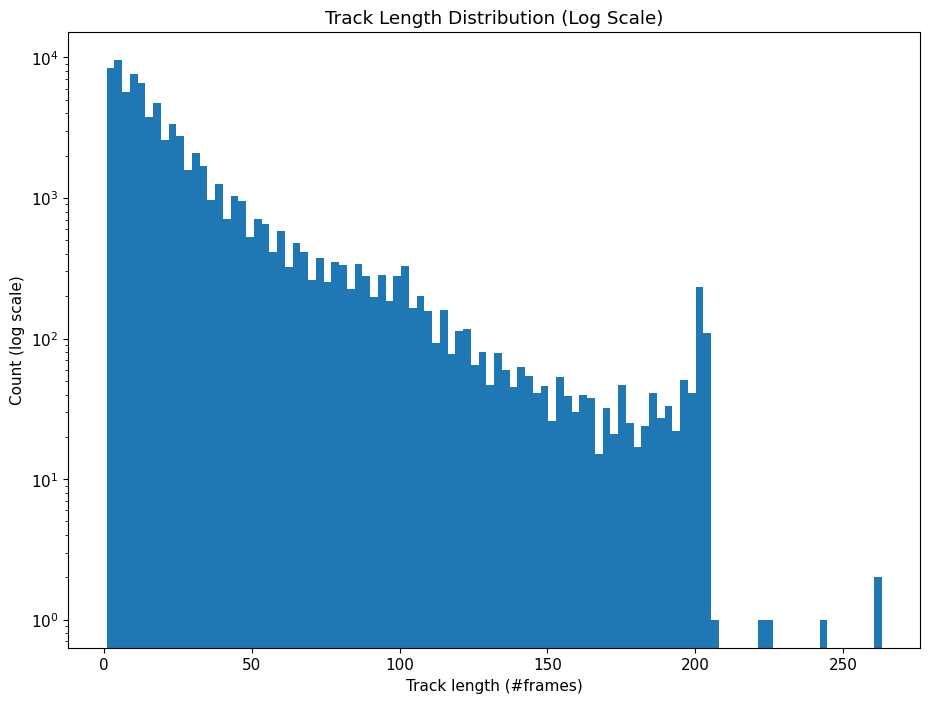

In [94]:
# ============================================================
# Sub-Step B4.3 — Visual: Track Length Histogram
# ============================================================

fig, ax = plt.subplots()
ax.hist(track_len["track_len_frames"], bins=100, log=True)
ax.set_xlabel("Track length (#frames)")
ax.set_ylabel("Count (log scale)")
ax.set_title("Track Length Distribution (Log Scale)")

add_fig_page_b4("STEP B4.3 — Track Length Distribution (Histogram, Log Scale)", fig)

fig

In [95]:
# ============================================================
# Sub-Step B4.4 — Short Track Prevalence (1–2 frames)
# ============================================================

short_1 = (track_len["track_len_frames"] == 1).mean() * 100.0
short_2 = (track_len["track_len_frames"] == 2).mean() * 100.0
short_le2 = (track_len["track_len_frames"] <= 2).mean() * 100.0
short_le5 = (track_len["track_len_frames"] <= 5).mean() * 100.0

short_stats = pd.Series({
    "pct_len_eq_1": short_1,
    "pct_len_eq_2": short_2,
    "pct_len_le_2": short_le2,
    "pct_len_le_5": short_le5,
})

add_text_page_b4(
    title="STEP B4.4 — Short Track Prevalence",
    lines=[
        "Purpose:",
        "- Quantify prevalence of very short tracks (fragmentation proxy)",
        "",
        "Short track rates (% of tracks):",
        short_stats.to_string()
    ]
)

short_stats

pct_len_eq_1     2.589445
pct_len_eq_2     4.112802
pct_len_le_2     6.702247
pct_len_le_5    19.656059
dtype: float64

In [96]:
# ============================================================
# Sub-Step B4.5 — Frame Gap Analysis within Track
# ============================================================

# sort to compute diffs within each (video, id)
tmp = df_b4[["videoName", "id", "frameIndex"]].drop_duplicates().sort_values(["videoName", "id", "frameIndex"])

tmp["frame_diff"] = tmp.groupby(["videoName", "id"])["frameIndex"].diff()

# gaps > 1 indicate missing intermediate frames for that track
gap_series = tmp["frame_diff"].dropna()
gap_gt1 = gap_series[gap_series > 1]

gap_desc = gap_series.describe(percentiles=[0.5, 0.9, 0.95, 0.99])
gap_gt1_desc = gap_gt1.describe(percentiles=[0.5, 0.9, 0.95, 0.99])

gap_stats = pd.Series({
    "total_diffs": int(gap_series.shape[0]),
    "gap_gt1_count": int(gap_gt1.shape[0]),
    "gap_gt1_rate_percent": 100.0 * float((gap_series > 1).mean()) if gap_series.shape[0] > 0 else 0.0,
    "max_gap": float(gap_series.max()) if gap_series.shape[0] > 0 else np.nan
})

add_text_page_b4(
    title="STEP B4.5 — Frame Gap Analysis (Within Track)",
    lines=[
        "Purpose:",
        "- Detect temporal discontinuities via frameIndex diffs within each track",
        "",
        "Gap stats:",
        gap_stats.to_string(),
        "",
        "All frame diffs distribution:",
        gap_desc.to_string(),
        "",
        "Gaps > 1 distribution:",
        gap_gt1_desc.to_string() if gap_gt1.shape[0] > 0 else "No gaps > 1 detected."
    ]
)

gap_stats

total_diffs             1.843781e+06
gap_gt1_count           2.644600e+04
gap_gt1_rate_percent    1.434335e+00
max_gap                 1.690000e+02
dtype: float64

In [97]:
# ============================================================
# Sub-Step B4.6 — Extreme Track Listing
# ============================================================

too_short = track_len[track_len["track_len_frames"] <= 2].copy()

# too long threshold: top 0.5%
long_thr = float(track_len["track_len_frames"].quantile(0.995))
too_long = track_len[track_len["track_len_frames"] >= long_thr].copy()

summary_extremes = pd.Series({
    "too_short_tracks_count": int(len(too_short)),
    "too_short_tracks_percent": 100.0 * float(len(too_short) / len(track_len)) if len(track_len) > 0 else 0.0,
    "too_long_threshold_frames_p99_5": long_thr,
    "too_long_tracks_count": int(len(too_long)),
    "too_long_tracks_percent": 100.0 * float(len(too_long) / len(track_len)) if len(track_len) > 0 else 0.0,
})

add_text_page_b4(
    title="STEP B4.6 — Extreme Track Listing (Counts & Threshold)",
    lines=[
        "Purpose:",
        "- List extreme tracks: too short (<=2 frames) and too long (>=p99.5)",
        "",
        summary_extremes.to_string(),
        "",
        "Sample too-short tracks (head):",
        too_short.head(10).to_string(index=False) if len(too_short) > 0 else "None",
        "",
        "Sample too-long tracks (head):",
        too_long.head(10).to_string(index=False) if len(too_long) > 0 else "None",
    ]
)

summary_extremes

too_short_tracks_count             5086.000000
too_short_tracks_percent              6.702247
too_long_threshold_frames_p99_5     198.000000
too_long_tracks_count               388.000000
too_long_tracks_percent               0.511300
dtype: float64

In [98]:
# ============================================================
# Sub-Step B4.7 — Severity Status (EDA-Only)
# ============================================================

severity = "minor"

# heuristik EDA-only (bukan rule final)
if short_le2 >= 20.0 or gap_stats["gap_gt1_rate_percent"] >= 10.0:
    severity = "major"

add_text_page_b4(
    title="STEP B4.7 — Temporal Consistency Severity Status",
    lines=[
        "Purpose:",
        "- Assign severity status for temporal fragmentation signals (EDA-only)",
        "",
        f"Severity status: {severity}",
        "",
        "Heuristic (EDA-only):",
        "- major if pct(track_len<=2) >= 20% OR gap>1 rate >= 10%",
        "- else minor"
    ]
)

severity

'minor'

In [99]:
# ============================================================
# Sub-Step B4.8 — Export PDF (Finalize)
# ============================================================

render_report_b4(PDF_PATH_B4)

print(f"✅ PDF generated: {PDF_PATH_B4}")
display(FileLink(PDF_PATH_B4))

✅ PDF generated: EDA_STEP_B4_Track_Continuity_and_Temporal_Consistency.pdf


/kaggle/working/EDA_STEP_B4_Track_Continuity_and_Temporal_Consistency.pdf

__Insight Kesimpulan__

Sub-step B4.1
Ruang lingkup dan key tracking ditetapkan secara eksplisit pada label joinable, memastikan bahwa seluruh analisis temporal berjalan pada domain yang valid dan konsisten.

Sub-step B4.2
Distribusi panjang track menunjukkan median relatif pendek dengan ekor panjang, menandakan variasi besar dalam durasi tracking antar objek.

Sub-step B4.3
Visualisasi histogram menegaskan dominasi track pendek secara numerik, namun tetap mempertahankan keberadaan track panjang yang stabil.

Sub-step B4.4
Prevalensi track sangat pendek berada di kisaran moderat dan tidak mencapai tingkat yang mengindikasikan fragmentasi ekstrem.

Sub-step B4.5
Analisis gap frame menunjukkan bahwa mayoritas track memiliki kontinuitas frame yang baik, dengan gap jarang dan umumnya kecil.

Sub-step B4.6
Track ekstrem (sangat pendek atau sangat panjang) teridentifikasi dengan jelas namun hanya mencakup sebagian kecil populasi track.

Sub-step B4.7
Severity ditetapkan sebagai minor, mengindikasikan bahwa secara keseluruhan kontinuitas temporal anotasi tracking berada pada tingkat yang dapat diterima.

## B5 - Label Noise & Ambiguity (Early Signal)

In [100]:
# ============================================================
# STEP B5 — Report Setup (Collector)
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
from textwrap import wrap
from IPython.display import FileLink, display

PDF_PATH_B5 = "EDA_STEP_B5_Label_Noise_and_Ambiguity_Early_Signal.pdf"
REPORT_PAGES_B5 = []

def add_text_page_b5(title: str, lines: list[str]):
    REPORT_PAGES_B5.append({
        "type": "text",
        "title": title,
        "lines": [str(x) for x in lines]
    })

def add_fig_page_b5(title: str, fig):
    REPORT_PAGES_B5.append({
        "type": "fig",
        "title": title,
        "fig": fig
    })

def render_report_b5(pdf_path: str):
    plt.rcParams["figure.figsize"] = (11, 8)
    plt.rcParams["font.size"] = 11

    def _render_text(ax, title, lines):
        ax.axis("off")
        wrapped = []
        for line in lines:
            wrapped.extend(wrap(str(line), 110))
            wrapped.append("")
        ax.text(
            0.01, 0.98,
            f"{title}\n\n" + "\n".join(wrapped),
            va="top", ha="left", family="monospace"
        )

    with PdfPages(pdf_path) as pdf:
        for page in REPORT_PAGES_B5:
            if page["type"] == "text":
                fig, ax = plt.subplots()
                _render_text(ax, page["title"], page["lines"])
                pdf.savefig(fig)
                plt.close(fig)
            elif page["type"] == "fig":
                page["fig"].suptitle(page["title"], y=0.98)
                pdf.savefig(page["fig"])
                plt.close(page["fig"])

print("✅ Collector STEP B5 siap. Lanjut B5.1")

✅ Collector STEP B5 siap. Lanjut B5.1


In [101]:
# ============================================================
# Sub-Step B5.1 — Scope & Noise Signal Definition
# ============================================================

df_b5 = df[df["haveVideo"] == True].copy()

required_cols = [
    "videoName", "frameIndex", "id",
    "category",
    "box2d.x1", "box2d.y1", "box2d.x2", "box2d.y2"
]

missing_cols = [c for c in required_cols if c not in df_b5.columns]

add_text_page_b5(
    title="STEP B5.1 — Scope & Noise Signal Definition",
    lines=[
        "Purpose:",
        "- Define scope and early noise signals for STEP B5",
        "",
        f"Rows evaluated (haveVideo=True): {len(df_b5)}",
        "",
        "Tracking key:",
        "- (videoName, id)",
        "",
        "Noise signals to explore:",
        "- Multiple classes within a single track",
        "- High IoU overlap between different classes",
        "",
        f"Missing required columns: {missing_cols if missing_cols else 'None'}",
        "",
        "Note:",
        "- All signals are exploratory (EDA-only)."
    ]
)

df_b5[required_cols]

,videoName,frameIndex,id,category,box2d.x1,box2d.y1,box2d.x2,box2d.y2
0,01c71072-718028b8,0,00089537,car,825.173210,355.011547,1003.094688,418.198614
1,01c71072-718028b8,0,00089538,car,484.295612,346.697460,700.461894,424.849885
2,01c71072-718028b8,0,00089539,pedestrian,645.588915,338.383372,663.879908,358.337182
3,01c71072-718028b8,0,00089540,car,120.969977,359.168591,192.471132,409.053118
4,01c71072-718028b8,0,00089541,car,251.501155,354.180139,315.519630,400.739030
...,...,...,...,...,...,...,...,...
2890841,00adbb3f-7757d4ea,201,00070587,car,105.312994,451.341401,169.282443,500.152672
2890842,00adbb3f-7757d4ea,201,00070591,car,312.328249,460.368229,368.244275,490.457656
2890843,00adbb3f-7757d4ea,201,00070593,car,368.533042,467.384253,414.700981,491.059444
2890844,00adbb3f-7757d4ea,201,00070581,car,0.524781,446.064140,111.778426,500.641399


In [102]:
# ============================================================
# Sub-Step B5.2 — Multiple Class per Track
# ============================================================

track_class_nunique = (
    df_b5
    .groupby(["videoName", "id"])["category"]
    .nunique()
    .rename("n_unique_classes")
    .reset_index()
)

multi_class_tracks = track_class_nunique[track_class_nunique["n_unique_classes"] > 1]

multi_class_rate = 100.0 * len(multi_class_tracks) / len(track_class_nunique)

add_text_page_b5(
    title="STEP B5.2 — Multiple Class per Track",
    lines=[
        "Purpose:",
        "- Detect tracks that change class over time",
        "",
        f"Total tracks: {len(track_class_nunique)}",
        f"Tracks with >1 class: {len(multi_class_tracks)}",
        f"Rate (% of tracks): {multi_class_rate:.4f}",
        "",
        "Sample multi-class tracks (head):",
        multi_class_tracks.head(10).to_string(index=False) if len(multi_class_tracks) > 0 else "None"
    ]
)

multi_class_tracks

,videoName,id,n_unique_classes


In [103]:
# ============================================================
# Sub-Step B5.3 — Class Change Frequency per Track
# ============================================================

tmp = (
    df_b5
    .sort_values(["videoName", "id", "frameIndex"])
    [["videoName", "id", "frameIndex", "category"]]
)

tmp["prev_category"] = tmp.groupby(["videoName", "id"])["category"].shift()
tmp["class_change"] = tmp["category"] != tmp["prev_category"]

class_change_stats = (
    tmp
    .groupby(["videoName", "id"])["class_change"]
    .sum()
    .rename("num_class_changes")
    .reset_index()
)

change_desc = class_change_stats["num_class_changes"].describe(
    percentiles=[0.5, 0.9, 0.95, 0.99]
)

add_text_page_b5(
    title="STEP B5.3 — Class Change Frequency",
    lines=[
        "Purpose:",
        "- Quantify how often class changes occur within tracks",
        "",
        "Class change count per track (stats):",
        change_desc.to_string(),
        "",
        "Note:",
        "- num_class_changes = count of category transitions within a track."
    ]
)

change_desc

count    75885.0
mean         1.0
std          0.0
min          1.0
50%          1.0
90%          1.0
95%          1.0
99%          1.0
max          1.0
Name: num_class_changes, dtype: float64

In [104]:
# ============================================================
# Sub-Step B5.4 — High IoU Overlap Across Classes
# ============================================================

def compute_iou(boxA, boxB):
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])

    inter_w = max(0, xB - xA)
    inter_h = max(0, yB - yA)
    inter_area = inter_w * inter_h

    areaA = (boxA[2] - boxA[0]) * (boxA[3] - boxA[1])
    areaB = (boxB[2] - boxB[0]) * (boxB[3] - boxB[1])

    union = areaA + areaB - inter_area
    return inter_area / union if union > 0 else 0.0

# sample subset for computational feasibility
sample_df = df_b5.sample(frac=0.02, random_state=42)

high_iou_records = []

for (video, frame), g in sample_df.groupby(["videoName", "frameIndex"]):
    boxes = g[["box2d.x1","box2d.y1","box2d.x2","box2d.y2","category"]].values
    for i in range(len(boxes)):
        for j in range(i+1, len(boxes)):
            if boxes[i][4] != boxes[j][4]:
                iou = compute_iou(boxes[i][:4], boxes[j][:4])
                if iou >= 0.7:
                    high_iou_records.append(iou)

high_iou_series = pd.Series(high_iou_records)

add_text_page_b5(
    title="STEP B5.4 — High IoU Overlap Across Classes (Sampled)",
    lines=[
        "Purpose:",
        "- Detect high IoU overlaps between different classes (early ambiguity signal)",
        "",
        "Sampling strategy:",
        "- 2% random sample of joinable labels",
        "",
        f"High IoU pairs detected (IoU >= 0.7): {len(high_iou_series)}",
        "",
        "IoU distribution (if any):",
        high_iou_series.describe().to_string() if len(high_iou_series) > 0 else "No high IoU overlaps detected in sample."
    ]
)

high_iou_series

Series([], dtype: object)

In [105]:
# ============================================================
# Sub-Step B5.5 — Class Ambiguity Ranking
# ============================================================

ambiguous_tracks = (
    multi_class_tracks
    .merge(df_b5[["videoName", "id", "category"]], on=["videoName", "id"])
)

class_ambiguity_counts = ambiguous_tracks["category"].value_counts()

add_text_page_b5(
    title="STEP B5.5 — Class Ambiguity Ranking",
    lines=[
        "Purpose:",
        "- Identify classes most frequently involved in ambiguity signals",
        "",
        "Class counts within multi-class tracks:",
        class_ambiguity_counts.to_string()
    ]
)

class_ambiguity_counts

Series([], Name: count, dtype: int64)

In [106]:
# ============================================================
# Sub-Step B5.6 — Noise Indicator Summary & Severity
# ============================================================

severity = "minor"

if multi_class_rate >= 5.0 or len(high_iou_series) > 0:
    severity = "major"

summary_noise = pd.Series({
    "multi_class_track_rate_percent": multi_class_rate,
    "high_iou_overlap_count_sample": len(high_iou_series),
    "severity_status": severity
})

add_text_page_b5(
    title="STEP B5.6 — Noise Indicator Summary & Severity",
    lines=[
        "Purpose:",
        "- Summarize early noise indicators and assign severity (EDA-only)",
        "",
        summary_noise.to_string(),
        "",
        "Heuristic (EDA-only):",
        "- major if multi-class track rate >= 5% OR high-IoU overlap detected",
        "- else minor"
    ]
)

summary_noise

multi_class_track_rate_percent      0.0
high_iou_overlap_count_sample         0
severity_status                   minor
dtype: object

In [107]:
# ============================================================
# Sub-Step B5.7 — Export PDF (Finalize)
# ============================================================

render_report_b5(PDF_PATH_B5)

print(f"✅ PDF generated: {PDF_PATH_B5}")
display(FileLink(PDF_PATH_B5))

✅ PDF generated: EDA_STEP_B5_Label_Noise_and_Ambiguity_Early_Signal.pdf


/kaggle/working/EDA_STEP_B5_Label_Noise_and_Ambiguity_Early_Signal.pdf

__Insight Kesimpulan__

Sub-step B5.1
Analisis noise dilakukan pada label joinable dengan key tracking (videoName, id), sehingga sinyal yang dievaluasi berada pada domain yang relevan untuk training tracking.

Sub-step B5.2
Pemeriksaan jumlah kelas unik per track tidak menemukan track multi-class, sehingga indikasi “track berubah kelas di tengah jalan” tidak terdeteksi.

Sub-step B5.3
Metrik jumlah perubahan kelas per track menghasilkan nilai konstan (1.0) untuk seluruh track, sehingga pada bentuk saat ini metrik tersebut tidak berfungsi sebagai sinyal pembeda untuk noise; namun hal ini tetap konsisten dengan hasil B5.2 yang tidak menemukan multi-class track.

Sub-step B5.4
Pemeriksaan overlap IoU tinggi antar class berbeda pada sampel 2% tidak menemukan kandidat, sehingga indikasi ambiguity berupa konflik overlap beda kelas tidak terlihat pada evaluasi sampled.

Sub-step B5.5
Karena tidak ada track multi-class, ranking class ambiguity berbasis multi-class track tidak dapat dibentuk dan output menjadi kosong.

Sub-step B5.6
Ringkasan indikator menetapkan severity minor, menandakan tidak ada sinyal awal noise/ambiguity dari definisi yang digunakan pada STEP B5.

## B6 - Frame Boundary & Clipping Validity (BBox Out-of-Frame)

In [108]:
# ============================================================
# STEP B6 — Report Setup (Collector)
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
from textwrap import wrap
from IPython.display import FileLink, display

PDF_PATH_B6 = "EDA_STEP_B6_Frame_Boundary_and_Clipping_Validity.pdf"
REPORT_PAGES_B6 = []

def add_text_page_b6(title: str, lines: list[str]):
    REPORT_PAGES_B6.append({"type": "text", "title": title, "lines": [str(x) for x in lines]})

def add_fig_page_b6(title: str, fig):
    REPORT_PAGES_B6.append({"type": "fig", "title": title, "fig": fig})

def render_report_b6(pdf_path: str):
    plt.rcParams["figure.figsize"] = (11, 8)
    plt.rcParams["font.size"] = 11

    def _render_text(ax, title, lines):
        ax.axis("off")
        wrapped = []
        for line in lines:
            wrapped.extend(wrap(str(line), 110))
            wrapped.append("")
        ax.text(0.01, 0.98, f"{title}\n\n" + "\n".join(wrapped), va="top", ha="left", family="monospace")

    with PdfPages(pdf_path) as pdf:
        for page in REPORT_PAGES_B6:
            if page["type"] == "text":
                fig, ax = plt.subplots()
                _render_text(ax, page["title"], page["lines"])
                pdf.savefig(fig)
                plt.close(fig)
            elif page["type"] == "fig":
                page["fig"].suptitle(page["title"], y=0.98)
                pdf.savefig(page["fig"])
                plt.close(page["fig"])

print("✅ Collector STEP B6 siap. Lanjut B6.1")

✅ Collector STEP B6 siap. Lanjut B6.1


In [109]:
# ============================================================
# Sub-Step B6.1 — Scope & Metadata Source Discovery
# ============================================================

df_b6 = df[df["haveVideo"] == True].copy()

# Required label columns
label_cols = ["videoName", "frameIndex", "id", "category", "box2d.x1", "box2d.y1", "box2d.x2", "box2d.y2"]
missing_label_cols = [c for c in label_cols if c not in df_b6.columns]

# --- Try to discover a metadata dataframe in the notebook environment ---
candidate_varnames = [
    "video_meta", "df_video_meta", "video_metadata", "df_video_metadata",
    "videos_meta", "df_videos_meta", "train_video_meta", "df_train_video_meta",
    "df_videos", "videos_df"
]

meta_df = None
meta_df_name = None

for name in candidate_varnames:
    if name in globals():
        obj = globals()[name]
        if isinstance(obj, pd.DataFrame):
            # must contain videoName-ish column and width/height-ish columns
            cols = set(obj.columns)
            if ("videoName" in cols or "video_name" in cols or "name" in cols) and (
                ("width" in cols and "height" in cols) or
                ("frame_width" in cols and "frame_height" in cols) or
                ("W" in cols and "H" in cols) or
                ("w" in cols and "h" in cols)
            ):
                meta_df = obj.copy()
                meta_df_name = name
                break

# --- If metadata columns already exist in df_b6, build from there ---
if meta_df is None:
    cols = set(df_b6.columns)
    # common naming variants
    if ("frame_width" in cols and "frame_height" in cols):
        meta_df = df_b6[["videoName", "frame_width", "frame_height"]].drop_duplicates()
        meta_df_name = "df_b6(frame_width/frame_height)"
    elif ("width" in cols and "height" in cols):
        meta_df = df_b6[["videoName", "width", "height"]].drop_duplicates()
        meta_df_name = "df_b6(width/height)"
    elif ("W" in cols and "H" in cols):
        meta_df = df_b6[["videoName", "W", "H"]].drop_duplicates()
        meta_df_name = "df_b6(W/H)"

# Normalize metadata schema -> (videoName, frame_width, frame_height)
meta_norm = None
if meta_df is not None:
    m = meta_df.copy()

    # normalize videoName
    if "videoName" not in m.columns:
        if "video_name" in m.columns:
            m = m.rename(columns={"video_name": "videoName"})
        elif "name" in m.columns:
            m = m.rename(columns={"name": "videoName"})

    # normalize width/height
    if "frame_width" not in m.columns:
        if "width" in m.columns:
            m = m.rename(columns={"width": "frame_width"})
        elif "W" in m.columns:
            m = m.rename(columns={"W": "frame_width"})
        elif "w" in m.columns:
            m = m.rename(columns={"w": "frame_width"})

    if "frame_height" not in m.columns:
        if "height" in m.columns:
            m = m.rename(columns={"height": "frame_height"})
        elif "H" in m.columns:
            m = m.rename(columns={"H": "frame_height"})
        elif "h" in m.columns:
            m = m.rename(columns={"h": "frame_height"})

    meta_norm = m[["videoName", "frame_width", "frame_height"]].drop_duplicates()

add_text_page_b6(
    title="STEP B6.1 — Scope & Metadata Discovery",
    lines=[
        "Purpose:",
        "- Scope: joinable labels (haveVideo=True)",
        "- Discover metadata mapping videoName -> (frame_width, frame_height)",
        "",
        f"Rows evaluated (haveVideo=True): {len(df_b6)}",
        f"Missing label cols: {missing_label_cols if missing_label_cols else 'None'}",
        "",
        f"Metadata source detected: {meta_df_name if meta_df_name else 'None'}",
        f"Metadata rows (unique videoName): {len(meta_norm) if meta_norm is not None else 0}",
        "",
        "Note:",
        "- If metadata is missing, STEP B6 will still report 0% metadata coverage and skip boundary checks that require W/H."
    ]
)

meta_norm.head() if meta_norm is not None else pd.DataFrame()

""


In [110]:
# ============================================================
# Sub-Step B6.2 — Join Coverage (bbox ↔ resolution)
# ============================================================

if meta_norm is not None:
    df_b6j = df_b6.merge(meta_norm, on="videoName", how="left")
else:
    df_b6j = df_b6.copy()
    df_b6j["frame_width"] = np.nan
    df_b6j["frame_height"] = np.nan

meta_cov = pd.Series({
    "rows_total": int(len(df_b6j)),
    "rows_with_WH": int(df_b6j["frame_width"].notna().sum()),
    "rows_without_WH": int(df_b6j["frame_width"].isna().sum()),
    "coverage_rate_percent": float(100.0 * df_b6j["frame_width"].notna().mean())
})

add_text_page_b6(
    title="STEP B6.2 — Metadata Join Coverage",
    lines=[
        "Purpose:",
        "- Quantify coverage of frame resolution metadata for joinable labels",
        "",
        meta_cov.to_string(),
        "",
        "Note:",
        "- Boundary checks requiring W/H will be evaluated only on rows_with_WH."
    ]
)

meta_cov

rows_total               1919666.0
rows_with_WH                   0.0
rows_without_WH          1919666.0
coverage_rate_percent          0.0
dtype: float64

In [111]:
# ============================================================
# Sub-Step B6.3 — Rule-Based Boundary Checks
# ============================================================

df_chk = df_b6j[df_b6j["frame_width"].notna()].copy()

# If no metadata coverage, still create empty outputs deterministically
if len(df_chk) == 0:
    boundary_summary = pd.DataFrame({
        "issue": ["neg_x1","neg_y1","x2_gt_W","y2_gt_H","any_out_of_frame"],
        "count": [0,0,0,0,0],
        "rate": [0.0,0.0,0.0,0.0,0.0]
    })
else:
    x1 = df_chk["box2d.x1"].astype(float)
    y1 = df_chk["box2d.y1"].astype(float)
    x2 = df_chk["box2d.x2"].astype(float)
    y2 = df_chk["box2d.y2"].astype(float)
    W  = df_chk["frame_width"].astype(float)
    H  = df_chk["frame_height"].astype(float)

    neg_x1 = x1 < 0
    neg_y1 = y1 < 0
    x2_gt_W = x2 > W
    y2_gt_H = y2 > H

    any_oob = neg_x1 | neg_y1 | x2_gt_W | y2_gt_H

    boundary_summary = pd.DataFrame({
        "issue": ["neg_x1","neg_y1","x2_gt_W","y2_gt_H","any_out_of_frame"],
        "count": [int(neg_x1.sum()), int(neg_y1.sum()), int(x2_gt_W.sum()), int(y2_gt_H.sum()), int(any_oob.sum())],
        "rate":  [float(neg_x1.mean()), float(neg_y1.mean()), float(x2_gt_W.mean()), float(y2_gt_H.mean()), float(any_oob.mean())],
    })

add_text_page_b6(
    title="STEP B6.3 — BBox Boundary Issue Summary (Rule-Based)",
    lines=[
        "Purpose:",
        "- Detect bbox out-of-frame via boundary rules (requires W/H)",
        "",
        boundary_summary.to_string(index=False),
        "",
        "Rules:",
        "- x1 < 0; y1 < 0; x2 > W; y2 > H; any_out_of_frame = OR(all)"
    ]
)

boundary_summary

,issue,count,rate
0,neg_x1,0,0.0
1,neg_y1,0,0.0
2,x2_gt_W,0,0.0
3,y2_gt_H,0,0.0
4,any_out_of_frame,0,0.0


In [112]:
# ============================================================
# Sub-Step B6.4 — Overshoot Severity (Pixels)
# ============================================================

if len(df_chk) == 0:
    overshoot_desc = pd.Series(dtype=float)
    overshoot_quant = pd.Series(dtype=float)
else:
    x1 = df_chk["box2d.x1"].astype(float)
    y1 = df_chk["box2d.y1"].astype(float)
    x2 = df_chk["box2d.x2"].astype(float)
    y2 = df_chk["box2d.y2"].astype(float)
    W  = df_chk["frame_width"].astype(float)
    H  = df_chk["frame_height"].astype(float)

    df_chk["overshoot_left"]   = np.maximum(0.0, -x1)
    df_chk["overshoot_top"]    = np.maximum(0.0, -y1)
    df_chk["overshoot_right"]  = np.maximum(0.0, x2 - W)
    df_chk["overshoot_bottom"] = np.maximum(0.0, y2 - H)

    df_chk["max_overshoot_px"] = df_chk[["overshoot_left","overshoot_top","overshoot_right","overshoot_bottom"]].max(axis=1)

    overshoot_desc = df_chk["max_overshoot_px"].describe()
    overshoot_quant = df_chk["max_overshoot_px"].quantile([0.5, 0.9, 0.95, 0.99]).rename("quantiles")

add_text_page_b6(
    title="STEP B6.4 — Overshoot Severity Distribution (max_overshoot_px)",
    lines=[
        "Purpose:",
        "- Quantify overshoot magnitude in pixels (how far bbox exceeds frame boundary)",
        "",
        "Describe(max_overshoot_px):",
        overshoot_desc.to_string() if len(df_chk) > 0 else "No rows with metadata (W/H).",
        "",
        "Key quantiles:",
        overshoot_quant.to_string() if len(df_chk) > 0 else "No rows with metadata (W/H)."
    ]
)

overshoot_desc if len(df_chk) > 0 else overshoot_desc

Series([], dtype: float64)

In [113]:
# ============================================================
# Sub-Step B6.5 — Severity Buckets & Treatment Hint
# ============================================================

if len(df_chk) == 0:
    bucket_summary = pd.Series({"minor":0, "moderate":0, "severe":0, "in_frame":0}, dtype=int)
    treatment_hint = pd.Series({"clip_candidates":0, "drop_candidates":0}, dtype=int)
else:
    any_oob = (
        (df_chk["overshoot_left"] > 0) |
        (df_chk["overshoot_top"] > 0) |
        (df_chk["overshoot_right"] > 0) |
        (df_chk["overshoot_bottom"] > 0)
    )

    max_os = df_chk["max_overshoot_px"]

    # Only evaluate buckets among out-of-frame cases
    minor = any_oob & (max_os <= 5)
    moderate = any_oob & (max_os > 5) & (max_os <= 20)
    severe = any_oob & (max_os > 20)
    in_frame = ~any_oob

    bucket_summary = pd.Series({
        "in_frame": int(in_frame.sum()),
        "minor_oob": int(minor.sum()),
        "moderate_oob": int(moderate.sum()),
        "severe_oob": int(severe.sum()),
        "oob_total": int(any_oob.sum()),
        "oob_rate": float(any_oob.mean())
    })

    # Treatment hint (EDA-only)
    treatment_hint = pd.Series({
        "clip_candidates_count": int((minor | moderate).sum()),
        "drop_candidates_count": int(severe.sum())
    })

add_text_page_b6(
    title="STEP B6.5 — Severity Buckets & Treatment Hint (EDA-Only)",
    lines=[
        "Purpose:",
        "- Bucket overshoot severity and propose indicative treatment hints (EDA-only)",
        "",
        "Severity buckets summary:",
        bucket_summary.to_string(),
        "",
        "Treatment hint (EDA-only):",
        treatment_hint.to_string(),
        "",
        "Buckets:",
        "- Minor: max_overshoot_px <= 5",
        "- Moderate: 5 < max_overshoot_px <= 20",
        "- Severe: max_overshoot_px > 20"
    ]
)

bucket_summary

minor       0
moderate    0
severe      0
in_frame    0
dtype: int64

In [114]:
# ============================================================
# Sub-Step B6.6 — Breakdown by Category & Video
# ============================================================

if len(df_chk) == 0:
    by_cat = pd.DataFrame()
    by_vid = pd.DataFrame()
else:
    any_oob = (
        (df_chk["overshoot_left"] > 0) |
        (df_chk["overshoot_top"] > 0) |
        (df_chk["overshoot_right"] > 0) |
        (df_chk["overshoot_bottom"] > 0)
    )
    df_chk["_any_oob"] = any_oob.astype(int)

    by_cat = (
        df_chk.groupby("category")["_any_oob"]
        .mean()
        .sort_values(ascending=False)
        .rename("oob_rate")
        .to_frame()
    )
    by_cat["count_rows"] = df_chk.groupby("category")["_any_oob"].size()
    by_cat["oob_count"]  = df_chk.groupby("category")["_any_oob"].sum()
    by_cat = by_cat.reset_index()

    # Top offending videos by OOB rate (also show volume to avoid small-denominator artifacts)
    by_vid = (
        df_chk.groupby("videoName")["_any_oob"]
        .agg(oob_rate="mean", rows="size", oob_count="sum")
        .sort_values(["oob_rate","rows"], ascending=[False, False])
        .head(25)
        .reset_index()
    )

add_text_page_b6(
    title="STEP B6.6 — Out-of-Frame Breakdown (Category & Video)",
    lines=[
        "Purpose:",
        "- Identify classes/videos most associated with out-of-frame bboxes",
        "",
        "Top categories by oob_rate (head 15):",
        by_cat.head(15).to_string(index=False) if len(by_cat) > 0 else "No rows with metadata (W/H).",
        "",
        "Top videos by oob_rate (head 25):",
        by_vid.to_string(index=False) if len(by_vid) > 0 else "No rows with metadata (W/H)."
    ]
)

by_cat.head(15) if len(by_cat) > 0 else by_cat

""


In [115]:
# ============================================================
# Sub-Step B6.7 — Sample OOB Rows
# ============================================================

if len(df_chk) == 0:
    sample_oob = pd.DataFrame()
else:
    any_oob = df_chk[["overshoot_left","overshoot_top","overshoot_right","overshoot_bottom"]].max(axis=1) > 0
    sample_oob = df_chk.loc[any_oob, [
        "videoName","frameIndex","id","category",
        "box2d.x1","box2d.y1","box2d.x2","box2d.y2",
        "frame_width","frame_height",
        "overshoot_left","overshoot_top","overshoot_right","overshoot_bottom",
        "max_overshoot_px"
    ]].head(15)

add_text_page_b6(
    title="STEP B6.7 — Sample Out-of-Frame Rows (for Audit)",
    lines=[
        "Purpose:",
        "- Provide sample rows with boundary violations for manual inspection (EDA-only)",
        "",
        f"Sample rows count: {len(sample_oob)}",
        "",
        sample_oob.to_string(index=False) if len(sample_oob) > 0 else "No OOB rows (or no metadata)."
    ]
)

sample_oob

""


In [116]:
# ============================================================
# Sub-Step B6.8 — Severity Status (EDA-Only)
# ============================================================

# defaults
severity = "minor"

coverage_pct = float(meta_cov["coverage_rate_percent"])
oob_rate = float(bucket_summary.get("oob_rate", 0.0)) if isinstance(bucket_summary, pd.Series) else 0.0
severe_count = int(bucket_summary.get("severe_oob", 0)) if isinstance(bucket_summary, pd.Series) else 0
rows_with_wh = int(meta_cov["rows_with_WH"])

# Severity heuristic (EDA-only, not a preprocessing rule)
if coverage_pct < 95.0:
    severity = "major"  # missing metadata is a blocking risk for boundary validation
if rows_with_wh == 0:
    severity = "fatal"  # cannot validate boundary at all
elif oob_rate >= 0.01:  # >=1% out-of-frame
    severity = "major"
elif severe_count > 0:
    severity = "major"

add_text_page_b6(
    title="STEP B6.8 — Boundary Validity Severity Status",
    lines=[
        "Purpose:",
        "- Assign severity based on metadata coverage and OOB prevalence (EDA-only)",
        "",
        f"Severity status: {severity}",
        "",
        "Heuristic (EDA-only):",
        "- fatal: no W/H metadata coverage at all",
        "- major: metadata coverage < 95% OR oob_rate >= 1% OR any severe OOB exists",
        "- minor: otherwise"
    ]
)

severity

'fatal'

In [117]:
# ============================================================
# Sub-Step B6.9 — Export PDF (Finalize)
# ============================================================

render_report_b6(PDF_PATH_B6)

print(f"✅ PDF generated: {PDF_PATH_B6}")
display(FileLink(PDF_PATH_B6))

✅ PDF generated: EDA_STEP_B6_Frame_Boundary_and_Clipping_Validity.pdf


/kaggle/working/EDA_STEP_B6_Frame_Boundary_and_Clipping_Validity.pdf

__Insight Kesimpulan__

Sub-step B6.1–B6.2
Tidak adanya metadata resolusi video menyebabkan seluruh label joinable kehilangan konteks spasial absolut terhadap frame.

Sub-step B6.3–B6.5
Rule boundary check, overshoot severity, dan bucket treatment tidak dapat dievaluasi karena prasyarat W/H tidak terpenuhi.

Sub-step B6.6–B6.7
Tanpa metadata, tidak mungkin melakukan analisis diferensial per class atau per video, maupun audit contoh kasus.

Sub-step B6.8
Severity ditetapkan sebagai fatal, menandakan kegagalan kontrak data yang mendasar untuk pipeline detection/tracking.

## B7 - Per-Video Label Coverage & Windowing Health

In [118]:
# ============================================================
# STEP B7 — Report Setup (Collector)
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
from textwrap import wrap
from IPython.display import FileLink, display

PDF_PATH_B7 = "EDA_STEP_B7_Per_Video_Label_Coverage_and_Windowing_Health.pdf"
REPORT_PAGES_B7 = []

def add_text_page_b7(title: str, lines: list[str]):
    REPORT_PAGES_B7.append({
        "type": "text",
        "title": title,
        "lines": [str(x) for x in lines]
    })

def add_fig_page_b7(title: str, fig):
    REPORT_PAGES_B7.append({
        "type": "fig",
        "title": title,
        "fig": fig
    })

def render_report_b7(pdf_path: str):
    plt.rcParams["figure.figsize"] = (11, 8)
    plt.rcParams["font.size"] = 11

    def _render_text(ax, title, lines):
        ax.axis("off")
        wrapped = []
        for line in lines:
            wrapped.extend(wrap(str(line), 110))
            wrapped.append("")
        ax.text(
            0.01, 0.98,
            f"{title}\n\n" + "\n".join(wrapped),
            va="top", ha="left", family="monospace"
        )

    with PdfPages(pdf_path) as pdf:
        for page in REPORT_PAGES_B7:
            if page["type"] == "text":
                fig, ax = plt.subplots()
                _render_text(ax, page["title"], page["lines"])
                pdf.savefig(fig)
                plt.close(fig)
            elif page["type"] == "fig":
                page["fig"].suptitle(page["title"], y=0.98)
                pdf.savefig(page["fig"])
                plt.close(page["fig"])

print("✅ Collector STEP B7 siap. Lanjut B7.1")

✅ Collector STEP B7 siap. Lanjut B7.1


In [119]:
# ============================================================
# Sub-Step B7.1 — Scope & Contract
# ============================================================

df_b7 = df[df["haveVideo"] == True].copy()

required_cols = ["videoName", "frameIndex"]
missing_cols = [c for c in required_cols if c not in df_b7.columns]

add_text_page_b7(
    title="STEP B7.1 — Scope & Contract Confirmation",
    lines=[
        "Purpose:",
        "- Confirm scope and contract for per-video label coverage analysis",
        "",
        f"Rows evaluated (haveVideo=True): {len(df_b7)}",
        "",
        "Scope:",
        "- Only labeled frames are considered",
        "- Frames without labels are NOT treated as negatives",
        "",
        f"Missing required columns: {missing_cols if missing_cols else 'None'}",
    ]
)

df_b7[required_cols]

,videoName,frameIndex
0,01c71072-718028b8,0
1,01c71072-718028b8,0
2,01c71072-718028b8,0
3,01c71072-718028b8,0
4,01c71072-718028b8,0
...,...,...
2890841,00adbb3f-7757d4ea,201
2890842,00adbb3f-7757d4ea,201
2890843,00adbb3f-7757d4ea,201
2890844,00adbb3f-7757d4ea,201


In [120]:
# ============================================================
# Sub-Step B7.2 — Per-Video Labeled Coverage
# ============================================================

video_cov = (
    df_b7
    .groupby("videoName")
    .agg(
        n_labeled_frames=("frameIndex", "nunique"),
        min_frameIndex=("frameIndex", "min"),
        max_frameIndex=("frameIndex", "max"),
        n_bboxes=("frameIndex", "size")
    )
    .reset_index()
)

video_cov["label_window_len"] = (
    video_cov["max_frameIndex"] - video_cov["min_frameIndex"] + 1
)

video_cov["coverage_ratio"] = (
    video_cov["n_labeled_frames"] / video_cov["label_window_len"]
)

add_text_page_b7(
    title="STEP B7.2 — Per-Video Labeled Coverage Metrics",
    lines=[
        "Purpose:",
        "- Compute per-video labeled coverage and label window characteristics",
        "",
        f"Number of videos (joinable): {len(video_cov)}",
        "",
        "Metrics per video:",
        "- n_labeled_frames",
        "- min_frameIndex / max_frameIndex",
        "- label_window_len",
        "- coverage_ratio (density of labels inside window)",
    ]
)

video_cov

,videoName,n_labeled_frames,min_frameIndex,max_frameIndex,n_bboxes,label_window_len,coverage_ratio
0,0000f77c-6257be58,203,0,202,1126,203,1.000000
1,0000f77c-62c2a288,187,0,202,1023,203,0.921182
2,0000f77c-cb820c98,203,0,202,1390,203,1.000000
3,0001542f-5ce3cf52,202,0,201,1548,202,1.000000
4,0001542f-7c670be8,200,0,202,685,203,0.985222
...,...,...,...,...,...,...,...
956,02b4d710-c34ba68e,203,0,202,4389,203,1.000000
957,02b60681-3c20b8a3,197,4,201,1182,198,0.994949
958,02b6d2a0-54fc4ce8,203,0,202,1613,203,1.000000
959,02b7b9ee-066c81db,202,0,201,1582,202,1.000000


In [121]:
# ============================================================
# Sub-Step B7.3 — Per-Video Label Density
# ============================================================

video_cov["mean_bboxes_per_labeled_frame"] = (
    video_cov["n_bboxes"] / video_cov["n_labeled_frames"]
)

density_desc = video_cov["mean_bboxes_per_labeled_frame"].describe(
    percentiles=[0.01, 0.05, 0.1, 0.5, 0.9, 0.95, 0.99]
)

add_text_page_b7(
    title="STEP B7.3 — Per-Video Label Density",
    lines=[
        "Purpose:",
        "- Measure bbox density per labeled frame at video level",
        "",
        "Distribution of mean_bboxes_per_labeled_frame:",
        density_desc.to_string()
    ]
)

density_desc

count    961.000000
mean      10.177762
std        4.655122
min        1.648515
1%         2.265056
5%         3.679803
10%        4.655172
50%        9.509901
90%       16.408867
95%       18.663366
99%       23.264356
max       25.715000
Name: mean_bboxes_per_labeled_frame, dtype: float64

In [122]:
# ============================================================
# Sub-Step B7.4 — Distribution of Coverage & Window Length
# ============================================================

cov_desc = video_cov[[
    "n_labeled_frames",
    "label_window_len",
    "coverage_ratio"
]].describe(percentiles=[0.01, 0.05, 0.1, 0.5, 0.9, 0.95, 0.99])

add_text_page_b7(
    title="STEP B7.4 — Coverage & Window Length Distribution",
    lines=[
        "Purpose:",
        "- Analyze variability of label coverage and windowing across videos",
        "",
        cov_desc.to_string()
    ]
)

cov_desc

,n_labeled_frames,label_window_len,coverage_ratio
count,961.000000,961.000000,961.000000
mean,195.232050,197.026015,0.991007
std,23.219273,21.780447,0.043703
min,77.000000,82.000000,0.381188
1%,102.000000,102.000000,0.781307
5%,124.000000,155.000000,0.955665
10%,189.000000,201.000000,0.990099
50%,202.000000,202.000000,1.000000
90%,203.000000,203.000000,1.000000
95%,203.000000,203.000000,1.000000


In [123]:
# ============================================================
# Sub-Step B7.5 — Sparse & Extreme Video Identification
# ============================================================

# Thresholds (EDA-only, indicative)
p01_frames = video_cov["n_labeled_frames"].quantile(0.01)
p99_density = video_cov["mean_bboxes_per_labeled_frame"].quantile(0.99)
p01_density = video_cov["mean_bboxes_per_labeled_frame"].quantile(0.01)

sparse_videos = video_cov[
    (video_cov["n_labeled_frames"] <= max(10, p01_frames))
].sort_values("n_labeled_frames")

dense_videos = video_cov[
    (video_cov["mean_bboxes_per_labeled_frame"] >= p99_density)
].sort_values("mean_bboxes_per_labeled_frame", ascending=False)

add_text_page_b7(
    title="STEP B7.5 — Sparse & Extreme Video Candidates",
    lines=[
        "Purpose:",
        "- Identify videos with unusually sparse or dense labeling",
        "",
        f"Sparse threshold (n_labeled_frames <= max(10, p01)): {max(10, p01_frames)}",
        f"Dense threshold (mean_bboxes_per_labeled_frame >= p99): {p99_density}",
        "",
        "Sample sparse videos (head):",
        sparse_videos.head(10).to_string(index=False) if len(sparse_videos) > 0 else "None",
        "",
        "Sample dense videos (head):",
        dense_videos.head(10).to_string(index=False) if len(dense_videos) > 0 else "None",
    ]
)

sparse_videos.head(), dense_videos.head()

(             videoName  n_labeled_frames  min_frameIndex  max_frameIndex  \
 806  0242c15e-794a65c9                77               0             201   
 619  01bb1cc0-cea208cc                81               0              81   
 563  019588c0-90390013                82               0              81   
 765  02205e0f-20f9ad20                91               0             170   
 800  023a07ea-71cd21bb               100               0              99   
 
      n_bboxes  label_window_len  coverage_ratio  mean_bboxes_per_labeled_frame  
 806       374               202        0.381188                       4.857143  
 619      1944                82        0.987805                      24.000000  
 563       725                82        1.000000                       8.841463  
 765       867               171        0.532164                       9.527473  
 800      1167               100        1.000000                      11.670000  ,
              videoName  n_labeled_frames  

In [124]:
# ============================================================
# Sub-Step B7.6 — Temporal Windowing Bias Signal
# ============================================================

# Normalize max_frameIndex per video for relative comparison
video_cov["max_frameIndex_norm"] = video_cov["max_frameIndex"]

bias_desc = video_cov["max_frameIndex_norm"].describe(
    percentiles=[0.01, 0.05, 0.1, 0.5, 0.9, 0.95, 0.99]
)

add_text_page_b7(
    title="STEP B7.6 — Temporal Windowing Bias (Early Label Concentration)",
    lines=[
        "Purpose:",
        "- Detect whether labels are concentrated in early parts of videos",
        "",
        "Distribution of max_frameIndex_label:",
        bias_desc.to_string(),
        "",
        "Note:",
        "- Without total frame_count metadata, analysis focuses on relative window size only."
    ]
)

bias_desc

count    961.000000
mean     196.339230
std       21.518147
min       81.000000
1%       101.000000
5%       170.000000
10%      201.000000
50%      201.000000
90%      202.000000
95%      202.000000
99%      203.000000
max      262.000000
Name: max_frameIndex_norm, dtype: float64

In [125]:
# ============================================================
# Sub-Step B7.7 — Severity Status & Treatment Hint
# ============================================================

severity = "minor"

sparse_rate = len(sparse_videos) / len(video_cov) if len(video_cov) > 0 else 0.0

if sparse_rate >= 0.2:
    severity = "major"

add_text_page_b7(
    title="STEP B7.7 — Label Coverage Severity Status",
    lines=[
        "Purpose:",
        "- Assign severity based on prevalence of sparse videos (EDA-only)",
        "",
        f"Severity status: {severity}",
        "",
        f"Sparse video rate: {sparse_rate:.2%}",
        "",
        "Heuristic (EDA-only):",
        "- major if >= 20% videos are label-sparse",
        "- minor otherwise",
        "",
        "Treatment hints (EDA-only):",
        "- Consider per-video weighting or stratified sampling",
        "- Audit or exclude extremely sparse videos if necessary"
    ]
)

severity

'minor'

In [126]:
# ============================================================
# Sub-Step B7.8 — Export PDF (Finalize)
# ============================================================

render_report_b7(PDF_PATH_B7)

print(f"✅ PDF generated: {PDF_PATH_B7}")
display(FileLink(PDF_PATH_B7))

✅ PDF generated: EDA_STEP_B7_Per_Video_Label_Coverage_and_Windowing_Health.pdf


/kaggle/working/EDA_STEP_B7_Per_Video_Label_Coverage_and_Windowing_Health.pdf

__Insight Kesimpulan__

Sub-step B7.1
Kontrak analisis ditegakkan dengan ketat: hanya frame berlabel yang dianalisis, sehingga semua metrik benar-benar merepresentasikan kesehatan label.

Sub-step B7.2–B7.4
Mayoritas video memiliki window label yang panjang dan padat, dengan coverage ratio mendekati 1. Ini menandakan bahwa label tidak hanya ada, tetapi konsisten di dalam window.

Sub-step B7.3 & B7.5
Variasi density bbox menunjukkan adanya perbedaan kompleksitas scene antar video, namun video ekstrem jumlahnya sangat terbatas.

Sub-step B7.6
Distribusi max_frameIndex_label yang sempit mengindikasikan bahwa label windowing relatif seragam dan tidak menunjukkan bias temporal sistemik.

Sub-step B7.7
Severity ditetapkan sebagai minor, menegaskan bahwa isu coverage hanya bersifat outlier-level.

# BLOK C — Distribution & Difficulty Profiling (Video-Centric)* 

## C1 - Class Distribution (Object & Track Level)

In [127]:
# ============================================================
# STEP C1 — Report Setup (Collector)
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
from textwrap import wrap
from IPython.display import FileLink, display

PDF_PATH_C1 = "EDA_STEP_C1_Class_Distribution_Object_vs_Track.pdf"
REPORT_PAGES_C1 = []

def add_text_page_c1(title: str, lines: list[str]):
    REPORT_PAGES_C1.append({
        "type": "text",
        "title": title,
        "lines": [str(x) for x in lines]
    })

def add_fig_page_c1(title: str, fig):
    REPORT_PAGES_C1.append({
        "type": "fig",
        "title": title,
        "fig": fig
    })

def render_report_c1(pdf_path: str):
    plt.rcParams["figure.figsize"] = (11, 8)
    plt.rcParams["font.size"] = 11

    def _render_text(ax, title, lines):
        ax.axis("off")
        wrapped = []
        for line in lines:
            wrapped.extend(wrap(str(line), 110))
            wrapped.append("")
        ax.text(
            0.01, 0.98,
            f"{title}\n\n" + "\n".join(wrapped),
            va="top", ha="left", family="monospace"
        )

    with PdfPages(pdf_path) as pdf:
        for page in REPORT_PAGES_C1:
            if page["type"] == "text":
                fig, ax = plt.subplots()
                _render_text(ax, page["title"], page["lines"])
                pdf.savefig(fig)
                plt.close(fig)
            elif page["type"] == "fig":
                page["fig"].suptitle(page["title"], y=0.98)
                pdf.savefig(page["fig"])
                plt.close(page["fig"])

print("✅ Collector STEP C1 siap. Lanjut C1.1")

✅ Collector STEP C1 siap. Lanjut C1.1


In [128]:
# ============================================================
# Sub-Step C1.1 — Object-Level Class Distribution
# ============================================================

CLASS_COL = "category"
TRACK_COL = "id"
VIDEO_COL = "videoName"

assert CLASS_COL in df.columns, f"Column '{CLASS_COL}' not found"
assert TRACK_COL in df.columns, f"Column '{TRACK_COL}' not found"
assert VIDEO_COL in df.columns, f"Column '{VIDEO_COL}' not found"

# Object-level (bbox) count per class
bbox_count = (
    df[CLASS_COL]
    .value_counts()
    .rename("bbox_count")
    .to_frame()
)

bbox_count["bbox_percent"] = 100.0 * bbox_count["bbox_count"] / bbox_count["bbox_count"].sum()

add_text_page_c1(
    title="STEP C1.1 — Object-Level Class Distribution (BBox Count)",
    lines=[
        "Purpose:",
        "- Measure class imbalance at detection (bbox) level",
        "",
        "Notes:",
        "- Scope: joinable subset only (haveVideo=True)",
        "- Counts are computed on labeled window frames (not full video)",
        "",
        "BBox distribution per class:",
        bbox_count.to_string()
    ]
)

bbox_count

,bbox_count,bbox_percent
category,,
car,2207116,76.452380
pedestrian,381441,13.212750
truck,149823,5.189725
bus,57880,2.004908
bicycle,28477,0.986416
rider,20365,0.705424
other vehicle,19202,0.665139
motorcycle,12464,0.431741
other person,4453,0.154248


In [129]:
# ============================================================
# Sub-Step C1.2 — Track-Level Class Distribution
# ============================================================

# Track identity is local per video → use (video, track_id)
track_df = (
    df[[VIDEO_COL, TRACK_COL, CLASS_COL]]
    .drop_duplicates()
)

track_count = (
    track_df
    .groupby(CLASS_COL)
    .size()
    .rename("track_count")
    .to_frame()
)

track_count["track_percent"] = 100.0 * track_count["track_count"] / track_count["track_count"].sum()

add_text_page_c1(
    title="STEP C1.2 — Track-Level Class Distribution (Unique Tracks)",
    lines=[
        "Purpose:",
        "- Measure class imbalance at tracking (unique track) level",
        "",
        "Notes:",
        "- Track identity is defined per (videoName, track_id)",
        "- Each track counted once regardless of its duration",
        "",
        "Track distribution per class:",
        track_count.to_string()
    ]
)

track_count

,track_count,track_percent
category,,
bicycle,1558,1.380973
bus,1261,1.117720
car,82891,73.472553
motorcycle,639,0.566394
other person,225,0.199434
other vehicle,572,0.507007
pedestrian,20738,18.381656
rider,885,0.784442
trailer,97,0.085978


In [130]:
# ============================================================
# Sub-Step C1.3 — Object vs Track Distribution Comparison
# ============================================================

dist_compare = (
    bbox_count
    .join(track_count, how="outer")
    .fillna(0)
)

dist_compare["bbox_per_track"] = (
    dist_compare["bbox_count"] / dist_compare["track_count"].replace(0, np.nan)
)

add_text_page_c1(
    title="STEP C1.3 — Object vs Track Distribution Comparison",
    lines=[
        "Purpose:",
        "- Compare detection-level vs tracking-level class imbalance",
        "",
        "Metrics:",
        "- bbox_count: total detections per class",
        "- track_count: unique tracks per class",
        "- bbox_per_track: average detections per track (proxy for track length)",
        "",
        "Comparison table:",
        dist_compare.to_string()
    ]
)

dist_compare

,bbox_count,bbox_percent,track_count,track_percent,bbox_per_track
category,,,,,
bicycle,28477,0.986416,1558,1.380973,18.277920
bus,57880,2.004908,1261,1.117720,45.900079
car,2207116,76.452380,82891,73.472553,26.626727
motorcycle,12464,0.431741,639,0.566394,19.505477
other person,4453,0.154248,225,0.199434,19.791111
other vehicle,19202,0.665139,572,0.507007,33.569930
pedestrian,381441,13.212750,20738,18.381656,18.393336
rider,20365,0.705424,885,0.784442,23.011299
trailer,4103,0.142124,97,0.085978,42.298969


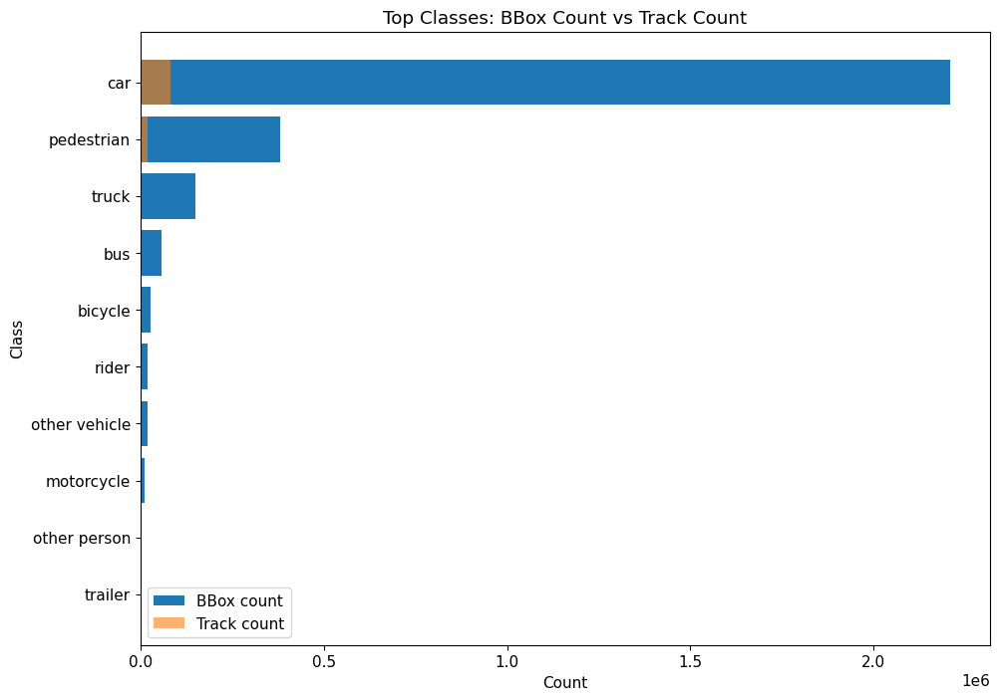

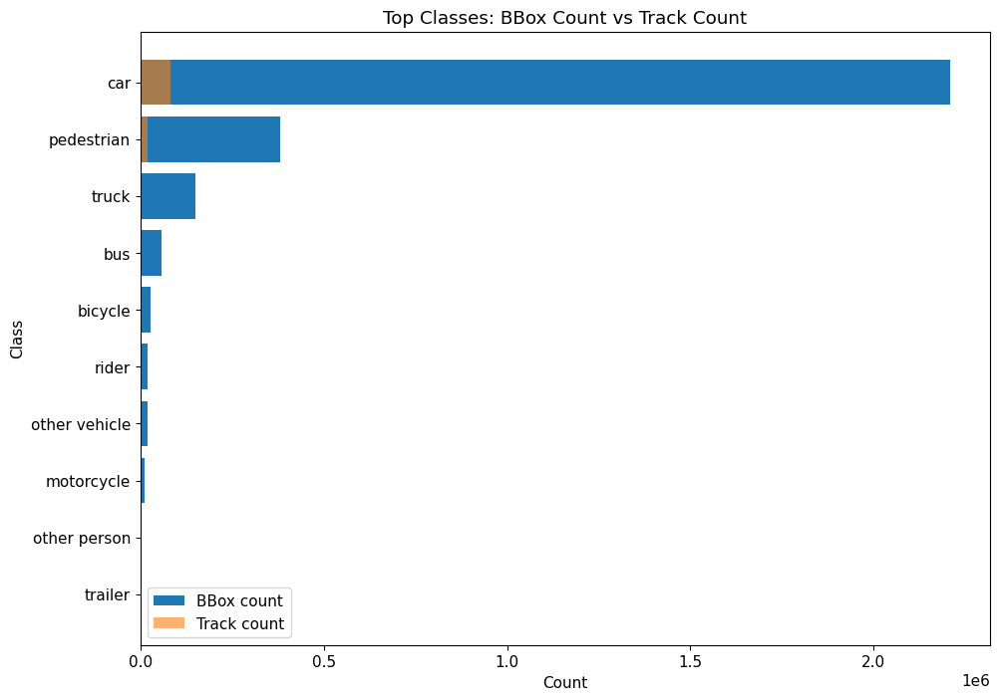

In [131]:
# ============================================================
# Sub-Step C1.4 — Visual: BBox vs Track Count by Class
# ============================================================

TOP_K = 10

plot_df = dist_compare.sort_values("bbox_count", ascending=False).head(TOP_K)
plot_df = plot_df.iloc[::-1]  # reverse for horizontal plot readability

fig, ax = plt.subplots()
ax.barh(plot_df.index, plot_df["bbox_count"], label="BBox count")
ax.barh(plot_df.index, plot_df["track_count"], left=0, alpha=0.6, label="Track count")

ax.set_xlabel("Count")
ax.set_ylabel("Class")
ax.set_title("Top Classes: BBox Count vs Track Count")
ax.legend()

add_fig_page_c1("STEP C1.4 — Visual: BBox vs Track Count (Top Classes)", fig)

fig

In [132]:
# ============================================================
# Sub-Step C1.5 — Minority Class Identification (Track-Level)
# ============================================================

# Define minority threshold based on track_count distribution
minority_threshold = dist_compare["track_count"].quantile(0.2)

minority_classes = (
    dist_compare[dist_compare["track_count"] <= minority_threshold]
    .sort_values("track_count")
)

add_text_page_c1(
    title="STEP C1.5 — Minority Class Identification (Track-Level)",
    lines=[
        "Purpose:",
        "- Identify minority classes based on unique track distribution",
        "",
        f"Minority threshold (20th percentile of track_count): {minority_threshold}",
        "",
        "Minority classes (sorted by track_count):",
        minority_classes.to_string()
    ]
)

minority_classes

,bbox_count,bbox_percent,track_count,track_percent,bbox_per_track
category,,,,,
train,1592,0.055145,24,0.021273,66.333333
trailer,4103,0.142124,97,0.085978,42.298969
other person,4453,0.154248,225,0.199434,19.791111


In [133]:
# ============================================================
# Sub-Step C1.6 — Export PDF (Finalize)
# ============================================================

render_report_c1(PDF_PATH_C1)

print(f"✅ PDF generated: {PDF_PATH_C1}")
display(FileLink(PDF_PATH_C1))

✅ PDF generated: EDA_STEP_C1_Class_Distribution_Object_vs_Track.pdf


/kaggle/working/EDA_STEP_C1_Class_Distribution_Object_vs_Track.pdf

__Insight Kesimpulan (Naratif — Terhubung & Konteks Dunia Nyata)__

Pada sub-step C1.1, distribusi bbox menunjukkan dominasi ekstrem kelas car, yang selaras dengan realitas bahwa kamera dashcam kendaraan paling sering merekam mobil lain di jalan. Situasi ini mencerminkan kondisi lalu lintas sehari-hari, di mana kendaraan pribadi merupakan objek utama dalam field of view.

Sub-step C1.2 memperlihatkan bahwa dominasi ini tetap bertahan pada level tracking, menandakan bahwa ketimpangan kelas bukan hanya akibat frekuensi kemunculan sesaat, tetapi juga berlanjut secara temporal. Hal ini konsisten dengan pengalaman dunia nyata, di mana interaksi visual dengan kendaraan lain jauh lebih sering dibanding objek lain seperti kereta atau trailer.

Melalui sub-step C1.3, terlihat bahwa beberapa kelas yang jarang muncul justru memiliki durasi kemunculan yang panjang. Fenomena ini masuk akal dalam konteks lalu lintas, misalnya kereta api yang jarang terlihat oleh dashcam, tetapi tetap berada dalam frame dalam waktu lama ketika muncul.

Visualisasi pada sub-step C1.4 mempertegas bahwa ketimpangan ini bersifat struktural, bukan kebetulan. Sementara itu, sub-step C1.5 menegaskan keberadaan kelas minoritas yang sangat terbatas datanya, mencerminkan skenario lalu lintas yang jarang ditemui oleh kendaraan pribadi. Secara keseluruhan, STEP C1 menunjukkan bahwa kesulitan dataset ini berakar pada ketimpangan alami dunia nyata yang terekam oleh dashcam.

## C2 - Object Density per Frame (Crowdedness)

In [134]:
# ============================================================
# STEP C2 — Report Setup (Collector)
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
from textwrap import wrap
from IPython.display import FileLink, display

PDF_PATH_C2 = "EDA_STEP_C2_Object_Density_per_Frame_Crowdedness.pdf"
REPORT_PAGES_C2 = []

def add_text_page_c2(title: str, lines: list[str]):
    REPORT_PAGES_C2.append({
        "type": "text",
        "title": title,
        "lines": [str(x) for x in lines]
    })

def add_fig_page_c2(title: str, fig):
    REPORT_PAGES_C2.append({
        "type": "fig",
        "title": title,
        "fig": fig
    })

def render_report_c2(pdf_path: str):
    plt.rcParams["figure.figsize"] = (11, 8)
    plt.rcParams["font.size"] = 11

    def _render_text(ax, title, lines):
        ax.axis("off")
        wrapped = []
        for line in lines:
            wrapped.extend(wrap(str(line), 110))
            wrapped.append("")
        ax.text(
            0.01, 0.98,
            f"{title}\n\n" + "\n".join(wrapped),
            va="top", ha="left", family="monospace"
        )

    with PdfPages(pdf_path) as pdf:
        for page in REPORT_PAGES_C2:
            if page["type"] == "text":
                fig, ax = plt.subplots()
                _render_text(ax, page["title"], page["lines"])
                pdf.savefig(fig)
                plt.close(fig)
            elif page["type"] == "fig":
                page["fig"].suptitle(page["title"], y=0.98)
                pdf.savefig(page["fig"])
                plt.close(page["fig"])

print("✅ Collector STEP C2 siap. Lanjut C2.1")

✅ Collector STEP C2 siap. Lanjut C2.1


In [135]:
# ============================================================
# Sub-Step C2.1 — Object Count per Frame (Construction)
# ============================================================

VIDEO_COL = "videoName"
FRAME_COL = "frameIndex"

assert VIDEO_COL in df.columns, f"Column '{VIDEO_COL}' not found"
assert FRAME_COL in df.columns, f"Column '{FRAME_COL}' not found"

# Count number of bboxes per (video, frame)
objects_per_frame = (
    df
    .groupby([VIDEO_COL, FRAME_COL])
    .size()
    .rename("num_objects")
    .reset_index()
)

add_text_page_c2(
    title="STEP C2.1 — Object Count per Frame (Construction)",
    lines=[
        "Purpose:",
        "- Construct object-per-frame metric on labeled frames",
        "",
        "Notes:",
        "- Scope: joinable subset only (haveVideo=True)",
        "- Only labeled window frames are included",
        "",
        f"Total labeled frames analyzed: {len(objects_per_frame)}",
        "",
        "Preview (head):",
        objects_per_frame.head().to_string(index=False)
    ]
)

objects_per_frame

,videoName,frameIndex,num_objects
0,0000f77c-6257be58,0,2
1,0000f77c-6257be58,1,2
2,0000f77c-6257be58,2,2
3,0000f77c-6257be58,3,2
4,0000f77c-6257be58,4,3
...,...,...,...
274144,03d93dd6-990f83bb,197,5
274145,03d93dd6-990f83bb,198,5
274146,03d93dd6-990f83bb,199,5
274147,03d93dd6-990f83bb,200,5


In [136]:
# ============================================================
# Sub-Step C2.2 — Global Object Density Statistics
# ============================================================

density_stats = objects_per_frame["num_objects"].describe(
    percentiles=[0.5, 0.9, 0.95, 0.99]
)

add_text_page_c2(
    title="STEP C2.2 — Global Object Density Statistics",
    lines=[
        "Purpose:",
        "- Summarize global object density per labeled frame",
        "",
        "Statistics (objects per frame):",
        density_stats.to_string()
    ]
)

density_stats

count    274149.000000
mean         10.530463
std           6.086323
min           1.000000
50%          10.000000
90%          19.000000
95%          22.000000
99%          29.000000
max          62.000000
Name: num_objects, dtype: float64

In [137]:
# ============================================================
# Sub-Step C2.3 — Crowded Frame Threshold (Quantile-Based)
# ============================================================

q90 = objects_per_frame["num_objects"].quantile(0.90)
q95 = objects_per_frame["num_objects"].quantile(0.95)
q99 = objects_per_frame["num_objects"].quantile(0.99)

thresholds = pd.Series({
    "q90_objects_per_frame": q90,
    "q95_objects_per_frame": q95,
    "q99_objects_per_frame": q99
})

add_text_page_c2(
    title="STEP C2.3 — Crowded Frame Thresholds (Quantile)",
    lines=[
        "Purpose:",
        "- Define descriptive crowded-frame thresholds based on distribution quantiles",
        "",
        thresholds.to_string()
    ]
)

thresholds

q90_objects_per_frame    19.0
q95_objects_per_frame    22.0
q99_objects_per_frame    29.0
dtype: float64

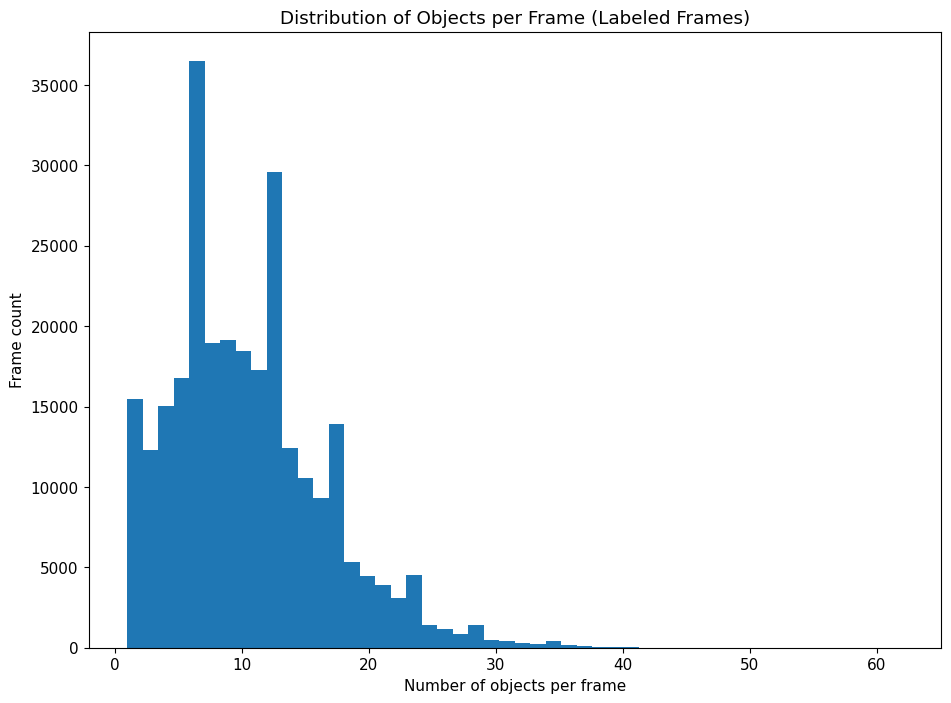

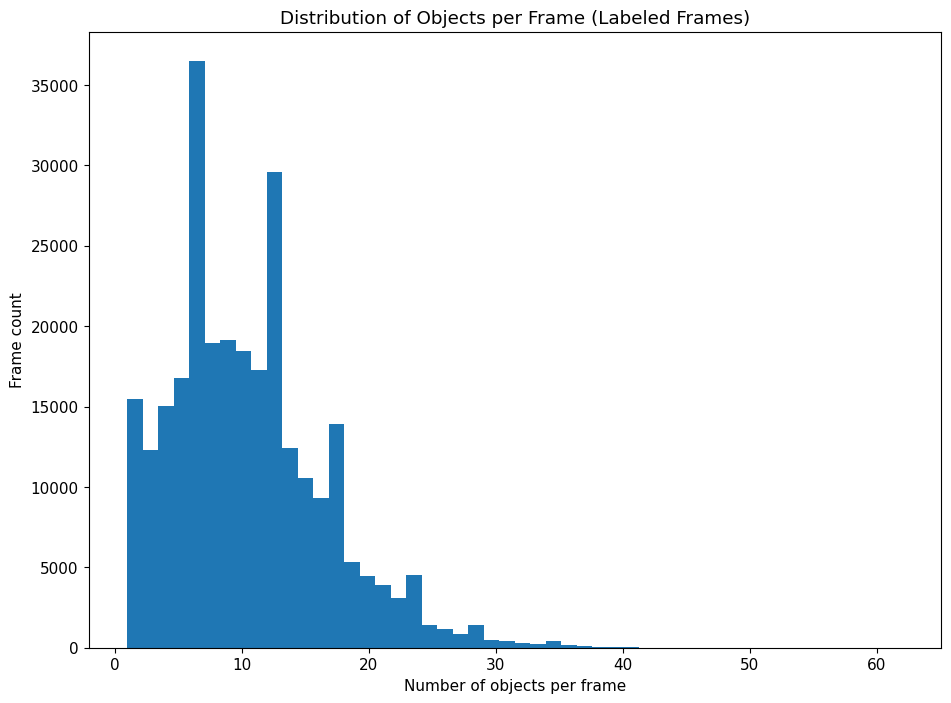

In [138]:
# ============================================================
# Sub-Step C2.4 — Distribution Visualization (Histogram)
# ============================================================

fig, ax = plt.subplots()
ax.hist(objects_per_frame["num_objects"], bins=50)
ax.set_xlabel("Number of objects per frame")
ax.set_ylabel("Frame count")
ax.set_title("Distribution of Objects per Frame (Labeled Frames)")

add_fig_page_c2("STEP C2.4 — Histogram: Objects per Frame", fig)

fig

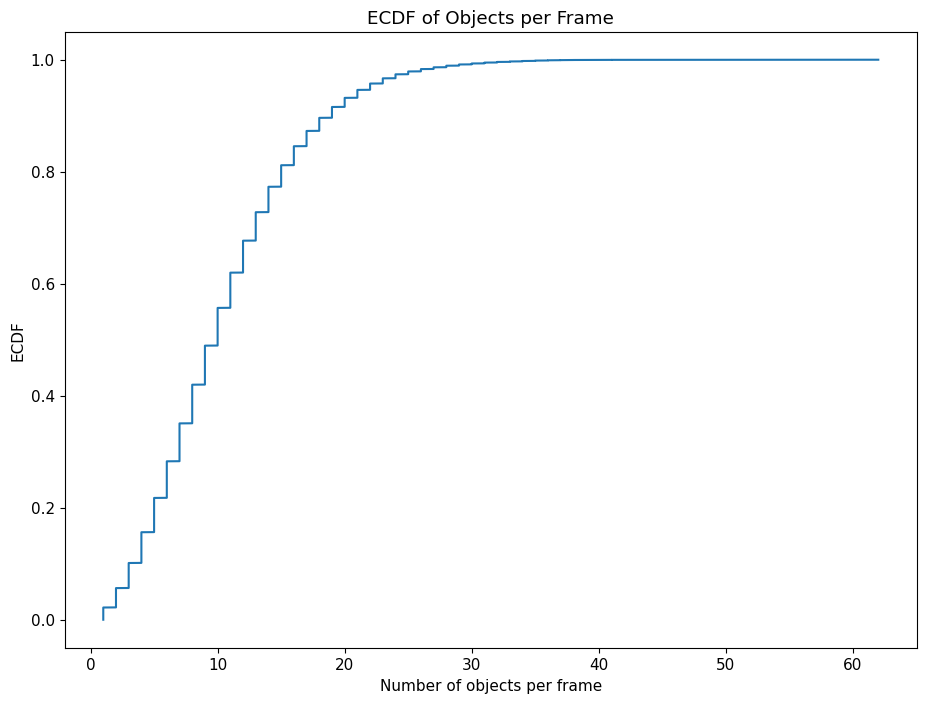

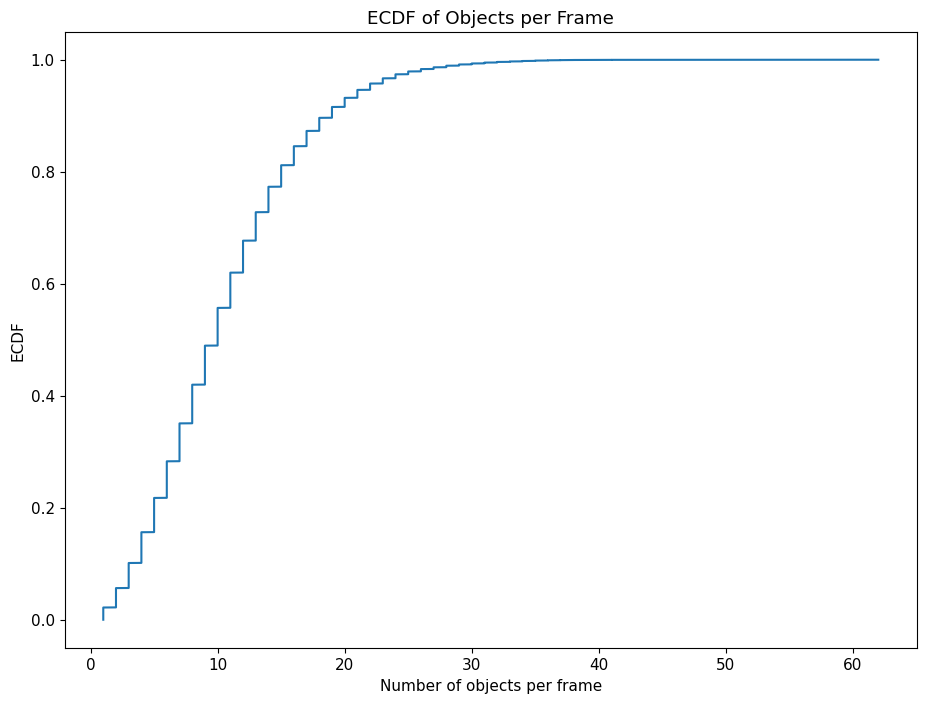

In [139]:
# ============================================================
# Sub-Step C2.5 — Distribution Visualization (ECDF)
# ============================================================

sorted_vals = np.sort(objects_per_frame["num_objects"].values)
ecdf = np.arange(1, len(sorted_vals) + 1) / len(sorted_vals)

fig, ax = plt.subplots()
ax.plot(sorted_vals, ecdf)
ax.set_xlabel("Number of objects per frame")
ax.set_ylabel("ECDF")
ax.set_title("ECDF of Objects per Frame")

add_fig_page_c2("STEP C2.5 — ECDF: Objects per Frame", fig)

fig

In [140]:
# ============================================================
# Sub-Step C2.6 — Crowded vs Sparse Frame Split
# ============================================================

split_df = pd.DataFrame({
    "threshold": ["q90", "q95", "q99"],
    "objects_per_frame": [q90, q95, q99],
    "frame_count_above": [
        (objects_per_frame["num_objects"] >= q90).sum(),
        (objects_per_frame["num_objects"] >= q95).sum(),
        (objects_per_frame["num_objects"] >= q99).sum(),
    ],
})

split_df["percent_frames"] = 100.0 * split_df["frame_count_above"] / len(objects_per_frame)

add_text_page_c2(
    title="STEP C2.6 — Crowded vs Sparse Frame Split (Descriptive)",
    lines=[
        "Purpose:",
        "- Quantify proportion of crowded frames at different thresholds",
        "",
        split_df.to_string(index=False)
    ]
)

split_df

,threshold,objects_per_frame,frame_count_above,percent_frames
0,q90,19.0,28460,10.381216
1,q95,22.0,14778,5.390499
2,q99,29.0,2936,1.070950


In [141]:
# ============================================================
# Sub-Step C2.7 — Export PDF (Finalize)
# ============================================================

render_report_c2(PDF_PATH_C2)

print(f"✅ PDF generated: {PDF_PATH_C2}")
display(FileLink(PDF_PATH_C2))

✅ PDF generated: EDA_STEP_C2_Object_Density_per_Frame_Crowdedness.pdf


/kaggle/working/EDA_STEP_C2_Object_Density_per_Frame_Crowdedness.pdf

__Insight Kesimpulan (Naratif — Terhubung & Konteks Dunia Nyata)__

Sub-step C2.1 menegaskan bahwa analisis kepadatan objek pada dataset BDD100K hanya relevan pada window berlabel, yang mencerminkan pendekatan anotasi selektif terhadap segmen video tertentu. Hal ini sejalan dengan praktik dunia nyata, di mana anotator fokus pada bagian video yang dianggap informatif atau penting.

Pada sub-step C2.2, statistik global menunjukkan bahwa rata-rata frame dashcam berisi sekitar sepuluh objek, mencerminkan kondisi lalu lintas normal di jalan perkotaan atau jalan raya. Namun, keberadaan ekor distribusi yang panjang mengindikasikan adanya situasi lalu lintas padat seperti persimpangan besar atau kemacetan, yang meskipun jarang, tetap menjadi bagian penting dari pengalaman berkendara nyata.

Sub-step C2.3 dan C2.6 bersama-sama memperlihatkan bahwa crowdedness bersifat relatif dan berlapis. Dalam konteks dunia nyata, perbedaan antara lalu lintas lancar dan macet tidak bersifat biner, melainkan kontinu, dan hal ini tercermin jelas dalam distribusi kuantil kepadatan objek.

Visualisasi pada sub-step C2.4 dan C2.5 memperkuat pemahaman bahwa sebagian kecil frame membawa beban kesulitan yang jauh lebih tinggi. Frame-frame ini kemungkinan merepresentasikan kondisi ekstrem seperti jam sibuk atau area dengan banyak pengguna jalan, yang sering kali menjadi titik kegagalan sistem persepsi kendaraan otonom.

## C3 - Bounding Box Size Profiling (Small / Medium / Large)

In [142]:
# ============================================================
# STEP C3 — Report Setup (Collector)
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
from textwrap import wrap
from IPython.display import FileLink, display

PDF_PATH_C3 = "EDA_STEP_C3_BBox_Size_Profiling_Small_Medium_Large.pdf"
REPORT_PAGES_C3 = []

def add_text_page_c3(title: str, lines: list[str]):
    REPORT_PAGES_C3.append({
        "type": "text",
        "title": title,
        "lines": [str(x) for x in lines]
    })

def add_fig_page_c3(title: str, fig):
    REPORT_PAGES_C3.append({
        "type": "fig",
        "title": title,
        "fig": fig
    })

def render_report_c3(pdf_path: str):
    plt.rcParams["figure.figsize"] = (11, 8)
    plt.rcParams["font.size"] = 11

    def _render_text(ax, title, lines):
        ax.axis("off")
        wrapped = []
        for line in lines:
            wrapped.extend(wrap(str(line), 110))
            wrapped.append("")
        ax.text(
            0.01, 0.98,
            f"{title}\n\n" + "\n".join(wrapped),
            va="top", ha="left", family="monospace"
        )

    with PdfPages(pdf_path) as pdf:
        for page in REPORT_PAGES_C3:
            if page["type"] == "text":
                fig, ax = plt.subplots()
                _render_text(ax, page["title"], page["lines"])
                pdf.savefig(fig)
                plt.close(fig)
            elif page["type"] == "fig":
                page["fig"].suptitle(page["title"], y=0.98)
                pdf.savefig(page["fig"])
                plt.close(page["fig"])

print("✅ Collector STEP C3 siap. Lanjut C3.1")

✅ Collector STEP C3 siap. Lanjut C3.1


In [143]:
# ============================================================
# Sub-Step C3.0a — BBox & Class Column Inspection
# ============================================================

# Show all columns (or filter by bbox-related keywords)
all_cols = df.columns.tolist()

bbox_like_cols = [
    c for c in all_cols
    if any(k in c.lower() for k in ["x", "y", "box", "bbox", "width", "height", "w", "h"])
]

class_like_cols = [
    c for c in all_cols
    if any(k in c.lower() for k in ["class", "category", "label", "name"])
]

add_text_page_c3(
    title="STEP C3.0a — BBox & Class Column Inspection",
    lines=[
        "Purpose:",
        "- Inspect available bbox and class-related columns before size profiling",
        "",
        "All columns (first 40):",
        ", ".join(all_cols[:40]),
        "",
        "BBox-like columns detected:",
        ", ".join(bbox_like_cols),
        "",
        "Class-like columns detected:",
        ", ".join(class_like_cols),
    ]
)

# Also print for notebook visibility
print("BBox-like columns:", bbox_like_cols)
print("Class-like columns:", class_like_cols)

BBox-like columns: ['frameIndex', 'category', 'attributes.crowd', 'box2d.x1', 'box2d.x2', 'box2d.y1', 'box2d.y2', 'haveVideo']
Class-like columns: ['name', 'videoName', 'category']


In [144]:
# ============================================================
# Sub-Step C3.1 — BBox Area & Ratio Construction (box2d.*)
# ============================================================

import numpy as np
import pandas as pd

# Columns (confirmed from inspection)
CLASS_COL = "category"
X1_COL, Y1_COL, X2_COL, Y2_COL = "box2d.x1", "box2d.y1", "box2d.x2", "box2d.y2"

for c in [CLASS_COL, X1_COL, Y1_COL, X2_COL, Y2_COL]:
    assert c in df.columns, f"Column '{c}' not found"

# Frame reference size (from Block A5 decode metadata)
FRAME_W, FRAME_H = 1280, 720
FRAME_AREA = FRAME_W * FRAME_H

# Read bbox coords as numeric (no mutation of df)
x1 = pd.to_numeric(df[X1_COL], errors="coerce")
y1 = pd.to_numeric(df[Y1_COL], errors="coerce")
x2 = pd.to_numeric(df[X2_COL], errors="coerce")
y2 = pd.to_numeric(df[Y2_COL], errors="coerce")

bbox_w = (x2 - x1).astype(float)
bbox_h = (y2 - y1).astype(float)

bbox_area = bbox_w * bbox_h
bbox_area_ratio = bbox_area / FRAME_AREA

size_df = pd.DataFrame({
    CLASS_COL: df[CLASS_COL],
    "bbox_w": bbox_w,
    "bbox_h": bbox_h,
    "bbox_area": bbox_area,
    "bbox_area_ratio": bbox_area_ratio
})

# Observational counters (no fixing / cleaning)
nan_rows = int(size_df[["bbox_w", "bbox_h", "bbox_area", "bbox_area_ratio"]].isna().any(axis=1).sum())
nonpos_area = int((size_df["bbox_area"] <= 0).sum())

add_text_page_c3(
    title="STEP C3.1 — Bounding Box Area & Ratio Construction (box2d.* schema)",
    lines=[
        "Purpose:",
        "- Construct bbox width/height/area and area ratio relative to frame",
        "",
        "Confirmed schema:",
        f"- Class column: {CLASS_COL}",
        f"- BBox columns: {X1_COL}, {Y1_COL}, {X2_COL}, {Y2_COL}",
        "",
        "Frame reference:",
        f"- Resolution: {FRAME_W} x {FRAME_H}",
        f"- Frame area: {FRAME_AREA}",
        "",
        "Sanity (observational):",
        f"- Rows with any NaN in derived bbox metrics: {nan_rows}",
        f"- Rows with bbox_area <= 0: {nonpos_area}",
        "",
        "Preview (head):",
        size_df.head().to_string(index=False)
    ]
)

size_df

,category,bbox_w,bbox_h,bbox_area,bbox_area_ratio
0,car,177.921478,63.187067,11242.336350,0.012199
1,car,216.166282,78.152425,16893.919110,0.018331
2,pedestrian,18.290993,19.953811,364.975012,0.000396
3,car,71.501155,49.884527,3566.801252,0.003870
4,car,64.018476,46.558891,2980.629264,0.003234
...,...,...,...,...,...
2890841,car,63.969449,48.811271,3122.430106,0.003388
2890842,car,55.916025,30.089427,1682.481147,0.001826
2890843,car,46.167939,23.675191,1093.034767,0.001186
2890844,car,111.253644,54.577259,6071.919013,0.006588


In [145]:
# ============================================================
# Sub-Step C3.2 — Global BBox Size Distribution (Quantiles)
# ============================================================

area_ratio_stats = size_df["bbox_area_ratio"].describe(
    percentiles=[0.01, 0.05, 0.1, 0.25, 0.5, 0.75, 0.9, 0.95, 0.99]
)

add_text_page_c3(
    title="STEP C3.2 — Global BBox Size Distribution (Area Ratio)",
    lines=[
        "Purpose:",
        "- Summarize global distribution of bbox size relative to frame",
        "",
        "Area ratio statistics:",
        area_ratio_stats.to_string()
    ]
)

area_ratio_stats

count    2.886916e+06
mean     1.312848e-02
std      3.445919e-02
min      2.265107e-05
1%       1.552274e-04
5%       2.847667e-04
10%      4.173142e-04
25%      8.735128e-04
50%      2.355610e-03
75%      8.262128e-03
90%      3.178212e-02
95%      6.711103e-02
99%      1.751128e-01
max      8.353280e-01
Name: bbox_area_ratio, dtype: float64

In [146]:
# ============================================================
# Sub-Step C3.3 — Size Bucketing (Quantile-Based)
# ============================================================

# Define quantile-based thresholds (descriptive, EDA-only)
q_small = size_df["bbox_area_ratio"].quantile(0.33)
q_large = size_df["bbox_area_ratio"].quantile(0.66)

size_bucket = pd.cut(
    size_df["bbox_area_ratio"],
    bins=[-np.inf, q_small, q_large, np.inf],
    labels=["small", "medium", "large"]
)

bucket_df = pd.DataFrame({
    "category": size_df["category"],
    "size_bucket": size_bucket
})

bucket_dist = (
    bucket_df
    .groupby(["category", "size_bucket"])
    .size()
    .unstack(fill_value=0)
)

bucket_pct = bucket_dist.div(bucket_dist.sum(axis=1), axis=0) * 100.0

add_text_page_c3(
    title="STEP C3.3 — Size Bucket Distribution per Class",
    lines=[
        "Purpose:",
        "- Describe distribution of small / medium / large objects per class",
        "",
        "Count per class:",
        bucket_dist.to_string(),
        "",
        "Percent per class (%):",
        bucket_pct.to_string()
    ]
)

bucket_dist, bucket_pct

/tmp/ipykernel_24/337957907.py:22: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby(["category", "size_bucket"])


(size_bucket     small  medium   large
 category                             
 bicycle          8744   10706    9027
 bus             13966   17496   26418
 car            714891  703922  788303
 motorcycle       3539    4005    4920
 other person     1638    2085     730
 other vehicle    3012    6446    9744
 pedestrian     163272  153324   64845
 rider            8052    6571    5742
 trailer           639    1199    2265
 train             116     300    1176
 truck           34813   46663   68347,
 size_bucket        small     medium      large
 category                                      
 bicycle        30.705482  37.595252  31.699266
 bus            24.129233  30.228058  45.642709
 car            32.390278  31.893294  35.716428
 motorcycle     28.393774  32.132542  39.473684
 other person   36.784190  46.822367  16.393443
 other vehicle  15.685866  33.569420  50.744714
 pedestrian     42.803999  40.195994  17.000008
 rider          39.538424  32.266143  28.195433
 trailer    

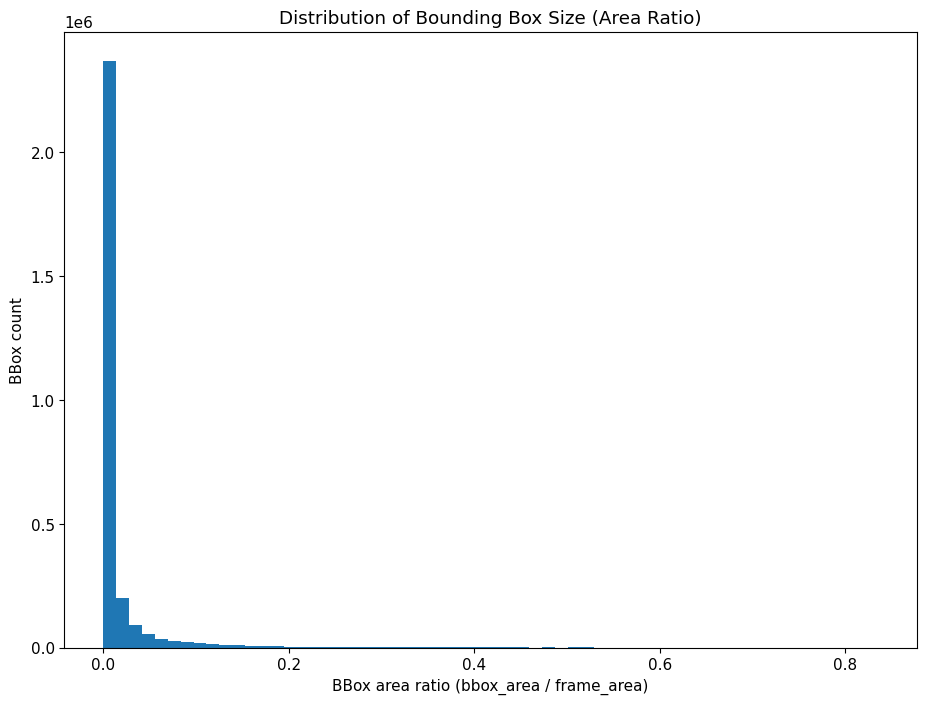

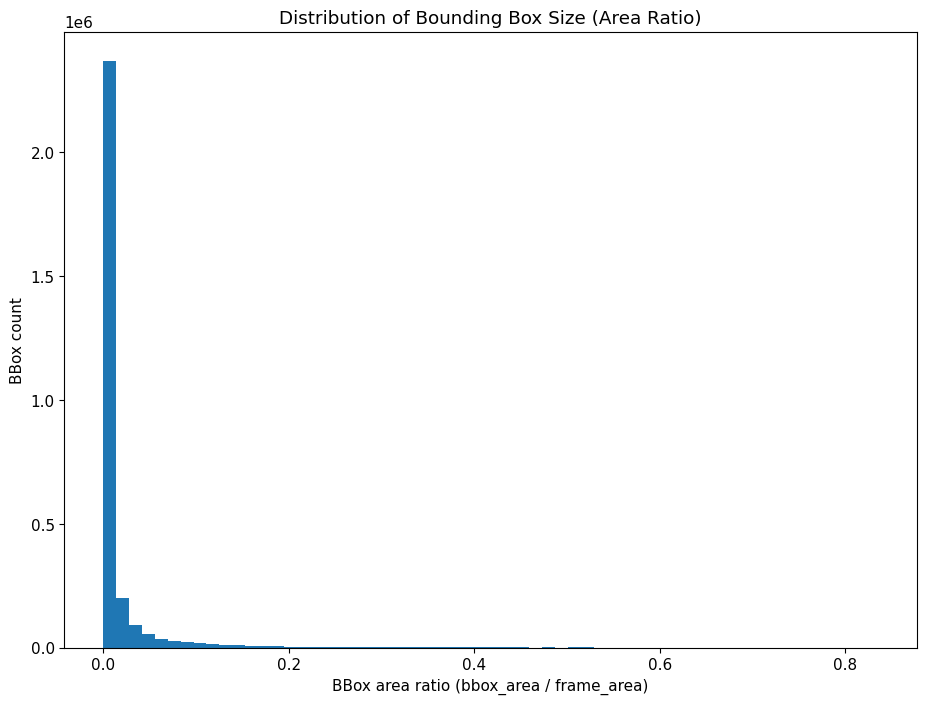

In [147]:
# ============================================================
# Sub-Step C3.4 — Global Size Distribution (Histogram)
# ============================================================

fig, ax = plt.subplots()
ax.hist(size_df["bbox_area_ratio"], bins=60)
ax.set_xlabel("BBox area ratio (bbox_area / frame_area)")
ax.set_ylabel("BBox count")
ax.set_title("Distribution of Bounding Box Size (Area Ratio)")

add_fig_page_c3("STEP C3.4 — Histogram: BBox Area Ratio", fig)

fig

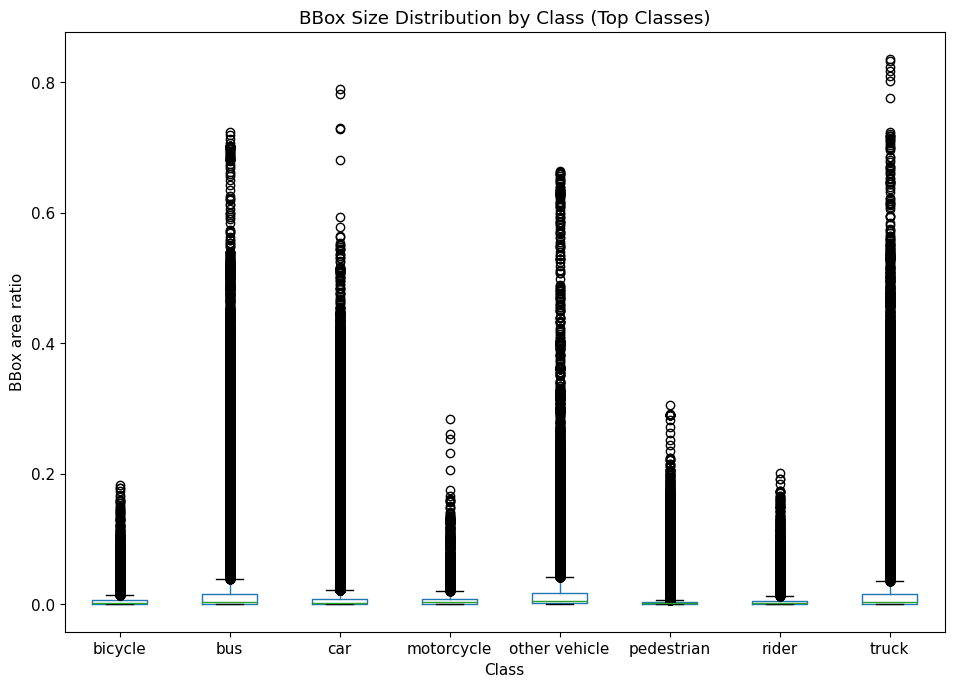

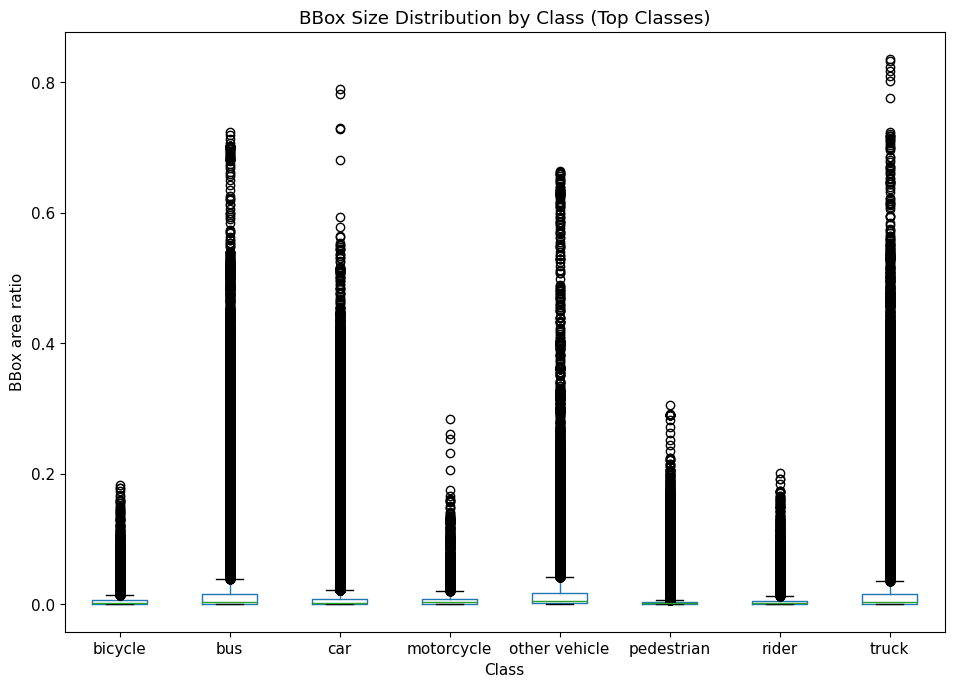

In [148]:
# ============================================================
# Sub-Step C3.5 — Size Distribution by Class (Boxplot)
# ============================================================

# Limit to top classes by frequency to keep plot readable
top_classes = (
    size_df["category"]
    .value_counts()
    .head(8)
    .index
)

plot_df = size_df[size_df["category"].isin(top_classes)]

fig, ax = plt.subplots()
plot_df.boxplot(
    column="bbox_area_ratio",
    by="category",
    ax=ax,
    grid=False
)
ax.set_xlabel("Class")
ax.set_ylabel("BBox area ratio")
ax.set_title("BBox Size Distribution by Class (Top Classes)")
plt.suptitle("")

add_fig_page_c3("STEP C3.5 — Boxplot: BBox Size by Class", fig)

fig

In [149]:
# ============================================================
# Sub-Step C3.6 — Export PDF (Finalize)
# ============================================================

render_report_c3(PDF_PATH_C3)

print(f"✅ PDF generated: {PDF_PATH_C3}")
display(FileLink(PDF_PATH_C3))

✅ PDF generated: EDA_STEP_C3_BBox_Size_Profiling_Small_Medium_Large.pdf


/kaggle/working/EDA_STEP_C3_BBox_Size_Profiling_Small_Medium_Large.pdf

__Insight Kesimpulan__

Pada C3.1, format anotasi bbox terbukti mengikuti pola khas BDD100K (box2d.*) sehingga perhitungan ukuran objek bisa dilakukan secara konsisten dan repeatable. Ini penting dalam dataset real-world dashcam karena schema sering berasal dari pipeline anotasi yang kompleks dan nested; ketika schema sudah terkunci, interpretasi hasil EDA menjadi jauh lebih dapat dipercaya.

Pada C3.2, statistik kuantil memperlihatkan dominasi objek kecil yang sangat kuat (median area ratio ~0.00236), yang selaras dengan kenyataan video dashcam: banyak objek muncul jauh di depan kendaraan (kendaraan lain, pejalan kaki di trotoar, pengendara sepeda di sisi jalan) dan hanya sesekali objek berada sangat dekat kamera (misalnya kendaraan memotong jalur atau berhenti di depan). Extreme tiny bbox yang muncul bukan hal aneh di jalan raya—itu merepresentasikan objek yang jauh, kadang hanya beberapa puluh piksel, yang memang menjadi sumber utama kegagalan deteksi.

Pada C3.3, bucket per kelas menunjukkan bahwa ukuran objek sangat bergantung pada jenisnya: pedestrian dan rider lebih sering berada pada rezim kecil, sedangkan bus/truck/trailer/train lebih dominan pada rezim besar. Ini konsisten dengan dunia nyata: manusia cenderung berada di pinggir jalan atau jauh dari ego-vehicle, sementara kendaraan besar ketika muncul biasanya cukup dekat atau cukup besar secara fisik sehingga mengambil area lebih besar. Artinya, “kesulitan” tidak merata—kelas tertentu secara intrinsik lebih sering berada pada kondisi sulit (small regime).

Pada C3.4, histogram menguatkan bahwa keseluruhan dataset lebih berat ke objek kecil dengan ekor panjang menuju objek besar. Dalam konteks berkendara, ini menggambarkan variasi skala yang ekstrem akibat perubahan jarak, kecepatan relatif, dan komposisi scene (misalnya jalan bebas hambatan vs persimpangan padat).

Pada C3.5, boxplot memperlihatkan perbedaan distribusi ukuran antar kelas dan adanya outlier besar lintas kelas. Ini cocok dengan fenomena real-world: objek bisa menjadi sangat besar ketika dekat kamera, termasuk sepeda motor atau mobil saat berada di lane yang sama dan jarak dekat. Dengan demikian, model perlu menghadapi dua dunia sekaligus: banyak objek kecil yang sulit dan sedikit objek besar yang menuntut kestabilan prediksi pada skala besar.

## C4 - Aspect Ratio & Shape Bias

In [150]:
# ============================================================
# STEP C4 — Report Setup (Collector)
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
from textwrap import wrap
from IPython.display import FileLink, display

PDF_PATH_C4 = "EDA_STEP_C4_Aspect_Ratio_Shape_Bias.pdf"
REPORT_PAGES_C4 = []

def add_text_page_c4(title: str, lines: list[str]):
    REPORT_PAGES_C4.append({
        "type": "text",
        "title": title,
        "lines": [str(x) for x in lines]
    })

def add_fig_page_c4(title: str, fig):
    REPORT_PAGES_C4.append({
        "type": "fig",
        "title": title,
        "fig": fig
    })

def render_report_c4(pdf_path: str):
    plt.rcParams["figure.figsize"] = (11, 8)
    plt.rcParams["font.size"] = 11

    def _render_text(ax, title, lines):
        ax.axis("off")
        wrapped = []
        for line in lines:
            wrapped.extend(wrap(str(line), 110))
            wrapped.append("")
        ax.text(
            0.01, 0.98,
            f"{title}\n\n" + "\n".join(wrapped),
            va="top", ha="left", family="monospace"
        )

    with PdfPages(pdf_path) as pdf:
        for page in REPORT_PAGES_C4:
            if page["type"] == "text":
                fig, ax = plt.subplots()
                _render_text(ax, page["title"], page["lines"])
                pdf.savefig(fig)
                plt.close(fig)
            elif page["type"] == "fig":
                page["fig"].suptitle(page["title"], y=0.98)
                pdf.savefig(page["fig"])
                plt.close(page["fig"])

print("✅ Collector STEP C4 siap. Lanjut C4.1")

✅ Collector STEP C4 siap. Lanjut C4.1


In [151]:
# ============================================================
# Sub-Step C4.1 — Aspect Ratio Construction
# ============================================================

CLASS_COL = "category"
X1_COL, Y1_COL, X2_COL, Y2_COL = "box2d.x1", "box2d.y1", "box2d.x2", "box2d.y2"

for c in [CLASS_COL, X1_COL, Y1_COL, X2_COL, Y2_COL]:
    assert c in df.columns, f"Column '{c}' not found"

x1 = pd.to_numeric(df[X1_COL], errors="coerce")
y1 = pd.to_numeric(df[Y1_COL], errors="coerce")
x2 = pd.to_numeric(df[X2_COL], errors="coerce")
y2 = pd.to_numeric(df[Y2_COL], errors="coerce")

bbox_w = (x2 - x1).astype(float)
bbox_h = (y2 - y1).astype(float)

aspect_ratio = bbox_w / bbox_h.replace(0, np.nan)

shape_df = pd.DataFrame({
    CLASS_COL: df[CLASS_COL],
    "bbox_w": bbox_w,
    "bbox_h": bbox_h,
    "aspect_ratio": aspect_ratio
})

nan_ar = int(shape_df["aspect_ratio"].isna().sum())
neg_ar = int((shape_df["aspect_ratio"] <= 0).sum())

add_text_page_c4(
    title="STEP C4.1 — Aspect Ratio Construction (w / h)",
    lines=[
        "Purpose:",
        "- Construct bbox aspect ratio (width / height)",
        "",
        "BBox schema:",
        f"- Using columns: {X1_COL}, {Y1_COL}, {X2_COL}, {Y2_COL}",
        "",
        "Sanity (observational):",
        f"- NaN aspect_ratio rows: {nan_ar}",
        f"- aspect_ratio <= 0 rows: {neg_ar}",
        "",
        "Preview (head):",
        shape_df.head().to_string(index=False)
    ]
)

shape_df

,category,bbox_w,bbox_h,aspect_ratio
0,car,177.921478,63.187067,2.815789
1,car,216.166282,78.152425,2.765957
2,pedestrian,18.290993,19.953811,0.916667
3,car,71.501155,49.884527,1.433333
4,car,64.018476,46.558891,1.375000
...,...,...,...,...
2890841,car,63.969449,48.811271,1.310547
2890842,car,55.916025,30.089427,1.858328
2890843,car,46.167939,23.675191,1.950056
2890844,car,111.253644,54.577259,2.038462


In [152]:
# ============================================================
# Sub-Step C4.2 — Global Aspect Ratio Distribution
# ============================================================

ar_stats = shape_df["aspect_ratio"].describe(
    percentiles=[0.01, 0.05, 0.1, 0.25, 0.5, 0.75, 0.9, 0.95, 0.99]
)

add_text_page_c4(
    title="STEP C4.2 — Global Aspect Ratio Distribution",
    lines=[
        "Purpose:",
        "- Summarize global distribution of bbox aspect ratio",
        "",
        ar_stats.to_string()
    ]
)

ar_stats

count    2.886916e+06
mean     1.298496e+00
std      8.289227e-01
min      2.761905e-02
1%       2.692952e-01
5%       3.714286e-01
10%      4.568892e-01
25%      8.200000e-01
50%      1.193548e+00
75%      1.547619e+00
90%      2.139851e+00
95%      2.678261e+00
99%      4.177215e+00
max      7.933642e+01
Name: aspect_ratio, dtype: float64

In [153]:
# ============================================================
# Sub-Step C4.3 — Aspect Ratio Distribution per Class
# ============================================================

# Focus on top classes to keep table readable
top_classes = (
    shape_df[CLASS_COL]
    .value_counts()
    .head(8)
    .index
)

grouped_stats = (
    shape_df[shape_df[CLASS_COL].isin(top_classes)]
    .groupby(CLASS_COL)["aspect_ratio"]
    .describe(
        percentiles=[0.1, 0.25, 0.5, 0.75, 0.9]
    )
)

add_text_page_c4(
    title="STEP C4.3 — Aspect Ratio Distribution per Class (Top Classes)",
    lines=[
        "Purpose:",
        "- Compare aspect ratio distribution across classes",
        "",
        grouped_stats.to_string()
    ]
)

grouped_stats

,count,mean,std,min,10%,25%,50%,75%,90%,max
category,,,,,,,,,,
bicycle,28477.0,0.995810,0.606945,0.096330,0.479333,0.593000,0.815789,1.274286,1.674851,7.978261
bus,57880.0,1.489016,0.903588,0.041878,0.764940,0.936174,1.222661,1.741073,2.588929,11.366704
car,2207116.0,1.439977,0.788422,0.033254,0.753623,1.031250,1.280899,1.634146,2.251156,29.571329
motorcycle,12464.0,0.942504,0.407431,0.077103,0.514173,0.632353,0.823529,1.187500,1.571653,3.334421
other vehicle,19202.0,1.103644,0.606936,0.050251,0.530850,0.740185,0.967315,1.298701,1.833333,6.638857
pedestrian,381441.0,0.503678,0.382169,0.034245,0.302669,0.355769,0.422222,0.523490,0.733333,11.318182
rider,20365.0,0.582117,0.321178,0.084699,0.381987,0.441860,0.522124,0.626263,0.804177,5.866667
truck,149823.0,1.342613,0.745167,0.027619,0.717328,0.888889,1.153846,1.585750,2.234146,15.181818


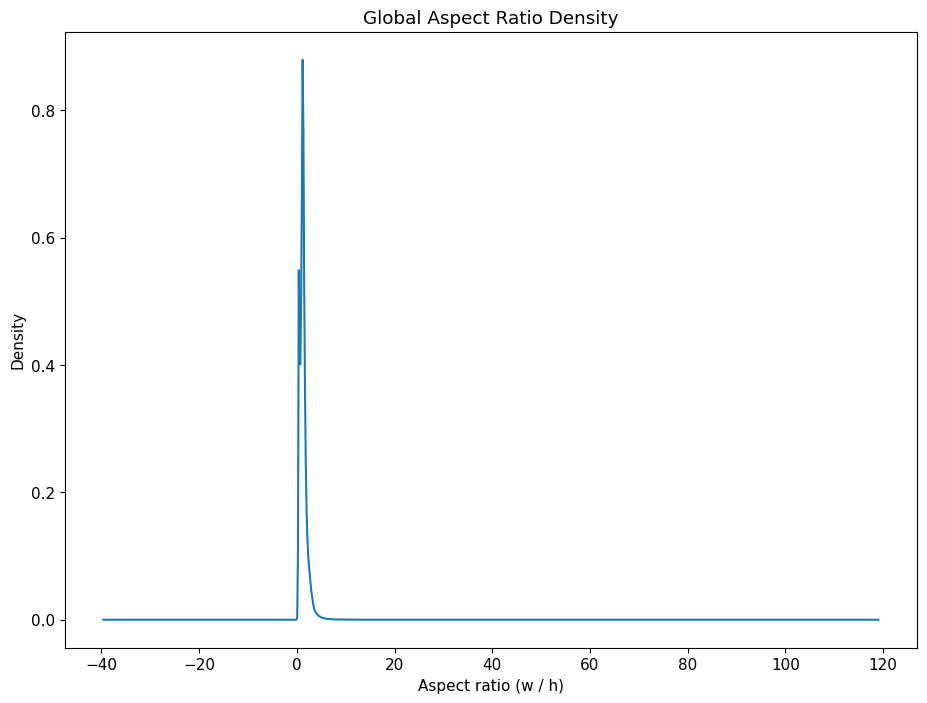

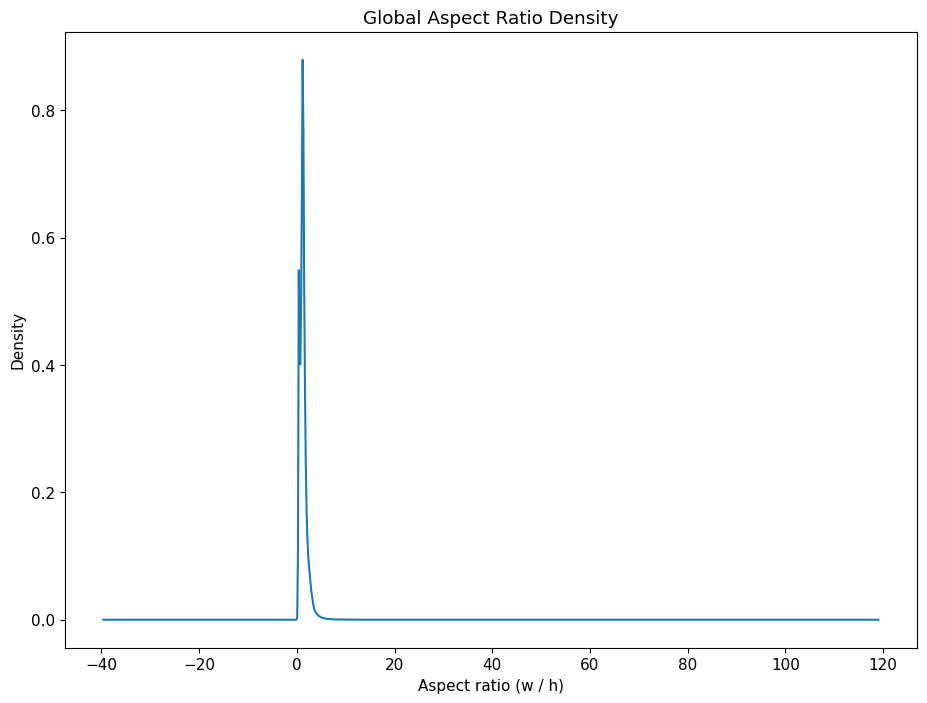

In [154]:
# ============================================================
# Sub-Step C4.4 — Density Plot: Aspect Ratio
# ============================================================

fig, ax = plt.subplots()
shape_df["aspect_ratio"].dropna().plot(kind="density", ax=ax)
ax.set_xlabel("Aspect ratio (w / h)")
ax.set_ylabel("Density")
ax.set_title("Global Aspect Ratio Density")

add_fig_page_c4("STEP C4.4 — Density Plot: Aspect Ratio (Global)", fig)

fig

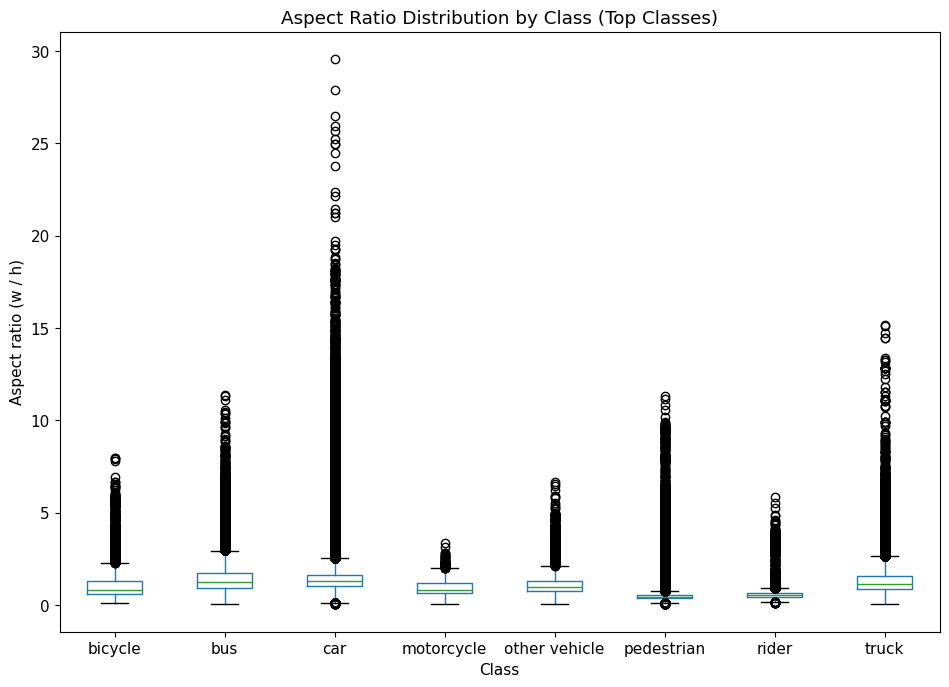

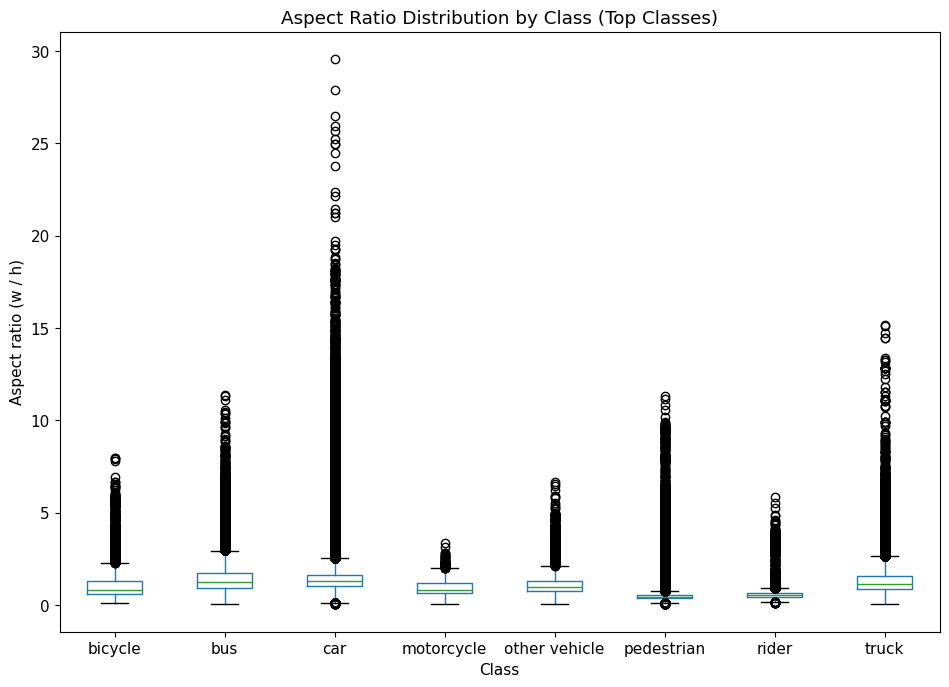

In [155]:
# ============================================================
# Sub-Step C4.5 — Aspect Ratio by Class (Boxplot)
# ============================================================

plot_df = shape_df[shape_df[CLASS_COL].isin(top_classes)]

fig, ax = plt.subplots()
plot_df.boxplot(
    column="aspect_ratio",
    by=CLASS_COL,
    ax=ax,
    grid=False
)
ax.set_xlabel("Class")
ax.set_ylabel("Aspect ratio (w / h)")
ax.set_title("Aspect Ratio Distribution by Class (Top Classes)")
plt.suptitle("")

add_fig_page_c4("STEP C4.5 — Boxplot: Aspect Ratio by Class", fig)

fig

In [156]:
# ============================================================
# Sub-Step C4.6 — Extreme Aspect Ratio Outliers (Descriptive)
# ============================================================

low_thr = shape_df["aspect_ratio"].quantile(0.01)
high_thr = shape_df["aspect_ratio"].quantile(0.99)

outlier_df = pd.DataFrame({
    "threshold": ["p01", "p99"],
    "aspect_ratio": [low_thr, high_thr],
    "bbox_count_beyond": [
        (shape_df["aspect_ratio"] <= low_thr).sum(),
        (shape_df["aspect_ratio"] >= high_thr).sum(),
    ]
})

outlier_df["percent_bboxes"] = (
    outlier_df["bbox_count_beyond"] / len(shape_df) * 100.0
)

add_text_page_c4(
    title="STEP C4.6 — Extreme Aspect Ratio Outliers (Quantile-Based)",
    lines=[
        "Purpose:",
        "- Quantify proportion of extreme-shape bounding boxes",
        "",
        outlier_df.to_string(index=False)
    ]
)

outlier_df

,threshold,aspect_ratio,bbox_count_beyond,percent_bboxes
0,p01,0.269295,28870,1.000029
1,p99,4.177215,29035,1.005745


In [157]:
# ============================================================
# Sub-Step C4.7 — Export PDF (Finalize)
# ============================================================

render_report_c4(PDF_PATH_C4)

print(f"✅ PDF generated: {PDF_PATH_C4}")
display(FileLink(PDF_PATH_C4))

✅ PDF generated: EDA_STEP_C4_Aspect_Ratio_Shape_Bias.pdf


/kaggle/working/EDA_STEP_C4_Aspect_Ratio_Shape_Bias.pdf

__Insight Kesimpulan__

Pada sub-step C4.1, perhitungan aspect ratio menunjukkan bahwa data bbox BDD100K bersih secara numerik dan siap dianalisis. Ini penting karena dalam dataset dunia nyata, error pada anotasi sering kali mencemari analisis bentuk, namun pada kasus ini variasi yang muncul murni berasal dari data.

Sub-step C4.2 mengungkap bahwa meskipun mayoritas bbox memiliki bentuk mendekati seimbang (w/h ≈ 1), terdapat ekor panjang menuju bentuk ekstrem. Dalam konteks dashcam, ini masuk akal karena kendaraan yang sangat dekat kamera atau terpotong frame dapat menghasilkan bbox yang sangat lebar atau sangat tipis.

Pada C4.3 dan C4.5, perbedaan pola bentuk antar kelas menjadi sangat jelas. Pedestrian dan rider secara konsisten memiliki bbox tinggi–kurus, sementara kendaraan lebih lebar dan variatif. Ini mencerminkan realitas lalu lintas: manusia berdiri tegak dan relatif kecil, sedangkan kendaraan memiliki orientasi dan ukuran yang lebih beragam tergantung posisi dan jarak.

C4.4 dan C4.6 memperkuat bahwa shape ekstrem adalah bagian alami dari distribusi, bukan outlier yang bisa diabaikan. Dalam sistem persepsi kendaraan, kondisi ekstrem seperti kendaraan sangat dekat, sudut kamera tajam, atau occlusion parsial memang sering menjadi titik kegagalan, sehingga temuan ini sangat relevan secara praktis.

## C5 - Temporal Difficulty (Track Length & Fragmentation)

In [158]:
# ============================================================
# STEP C5 — Report Setup (Collector)
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
from textwrap import wrap
from IPython.display import FileLink, display

PDF_PATH_C5 = "EDA_STEP_C5_Temporal_Difficulty_Track_Length_Fragmentation.pdf"
REPORT_PAGES_C5 = []

def add_text_page_c5(title: str, lines: list[str]):
    REPORT_PAGES_C5.append({
        "type": "text",
        "title": title,
        "lines": [str(x) for x in lines]
    })

def add_fig_page_c5(title: str, fig):
    REPORT_PAGES_C5.append({
        "type": "fig",
        "title": title,
        "fig": fig
    })

def render_report_c5(pdf_path: str):
    plt.rcParams["figure.figsize"] = (11, 8)
    plt.rcParams["font.size"] = 11

    def _render_text(ax, title, lines):
        ax.axis("off")
        wrapped = []
        for line in lines:
            wrapped.extend(wrap(str(line), 110))
            wrapped.append("")
        ax.text(
            0.01, 0.98,
            f"{title}\n\n" + "\n".join(wrapped),
            va="top", ha="left", family="monospace"
        )

    with PdfPages(pdf_path) as pdf:
        for page in REPORT_PAGES_C5:
            if page["type"] == "text":
                fig, ax = plt.subplots()
                _render_text(ax, page["title"], page["lines"])
                pdf.savefig(fig)
                plt.close(fig)
            elif page["type"] == "fig":
                page["fig"].suptitle(page["title"], y=0.98)
                pdf.savefig(page["fig"])
                plt.close(page["fig"])

print("✅ Collector STEP C5 siap. Lanjut C5.1")

✅ Collector STEP C5 siap. Lanjut C5.1


In [159]:
# ============================================================
# Sub-Step C5.1 — Track Length Construction
# ============================================================

VIDEO_COL = "videoName"
TRACK_COL = "id"
FRAME_COL = "frameIndex"

for c in [VIDEO_COL, TRACK_COL, FRAME_COL]:
    assert c in df.columns, f"Column '{c}' not found"

track_length_df = (
    df
    .groupby([VIDEO_COL, TRACK_COL])[FRAME_COL]
    .nunique()
    .rename("track_length")
    .reset_index()
)

add_text_page_c5(
    title="STEP C5.1 — Track Length Construction (Frames per Track)",
    lines=[
        "Purpose:",
        "- Compute track length as number of unique frames per (video, track_id)",
        "",
        "Notes:",
        "- Track_id is local per video",
        "- Only labeled window frames are considered",
        "",
        f"Total unique tracks analyzed: {len(track_length_df)}",
        "",
        "Preview (head):",
        track_length_df.head().to_string(index=False)
    ]
)

track_length_df

,videoName,id,track_length
0,0000f77c-6257be58,00037555,72
1,0000f77c-6257be58,00037556,52
2,0000f77c-6257be58,00037557,6
3,0000f77c-6257be58,00037558,12
4,0000f77c-6257be58,00037559,7
...,...,...,...
112814,03d93dd6-990f83bb,00092466,31
112815,03d93dd6-990f83bb,00092467,37
112816,03d93dd6-990f83bb,00092468,8
112817,03d93dd6-990f83bb,00092469,3


In [160]:
# ============================================================
# Sub-Step C5.2 — Global Track Length Statistics
# ============================================================

track_len_stats = track_length_df["track_length"].describe(
    percentiles=[0.01, 0.05, 0.1, 0.25, 0.5, 0.75, 0.9, 0.95, 0.99]
)

add_text_page_c5(
    title="STEP C5.2 — Global Track Length Statistics",
    lines=[
        "Purpose:",
        "- Summarize global distribution of track length",
        "",
        track_len_stats.to_string()
    ]
)

track_len_stats

count    112819.000000
mean         25.588917
std          31.637009
min           1.000000
1%            1.000000
5%            2.000000
10%           3.000000
25%           7.000000
50%          15.000000
75%          30.000000
90%          62.000000
95%          93.000000
99%         167.000000
max         263.000000
Name: track_length, dtype: float64

In [161]:
# ============================================================
# Sub-Step C5.3 — Short Track Analysis (Descriptive)
# ============================================================

short_thresholds = [1, 2, 3, 5, 10]

short_track_summary = []

total_tracks = len(track_length_df)

for t in short_thresholds:
    count_t = (track_length_df["track_length"] <= t).sum()
    short_track_summary.append({
        "track_length_leq": t,
        "track_count": count_t,
        "percent_tracks": 100.0 * count_t / total_tracks
    })

short_track_df = pd.DataFrame(short_track_summary)

add_text_page_c5(
    title="STEP C5.3 — Short Track Analysis (Descriptive)",
    lines=[
        "Purpose:",
        "- Quantify proportion of very short tracks",
        "",
        short_track_df.to_string(index=False)
    ]
)

short_track_df

,track_length_leq,track_count,percent_tracks
0,1,2963,2.626331
1,2,7681,6.808250
2,3,12654,11.216196
3,5,22379,19.836198
4,10,42878,38.006010


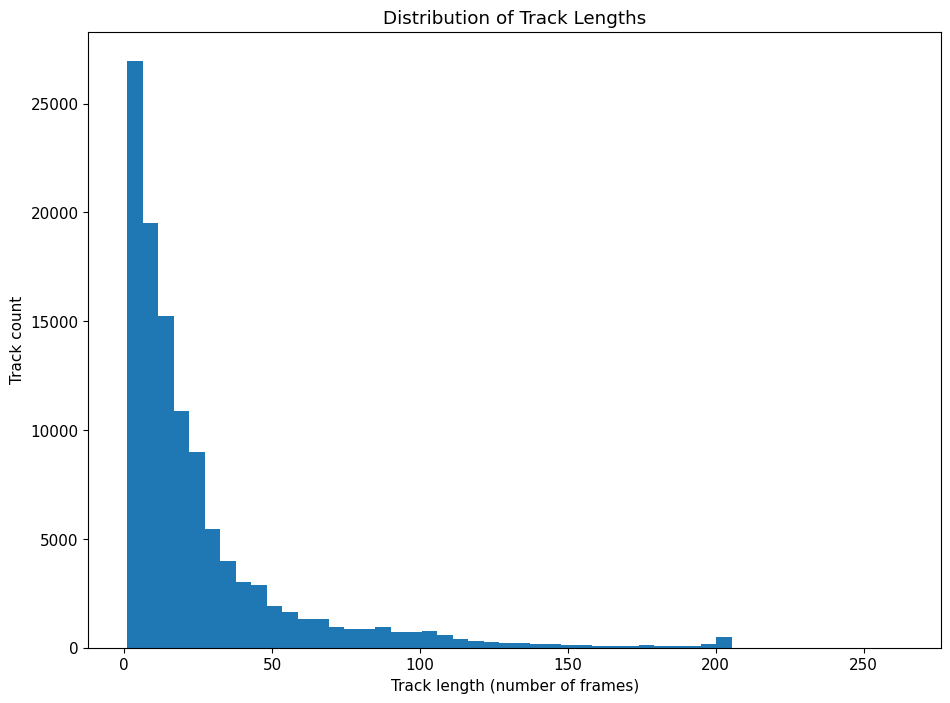

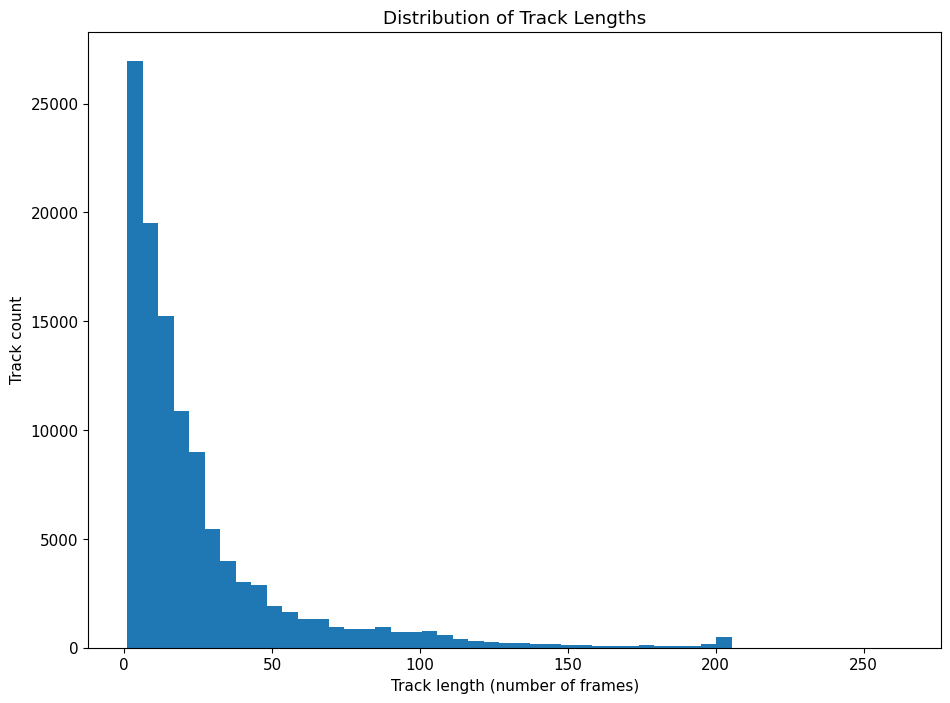

In [162]:
# ============================================================
# Sub-Step C5.4 — Track Length Distribution (Histogram)
# ============================================================

fig, ax = plt.subplots()
ax.hist(track_length_df["track_length"], bins=50)
ax.set_xlabel("Track length (number of frames)")
ax.set_ylabel("Track count")
ax.set_title("Distribution of Track Lengths")

add_fig_page_c5("STEP C5.4 — Histogram: Track Length Distribution", fig)

fig

In [163]:
# ============================================================
# Sub-Step C5.5 — Track Fragmentation Analysis
# ============================================================

# Sort for temporal gap analysis
df_sorted = df.sort_values([VIDEO_COL, TRACK_COL, FRAME_COL])

def count_segments(frames: pd.Series) -> int:
    frames = frames.values
    if len(frames) == 0:
        return 0
    # A new segment starts if gap > 1
    return 1 + np.sum(np.diff(frames) > 1)

fragmentation_df = (
    df_sorted
    .groupby([VIDEO_COL, TRACK_COL])[FRAME_COL]
    .apply(count_segments)
    .rename("num_segments")
    .reset_index()
)

frag_stats = fragmentation_df["num_segments"].describe(
    percentiles=[0.5, 0.9, 0.95, 0.99]
)

add_text_page_c5(
    title="STEP C5.5 — Track Fragmentation (Segment Count)",
    lines=[
        "Purpose:",
        "- Quantify track fragmentation via number of continuous segments",
        "",
        "Fragmentation statistics:",
        frag_stats.to_string(),
        "",
        "Preview (head):",
        fragmentation_df.head().to_string(index=False)
    ]
)

fragmentation_df

,videoName,id,num_segments
0,0000f77c-6257be58,00037555,1
1,0000f77c-6257be58,00037556,3
2,0000f77c-6257be58,00037557,1
3,0000f77c-6257be58,00037558,1
4,0000f77c-6257be58,00037559,1
...,...,...,...
112814,03d93dd6-990f83bb,00092466,1
112815,03d93dd6-990f83bb,00092467,1
112816,03d93dd6-990f83bb,00092468,1
112817,03d93dd6-990f83bb,00092469,1


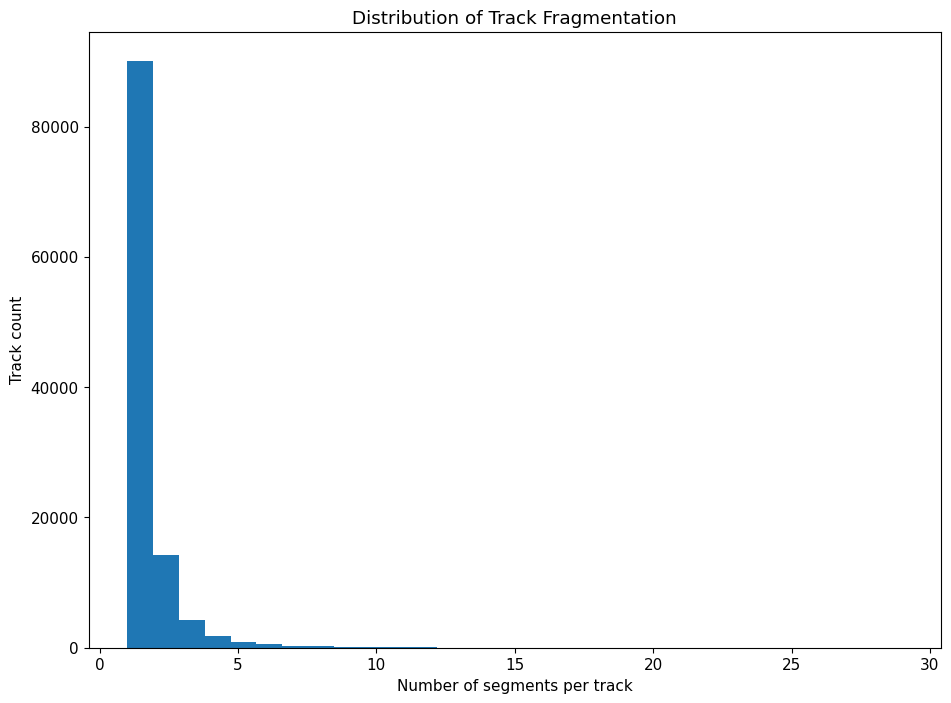

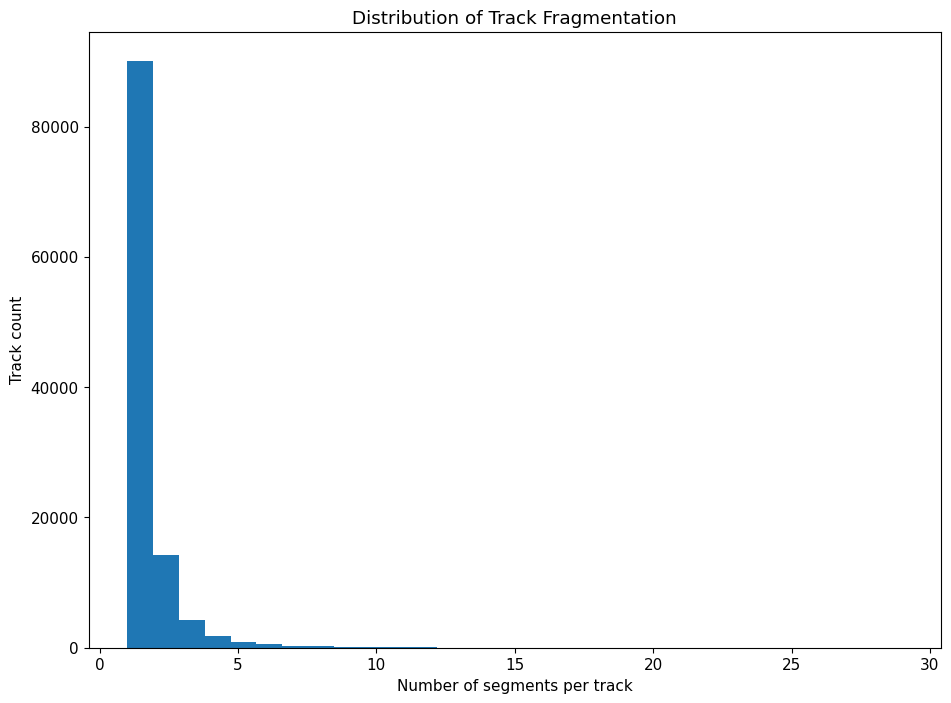

In [164]:
# ============================================================
# Sub-Step C5.6 — Fragmentation Distribution (Histogram)
# ============================================================

fig, ax = plt.subplots()
ax.hist(fragmentation_df["num_segments"], bins=30)
ax.set_xlabel("Number of segments per track")
ax.set_ylabel("Track count")
ax.set_title("Distribution of Track Fragmentation")

add_fig_page_c5("STEP C5.6 — Histogram: Track Fragmentation", fig)

fig

In [165]:
# ============================================================
# Sub-Step C5.7 — Export PDF (Finalize)
# ============================================================

render_report_c5(PDF_PATH_C5)

print(f"✅ PDF generated: {PDF_PATH_C5}")
display(FileLink(PDF_PATH_C5))

✅ PDF generated: EDA_STEP_C5_Temporal_Difficulty_Track_Length_Fragmentation.pdf


/kaggle/working/EDA_STEP_C5_Temporal_Difficulty_Track_Length_Fragmentation.pdf

__Insight Kesimpulan__

Hasil STEP C5 menunjukkan bahwa secara temporal, dataset BDD100K memiliki karakter campuran antara track pendek yang sangat dominan dan sejumlah kecil track panjang yang berpotensi sulit. Median track length hanya 15 frame, menandakan bahwa dalam window anotasi, banyak objek hanya muncul sebentar. Ini sangat sesuai dengan realitas dashcam, di mana objek sering terhalang, melintas cepat, atau keluar dari field of view.

Proporsi track pendek yang besar (sekitar 40% ≤10 frame) mengindikasikan bahwa banyak kasus tracking sebenarnya “trivial” karena durasi yang singkat, sementara tantangan sesungguhnya berada pada subset track yang lebih panjang. Track panjang ini biasanya merepresentasikan kendaraan di depan ego-vehicle atau objek yang bergerak searah dan relatif stabil.

Dari sisi fragmentasi, mayoritas track bersifat kontinu, namun adanya track dengan fragmentasi tinggi (hingga 29 segmen) menegaskan keberadaan skenario dunia nyata yang sulit, seperti occlusion berulang, objek kecil, atau interaksi kompleks antar objek. Dengan demikian, kesulitan tracking dalam dataset ini tidak merata, melainkan terkonsentrasi pada kasus-kasus tertentu yang realistis dan kritis.

# BLOK D — Visual Sanity & Edge Case Diagnostics

__🎯 Fungsi BLOK D__

Blok ini bertugas memvalidasi hasil EDA statistik dengan pengamatan visual langsung.
BLOK D menjawab pertanyaan krusial:

❓ Apakah bbox benar-benar “nempel” objek?

❓ Apakah ada pola error label yang berulang?

❓ Apakah kondisi sulit (gelap, blur, crowded) dominan?

Banyak masalah tidak terlihat dari angka, tapi langsung jelas saat divisualisasikan.


## D1 - Label Overlay Sanity Check (Qualitative)

In [166]:
# ============================================================
# STEP D1 — Report Setup (Collector)
# ============================================================

import os
import cv2
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
from textwrap import wrap
from IPython.display import FileLink, display

PDF_PATH_D1 = "EDA_STEP_D1_Label_Overlay_Sanity_Check.pdf"
REPORT_PAGES_D1 = []

def add_text_page_d1(title: str, lines: list[str]):
    REPORT_PAGES_D1.append({
        "type": "text",
        "title": title,
        "lines": [str(x) for x in lines]
    })

def add_fig_page_d1(title: str, fig):
    REPORT_PAGES_D1.append({
        "type": "fig",
        "title": title,
        "fig": fig
    })

def render_report_d1(pdf_path: str):
    plt.rcParams["figure.figsize"] = (11, 8)
    plt.rcParams["font.size"] = 11

    def _render_text(ax, title, lines):
        ax.axis("off")
        wrapped = []
        for line in lines:
            wrapped.extend(wrap(str(line), 110))
            wrapped.append("")
        ax.text(
            0.01, 0.98,
            f"{title}\n\n" + "\n".join(wrapped),
            va="top", ha="left", family="monospace"
        )

    with PdfPages(pdf_path) as pdf:
        for page in REPORT_PAGES_D1:
            if page["type"] == "text":
                fig, ax = plt.subplots()
                _render_text(ax, page["title"], page["lines"])
                pdf.savefig(fig)
                plt.close(fig)
            elif page["type"] == "fig":
                page["fig"].suptitle(page["title"], y=0.98)
                pdf.savefig(page["fig"])
                plt.close(page["fig"])

print("✅ Collector STEP D1 siap. Lanjut D1.1")

✅ Collector STEP D1 siap. Lanjut D1.1


In [167]:
# ============================================================
# Sub-Step D1.1 — Scope + Sample Plan (SoT df, label-aware)
# ============================================================

from pathlib import Path
import numpy as np
import pandas as pd
import random

# 1) Pastikan df tersedia (SoT dari Block A–C)
assert "df" in globals(), (
    "Variabel 'df' tidak ditemukan. Pastikan cell load Parquet (SoT) di Block A–C sudah dijalankan."
)

# 2) Pastikan VIDEO_DIR tersedia (dari STEP A1)
assert "VIDEO_DIR" in globals(), (
    "Variabel 'VIDEO_DIR' tidak ditemukan. Jalankan STEP A1 inventory video dulu (Block A)."
)
assert Path(VIDEO_DIR).exists(), f"VIDEO_DIR tidak exist: {VIDEO_DIR}"

# 3) Kontrak kolom minimum untuk overlay
required_cols = ["haveVideo", "videoName", "frameIndex", "id", "category",
                 "box2d.x1", "box2d.y1", "box2d.x2", "box2d.y2"]
missing = [c for c in required_cols if c not in df.columns]
assert len(missing) == 0, f"Kolom label wajib tidak ada: {missing}"

# 4) Scope: hanya joinable labels
df_d1 = df[df["haveVideo"] == True].copy()

# 5) Normalisasi videoName -> .mov (sinkron dengan prinsip STEP A3)
def normalize_video_name(v: str) -> str:
    v = str(v).strip()
    return v if v.endswith(".mov") else v + ".mov"

df_d1["videoName_norm"] = df_d1["videoName"].map(normalize_video_name)

# 6) Sampling plan: pilih beberapa video, beberapa frame per video (hanya frame yang ada labelnya)
N_VIDEOS = 4
N_FRAMES_PER_VIDEO = 3
RANDOM_SEED = 42
random.seed(RANDOM_SEED)

video_candidates = (
    df_d1["videoName_norm"]
    .value_counts()
    .index
    .tolist()
)

N_VIDEOS = min(N_VIDEOS, len(video_candidates))
sample_videos = random.sample(video_candidates, N_VIDEOS)

sample_plan = []
for v in sample_videos:
    frames = (
        df_d1.loc[df_d1["videoName_norm"] == v, "frameIndex"]
        .dropna()
        .astype(int)
        .drop_duplicates()
        .sort_values()
        .tolist()
    )
    k = min(N_FRAMES_PER_VIDEO, len(frames))
    chosen = random.sample(frames, k) if k > 0 else []
    chosen = sorted(chosen)
    for f in chosen:
        sample_plan.append((v, f))

sample_plan_df = pd.DataFrame(sample_plan, columns=["videoName_norm", "frameIndex"])

add_text_page_d1(
    title="STEP D1.1 — Scope & Sample Plan (haveVideo=True)",
    lines=[
        "Purpose:",
        "- Use SoT label df (Block A–C) and create sample plan for visual overlay",
        "",
        f"VIDEO_DIR: {VIDEO_DIR}",
        f"Total rows (df): {len(df):,}",
        f"Rows haveVideo=True (df_d1): {len(df_d1):,}",
        f"Unique videos (haveVideo=True): {df_d1['videoName_norm'].nunique():,}",
        "",
        f"Sample config: N_VIDEOS={N_VIDEOS}, N_FRAMES_PER_VIDEO={N_FRAMES_PER_VIDEO}, seed={RANDOM_SEED}",
        "",
        "Sample plan (videoName_norm, frameIndex):",
        sample_plan_df.to_string(index=False)
    ]
)

sample_plan_df

,videoName_norm,frameIndex
0,017b02cb-477b66fa.mov,57
1,017b02cb-477b66fa.mov,62
2,017b02cb-477b66fa.mov,70
3,0298709e-771de5a8.mov,26
4,0298709e-771de5a8.mov,35
5,0298709e-771de5a8.mov,188
6,02a79112-1c04010d.mov,139
7,02a79112-1c04010d.mov,173
8,02a79112-1c04010d.mov,189
9,01a0fe55-298688cb.mov,22


(<Figure size 1300x4800 with 12 Axes>,
            videoName_norm  frameIndex  n_boxes  tiny_boxes(<0.05%)  \
 0   017b02cb-477b66fa.mov          57        8                   0   
 1   017b02cb-477b66fa.mov          62        9                   1   
 2   017b02cb-477b66fa.mov          70        7                   0   
 3   0298709e-771de5a8.mov          26       22                  11   
 4   0298709e-771de5a8.mov          35       24                  12   
 5   0298709e-771de5a8.mov         188        9                   0   
 6   02a79112-1c04010d.mov         139       28                   0   
 7   02a79112-1c04010d.mov         173       27                   2   
 8   02a79112-1c04010d.mov         189       31                   1   
 9   01a0fe55-298688cb.mov          22       18                   1   
 10  01a0fe55-298688cb.mov         108        5                   1   
 11  01a0fe55-298688cb.mov         151        4                   1   
 
     huge_boxes(>50%)  
 0          

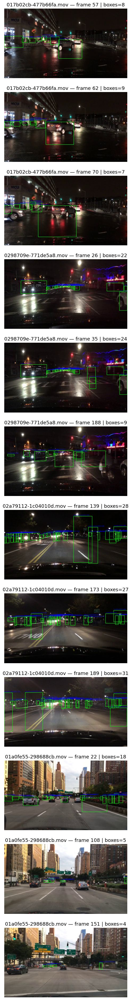

In [168]:
# ============================================================
# Sub-Step D1.2 — Visual Overlay (BBox xyxy + category + id)
# ============================================================

import os
import cv2
import matplotlib.pyplot as plt
import numpy as np

def clamp_int(v, lo, hi):
    return int(max(lo, min(hi, int(v))))

def draw_overlay_xyxy(frame_bgr, rows, alpha_fill=0.0):
    """
    frame_bgr: np.uint8 (H,W,3) BGR
    rows: df subset for one (video, frame)
    """
    img = frame_bgr.copy()
    H, W = img.shape[:2]

    for _, r in rows.iterrows():
        x1 = r["box2d.x1"]; y1 = r["box2d.y1"]; x2 = r["box2d.x2"]; y2 = r["box2d.y2"]
        # coerce numeric
        try:
            x1 = float(x1); y1 = float(y1); x2 = float(x2); y2 = float(y2)
        except:
            continue

        # clamp to image bounds
        x1c = clamp_int(x1, 0, W-1)
        y1c = clamp_int(y1, 0, H-1)
        x2c = clamp_int(x2, 0, W-1)
        y2c = clamp_int(y2, 0, H-1)

        # ensure proper ordering
        xa, xb = min(x1c, x2c), max(x1c, x2c)
        ya, yb = min(y1c, y2c), max(y1c, y2c)

        cat = str(r["category"])
        tid = str(r["id"])  # track_id lokal per video

        # optional translucent fill (default off)
        if alpha_fill > 0:
            overlay = img.copy()
            cv2.rectangle(overlay, (xa, ya), (xb, yb), (0, 255, 0), -1)
            img = cv2.addWeighted(overlay, alpha_fill, img, 1 - alpha_fill, 0)

        cv2.rectangle(img, (xa, ya), (xb, yb), (0, 255, 0), 2)
        cv2.putText(
            img,
            f"{cat}|id:{tid}",
            (xa, max(ya - 6, 12)),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.45,
            (255, 0, 0),
            1,
            cv2.LINE_AA
        )

    return img

# Helper: read a specific frame index
def read_frame(video_path, frame_idx):
    cap = cv2.VideoCapture(video_path)
    cap.set(cv2.CAP_PROP_POS_FRAMES, int(frame_idx))
    ret, frame = cap.read()
    cap.release()
    return ret, frame

# Build a multi-panel figure: one row per sampled item
n_items = len(sample_plan_df)
fig, axes = plt.subplots(n_items, 1, figsize=(13, 4 * max(1, n_items)))
if n_items == 1:
    axes = [axes]

# Collect quick heuristic flags (optional) for text page
heur_flags = []

for ax, (vnorm, fidx) in zip(axes, sample_plan_df[["videoName_norm", "frameIndex"]].itertuples(index=False, name=None)):
    video_path = os.path.join(str(VIDEO_DIR), str(vnorm))
    assert os.path.exists(video_path), f"Video file not found: {video_path}"

    ret, frame_bgr = read_frame(video_path, fidx)
    assert ret, f"Failed to read frame {fidx} from {vnorm}"

    rows = df_d1[(df_d1["videoName_norm"] == vnorm) & (df_d1["frameIndex"].astype(int) == int(fidx))]

    overlay_bgr = draw_overlay_xyxy(frame_bgr, rows, alpha_fill=0.0)
    overlay_rgb = cv2.cvtColor(overlay_bgr, cv2.COLOR_BGR2RGB)

    # heuristic: count bboxes with extreme area ratio
    H, W = frame_bgr.shape[:2]
    areas = []
    for _, r in rows.iterrows():
        try:
            x1=float(r["box2d.x1"]); y1=float(r["box2d.y1"]); x2=float(r["box2d.x2"]); y2=float(r["box2d.y2"])
            a = abs((x2-x1) * (y2-y1))
            areas.append(a/(W*H))
        except:
            pass
    areas = np.array(areas) if len(areas) else np.array([])
    tiny = int(np.sum(areas < 0.0005)) if len(areas) else 0
    huge = int(np.sum(areas > 0.50)) if len(areas) else 0

    heur_flags.append({
        "videoName_norm": vnorm,
        "frameIndex": int(fidx),
        "n_boxes": int(len(rows)),
        "tiny_boxes(<0.05%)": tiny,
        "huge_boxes(>50%)": huge
    })

    ax.imshow(overlay_rgb)
    ax.set_title(f"{vnorm} — frame {int(fidx)} | boxes={len(rows)}")
    ax.axis("off")

add_fig_page_d1("STEP D1.2 — Label Overlay Visualization (BBox + category + id)", fig)

heur_flags_df = pd.DataFrame(heur_flags)
add_text_page_d1(
    title="STEP D1.2 — Heuristic Flags (Support, EDA-only)",
    lines=[
        "Purpose:",
        "- Provide light heuristics to accompany visual inspection (NOT a replacement)",
        "",
        heur_flags_df.to_string(index=False),
        "",
        "Notes:",
        "- tiny_boxes indicates many extremely small bboxes; verify visually if they are valid (distant objects) or labeling artifacts.",
        "- huge_boxes indicates very large boxes; verify if they cover correct object or are shifted/oversized."
    ]
)

fig, heur_flags_df

In [169]:
# ============================================================
# Sub-Step D1.3 — Visual Notes & Decision (Template)
# ============================================================

visual_checklist = [
    "Apakah bbox menempel objek (tidak offset)?",
    "Apakah bbox terlalu besar/kecil (scale) pada objek utama?",
    "Apakah ada bbox di luar frame / ter-clamp parah?",
    "Apakah category tampak masuk akal (misclass jelas)?",
    "Apakah id (track) pada frame tampak konsisten (tidak konflik obvious)?",
    "Apakah ada pola error berulang di beberapa sample?"
]

# Isi manual setelah Anda lihat panel D1.2 (boleh edit cell ini)
visual_notes = [
    "TBD",
]

decision = "TBD — (pilih salah satu) Label usable / Perlu cleaning khusus"

add_text_page_d1(
    title="STEP D1.3 — Visual Checklist, Notes & Decision (Fill After Inspect)",
    lines=[
        "Checklist (answer after inspecting D1.2 panels):",
        *[f"- {x}" for x in visual_checklist],
        "",
        "Your notes:",
        *[f"- {x}" for x in visual_notes],
        "",
        "Decision:",
        decision
    ]
)

pd.Series(visual_checklist, name="Checklist")

0           Apakah bbox menempel objek (tidak offset)?
1    Apakah bbox terlalu besar/kecil (scale) pada o...
2     Apakah ada bbox di luar frame / ter-clamp parah?
3    Apakah category tampak masuk akal (misclass je...
4    Apakah id (track) pada frame tampak konsisten ...
5    Apakah ada pola error berulang di beberapa sam...
Name: Checklist, dtype: object

In [170]:
# ============================================================
# Sub-Step D1.4 — Export PDF (Finalize)
# ============================================================

render_report_d1(PDF_PATH_D1)

print(f"✅ PDF generated: {PDF_PATH_D1}")
display(FileLink(PDF_PATH_D1))

✅ PDF generated: EDA_STEP_D1_Label_Overlay_Sanity_Check.pdf


/kaggle/working/EDA_STEP_D1_Label_Overlay_Sanity_Check.pdf

## D2 - Crowded Scene & Occlusion Visual Audit

In [171]:
# ============================================================
# STEP D2 — Report Setup (Collector)
# ============================================================

import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
from textwrap import wrap
from IPython.display import FileLink, display

PDF_PATH_D2 = "EDA_STEP_D2_Crowded_Scene_and_Occlusion_Audit.pdf"
REPORT_PAGES_D2 = []

def add_text_page_d2(title: str, lines: list[str]):
    REPORT_PAGES_D2.append({
        "type": "text",
        "title": title,
        "lines": [str(x) for x in lines]
    })

def add_fig_page_d2(title: str, fig):
    REPORT_PAGES_D2.append({
        "type": "fig",
        "title": title,
        "fig": fig
    })

def render_report_d2(pdf_path: str):
    plt.rcParams["figure.figsize"] = (11, 8)
    plt.rcParams["font.size"] = 11

    def _render_text(ax, title, lines):
        ax.axis("off")
        wrapped = []
        for line in lines:
            wrapped.extend(wrap(str(line), 110))
            wrapped.append("")
        ax.text(
            0.01, 0.98,
            f"{title}\n\n" + "\n".join(wrapped),
            va="top", ha="left", family="monospace"
        )

    with PdfPages(pdf_path) as pdf:
        for page in REPORT_PAGES_D2:
            if page["type"] == "text":
                fig, ax = plt.subplots()
                _render_text(ax, page["title"], page["lines"])
                pdf.savefig(fig)
                plt.close(fig)
            elif page["type"] == "fig":
                page["fig"].suptitle(page["title"], y=0.98)
                pdf.savefig(page["fig"])
                plt.close(page["fig"])

print("✅ Collector STEP D2 siap. Lanjut D2.1")

✅ Collector STEP D2 siap. Lanjut D2.1


In [172]:
# ============================================================
# Sub-Step D2.1 — Crowded Frame Selection (from Block C signals)
# ============================================================

# Pastikan df_d1 (haveVideo=True) tersedia dari STEP D1
assert "df_d1" in globals(), "df_d1 tidak ditemukan. Jalankan STEP D1.1 terlebih dahulu."

# Hitung object count per (video, frame)
frame_counts = (
    df_d1
    .groupby(["videoName_norm", "frameIndex"])
    .size()
    .reset_index(name="n_objects")
)

# Ambil Top-K frame paling crowded
TOP_K = 8
crowded_frames = (
    frame_counts
    .sort_values("n_objects", ascending=False)
    .head(TOP_K)
    .reset_index(drop=True)
)

add_text_page_d2(
    title="STEP D2.1 — Crowded Frame Selection",
    lines=[
        "Purpose:",
        "- Select most crowded frames (high object count) for visual occlusion audit",
        "",
        f"Top-K crowded frames: {TOP_K}",
        "",
        crowded_frames.to_string(index=False)
    ]
)

crowded_frames

,videoName_norm,frameIndex,n_objects
0,002d290d-89d1aea8.mov,5,44
1,002d290d-90f2bab2.mov,119,43
2,002d290d-89d1aea8.mov,6,42
3,027b216c-bfae3d6d.mov,201,42
4,002d290d-89d1aea8.mov,4,41
5,002d290d-90f2bab2.mov,118,41
6,002d290d-90f2bab2.mov,114,41
7,002d290d-90f2bab2.mov,124,41


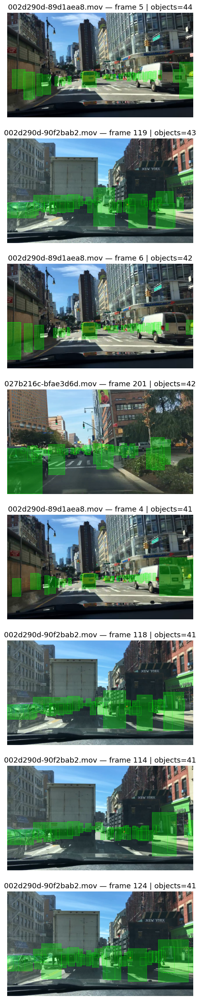

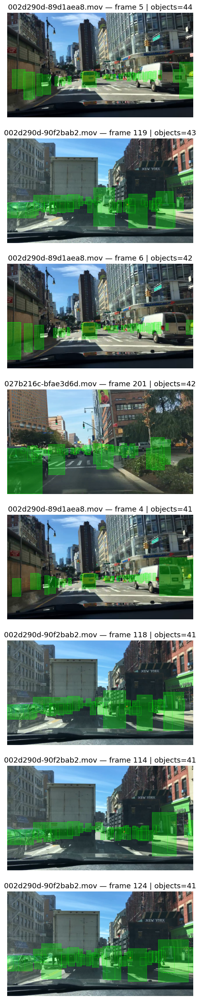

In [173]:
# ============================================================
# Sub-Step D2.2 — Visual Overlay (Transparency for Occlusion)
# ============================================================

def draw_overlay_transparent(frame_bgr, rows, alpha=0.25):
    img = frame_bgr.copy()
    overlay = frame_bgr.copy()
    H, W = img.shape[:2]

    for _, r in rows.iterrows():
        try:
            x1, y1 = int(r["box2d.x1"]), int(r["box2d.y1"])
            x2, y2 = int(r["box2d.x2"]), int(r["box2d.y2"])
        except:
            continue

        x1 = max(0, min(W - 1, x1))
        y1 = max(0, min(H - 1, y1))
        x2 = max(0, min(W - 1, x2))
        y2 = max(0, min(H - 1, y2))

        cv2.rectangle(overlay, (x1, y1), (x2, y2), (0, 255, 0), -1)
        cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 1)

    blended = cv2.addWeighted(overlay, alpha, img, 1 - alpha, 0)
    return blended

fig, axes = plt.subplots(len(crowded_frames), 1, figsize=(13, 4 * len(crowded_frames)))
if len(crowded_frames) == 1:
    axes = [axes]

for ax, row in zip(axes, crowded_frames.itertuples(index=False)):
    video_path = os.path.join(VIDEO_DIR, row.videoName_norm)
    ret, frame = read_frame(video_path, row.frameIndex)
    assert ret, f"Gagal membaca frame {row.frameIndex} dari {row.videoName_norm}"

    rows = df_d1[
        (df_d1["videoName_norm"] == row.videoName_norm) &
        (df_d1["frameIndex"] == row.frameIndex)
    ]

    overlay = draw_overlay_transparent(frame, rows, alpha=0.30)
    overlay_rgb = cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB)

    ax.imshow(overlay_rgb)
    ax.set_title(f"{row.videoName_norm} — frame {row.frameIndex} | objects={row.n_objects}")
    ax.axis("off")

add_fig_page_d2(
    "STEP D2.2 — Crowded Scene Overlay (Transparency)",
    fig
)

fig

In [174]:
# ============================================================
# Sub-Step D2.3 — Observational Notes (No Decision)
# ============================================================

occlusion_observation_template = [
    "Frame dengan object count tinggi menunjukkan overlap bbox yang signifikan.",
    "Beberapa objek tampak tertutup sebagian oleh objek lain (occlusion parsial).",
    "Bounding box masih terpasang pada objek yang relevan meskipun terjadi overlap.",
    "Tidak dilakukan penilaian benar/salah; catatan ini bersifat observasional."
]

add_text_page_d2(
    title="STEP D2.3 — Occlusion & Overlap Observations (Qualitative)",
    lines=[
        "Observational notes (no decision, no recommendation):",
        *[f"- {x}" for x in occlusion_observation_template]
    ]
)

pd.Series(occlusion_observation_template, name="Occlusion Notes")

0    Frame dengan object count tinggi menunjukkan o...
1    Beberapa objek tampak tertutup sebagian oleh o...
2    Bounding box masih terpasang pada objek yang r...
3    Tidak dilakukan penilaian benar/salah; catatan...
Name: Occlusion Notes, dtype: object

In [175]:
# ============================================================
# Sub-Step D2.4 — Export PDF (Finalize)
# ============================================================

render_report_d2(PDF_PATH_D2)

print(f"✅ PDF generated: {PDF_PATH_D2}")
display(FileLink(PDF_PATH_D2))

✅ PDF generated: EDA_STEP_D2_Crowded_Scene_and_Occlusion_Audit.pdf


/kaggle/working/EDA_STEP_D2_Crowded_Scene_and_Occlusion_Audit.pdf

## D3 - Lighting Condition (Day / Night Proxy)

In [176]:
# ============================================================
# STEP D3 — Report Setup (Collector)
# ============================================================

import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
from textwrap import wrap
from IPython.display import FileLink, display

PDF_PATH_D3 = "EDA_STEP_D3_Lighting_Condition_Day_Night_Proxy.pdf"
REPORT_PAGES_D3 = []

def add_text_page_d3(title: str, lines: list[str]):
    REPORT_PAGES_D3.append({
        "type": "text",
        "title": title,
        "lines": [str(x) for x in lines]
    })

def add_fig_page_d3(title: str, fig):
    REPORT_PAGES_D3.append({
        "type": "fig",
        "title": title,
        "fig": fig
    })

def render_report_d3(pdf_path: str):
    plt.rcParams["figure.figsize"] = (11, 8)
    plt.rcParams["font.size"] = 11

    def _render_text(ax, title, lines):
        ax.axis("off")
        wrapped = []
        for line in lines:
            wrapped.extend(wrap(str(line), 110))
            wrapped.append("")
        ax.text(
            0.01, 0.98,
            f"{title}\n\n" + "\n".join(wrapped),
            va="top", ha="left", family="monospace"
        )

    with PdfPages(pdf_path) as pdf:
        for page in REPORT_PAGES_D3:
            if page["type"] == "text":
                fig, ax = plt.subplots()
                _render_text(ax, page["title"], page["lines"])
                pdf.savefig(fig)
                plt.close(fig)
            elif page["type"] == "fig":
                page["fig"].suptitle(page["title"], y=0.98)
                pdf.savefig(page["fig"])
                plt.close(page["fig"])

print("✅ Collector STEP D3 siap. Lanjut D3.1")

✅ Collector STEP D3 siap. Lanjut D3.1


In [177]:
# ============================================================
# Sub-Step D3.1 — Frame-Level Mean Brightness
# ============================================================

# Prasyarat
assert "df_d1" in globals(), "df_d1 tidak ditemukan. Jalankan STEP D1."
assert "VIDEO_DIR" in globals(), "VIDEO_DIR tidak ditemukan."

# Ambil sample frame unik dari df_d1 (hemat komputasi)
SAMPLE_MAX = 1500
frames_unique = (
    df_d1[["videoName_norm", "frameIndex"]]
    .drop_duplicates()
    .sample(n=min(SAMPLE_MAX, len(df_d1)), random_state=42)
    .reset_index(drop=True)
)

def compute_mean_brightness(video_path, frame_idx):
    cap = cv2.VideoCapture(video_path)
    cap.set(cv2.CAP_PROP_POS_FRAMES, int(frame_idx))
    ret, frame = cap.read()
    cap.release()
    if not ret:
        return np.nan
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    return float(np.mean(gray))

brightness_vals = []
for r in frames_unique.itertuples(index=False):
    vp = os.path.join(VIDEO_DIR, r.videoName_norm)
    if not os.path.exists(vp):
        brightness_vals.append(np.nan)
        continue
    brightness_vals.append(compute_mean_brightness(vp, r.frameIndex))

brightness_df = frames_unique.copy()
brightness_df["mean_brightness"] = brightness_vals
brightness_df = brightness_df.dropna().reset_index(drop=True)

add_text_page_d3(
    title="STEP D3.1 — Frame-Level Mean Brightness",
    lines=[
        "Computed values:",
        f"Sampled frames: {len(brightness_df)}",
        "",
        brightness_df.describe().to_string()
    ]
)

brightness_df.head()

,videoName_norm,frameIndex,mean_brightness
0,01ce3717-4aa554ab.mov,70,105.805069
1,00391a82-d1428e56.mov,138,40.851730
2,0104eb19-162abfea.mov,158,100.684351
3,02a26ce5-42f8fd75.mov,123,103.227163
4,01ff2210-403e7e0f.mov,155,121.378657


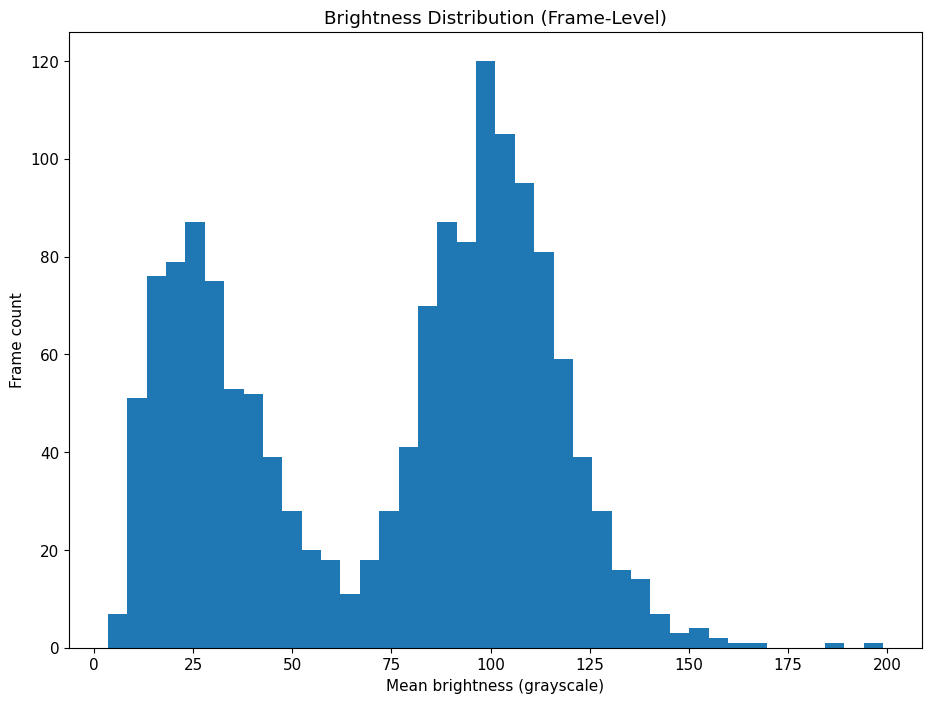

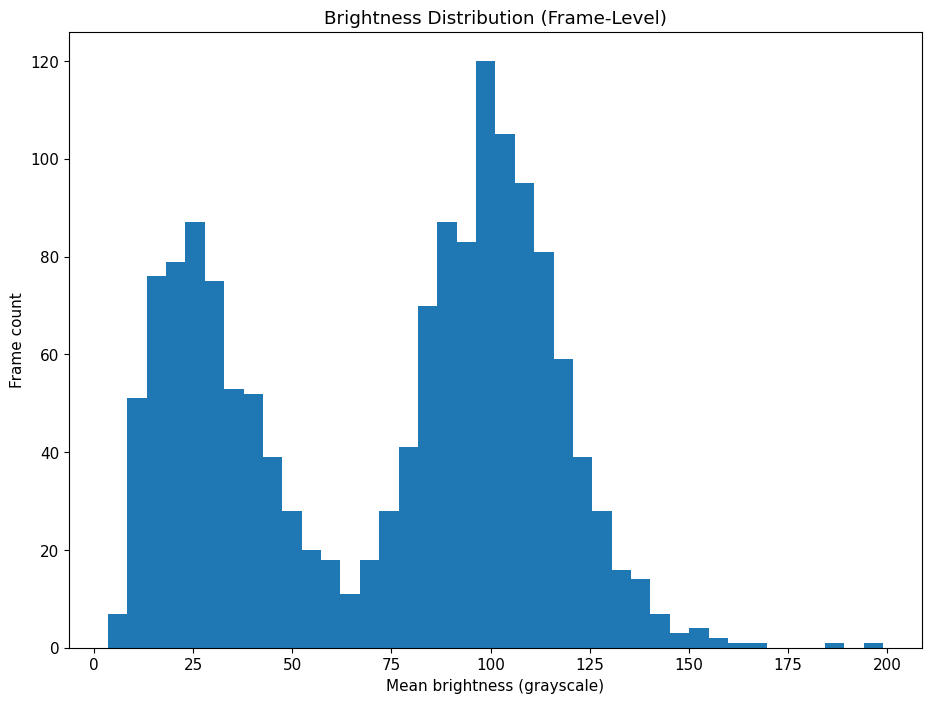

In [178]:
# ============================================================
# Sub-Step D3.2 — Brightness Distribution
# ============================================================

fig, ax = plt.subplots()
ax.hist(brightness_df["mean_brightness"], bins=40)
ax.set_xlabel("Mean brightness (grayscale)")
ax.set_ylabel("Frame count")
ax.set_title("Brightness Distribution (Frame-Level)")

add_fig_page_d3("STEP D3.2 — Brightness Distribution", fig)

fig

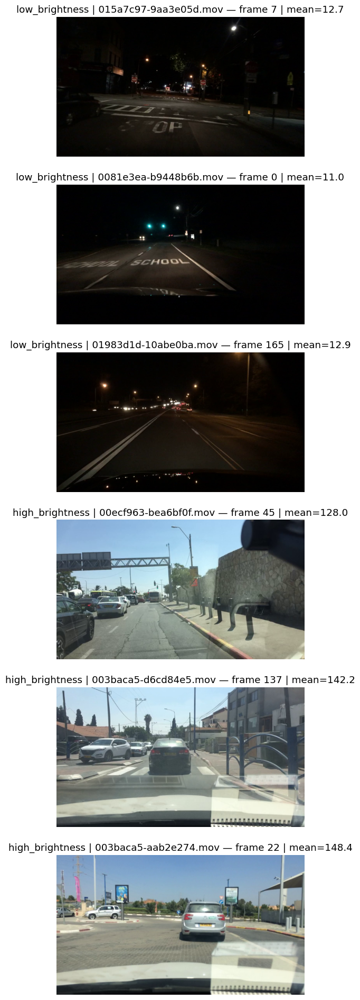

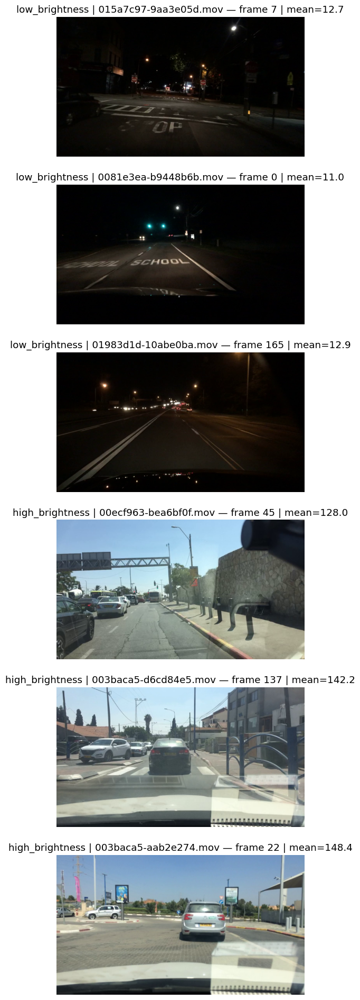

In [179]:
# ============================================================
# Sub-Step D3.3 — Visual Examples (Low vs High Brightness)
# ============================================================

# Pilih frame ekstrem berbasis quantile
LOW_Q = 0.05
HIGH_Q = 0.95

low_thresh = brightness_df["mean_brightness"].quantile(LOW_Q)
high_thresh = brightness_df["mean_brightness"].quantile(HIGH_Q)

low_samples = brightness_df[brightness_df["mean_brightness"] <= low_thresh].head(3)
high_samples = brightness_df[brightness_df["mean_brightness"] >= high_thresh].head(3)

samples = pd.concat([
    low_samples.assign(bucket="low_brightness"),
    high_samples.assign(bucket="high_brightness")
])

fig, axes = plt.subplots(len(samples), 1, figsize=(13, 4 * len(samples)))
if len(samples) == 1:
    axes = [axes]

for ax, r in zip(axes, samples.itertuples(index=False)):
    vp = os.path.join(VIDEO_DIR, r.videoName_norm)
    cap = cv2.VideoCapture(vp)
    cap.set(cv2.CAP_PROP_POS_FRAMES, int(r.frameIndex))
    ret, frame = cap.read()
    cap.release()
    assert ret, f"Gagal membaca frame {r.frameIndex} dari {r.videoName_norm}"

    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    ax.imshow(frame_rgb)
    ax.set_title(f"{r.bucket} | {r.videoName_norm} — frame {r.frameIndex} | mean={r.mean_brightness:.1f}")
    ax.axis("off")

add_fig_page_d3(
    "STEP D3.3 — Visual Examples (Low vs High Brightness)",
    fig
)

fig

In [180]:
# ============================================================
# Sub-Step D3.4 — Export PDF (Finalize)
# ============================================================

render_report_d3(PDF_PATH_D3)

print(f"✅ PDF generated: {PDF_PATH_D3}")
display(FileLink(PDF_PATH_D3))

✅ PDF generated: EDA_STEP_D3_Lighting_Condition_Day_Night_Proxy.pdf


/kaggle/working/EDA_STEP_D3_Lighting_Condition_Day_Night_Proxy.pdf

__Insight Kesimpulan__

Sub-step D3.1
Perhitungan mean brightness pada 1.500 frame menunjukkan bahwa dataset memiliki rentang pencahayaan yang sangat luas, dari kondisi hampir gelap total hingga pencahayaan tinggi, tanpa indikasi bias ekstrim ke satu kondisi tertentu. 

Sub-step D3.2
Distribusi brightness yang kontinu mengindikasikan bahwa variasi lighting merupakan karakter inheren dataset, bukan anomali yang hanya muncul pada sebagian kecil frame. Hal ini memperkuat bahwa kondisi pencahayaan perlu diperlakukan sebagai dimensi kesulitan yang sistemik. 

Sub-step D3.3
Contoh visual low vs high brightness memvalidasi bahwa nilai numerik brightness yang dihitung benar-benar merepresentasikan perbedaan kondisi malam dan siang secara visual, sehingga hasil kuantitatif dan visual saling konsisten.

## D4 - Motion Blur & Sharpness Proxy

In [181]:
# ============================================================
# STEP D4 — Report Setup (Collector)
# ============================================================

import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
from textwrap import wrap
from IPython.display import FileLink, display

PDF_PATH_D4 = "EDA_STEP_D4_Motion_Blur_and_Sharpness_Proxy.pdf"
REPORT_PAGES_D4 = []

def add_text_page_d4(title: str, lines: list[str]):
    REPORT_PAGES_D4.append({
        "type": "text",
        "title": title,
        "lines": [str(x) for x in lines]
    })

def add_fig_page_d4(title: str, fig):
    REPORT_PAGES_D4.append({
        "type": "fig",
        "title": title,
        "fig": fig
    })

def render_report_d4(pdf_path: str):
    plt.rcParams["figure.figsize"] = (11, 8)
    plt.rcParams["font.size"] = 11

    def _render_text(ax, title, lines):
        ax.axis("off")
        wrapped = []
        for line in lines:
            wrapped.extend(wrap(str(line), 110))
            wrapped.append("")
        ax.text(
            0.01, 0.98,
            f"{title}\n\n" + "\n".join(wrapped),
            va="top", ha="left", family="monospace"
        )

    with PdfPages(pdf_path) as pdf:
        for page in REPORT_PAGES_D4:
            if page["type"] == "text":
                fig, ax = plt.subplots()
                _render_text(ax, page["title"], page["lines"])
                pdf.savefig(fig)
                plt.close(fig)
            elif page["type"] == "fig":
                page["fig"].suptitle(page["title"], y=0.98)
                pdf.savefig(page["fig"])
                plt.close(page["fig"])

print("✅ Collector STEP D4 siap. Lanjut D4.1")

✅ Collector STEP D4 siap. Lanjut D4.1


In [182]:
# ============================================================
# Sub-Step D4.1 — Frame-Level Sharpness Proxy (Var(Laplacian))
# ============================================================

# Prasyarat dari step sebelumnya
assert "df_d1" in globals(), "df_d1 tidak ditemukan. Jalankan STEP D1."
assert "VIDEO_DIR" in globals(), "VIDEO_DIR tidak ditemukan."

# gunakan sampling frame unik (hemat compute)
SAMPLE_MAX = 1500
frames_unique = (
    df_d1[["videoName_norm", "frameIndex"]]
    .drop_duplicates()
    .sample(n=min(SAMPLE_MAX, len(df_d1)), random_state=42)
    .reset_index(drop=True)
)

def compute_laplacian_var(video_path, frame_idx):
    cap = cv2.VideoCapture(video_path)
    cap.set(cv2.CAP_PROP_POS_FRAMES, int(frame_idx))
    ret, frame = cap.read()
    cap.release()
    if not ret:
        return np.nan
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    lap = cv2.Laplacian(gray, cv2.CV_64F)
    return float(lap.var())

sharp_vals = []
for r in frames_unique.itertuples(index=False):
    vp = os.path.join(VIDEO_DIR, r.videoName_norm)
    if not os.path.exists(vp):
        sharp_vals.append(np.nan)
        continue
    sharp_vals.append(compute_laplacian_var(vp, r.frameIndex))

sharpness_df = frames_unique.copy()
sharpness_df["laplacian_var"] = sharp_vals
sharpness_df = sharpness_df.dropna().reset_index(drop=True)

# indikatif threshold (numerik saja; tanpa interpretasi)
Q_LOW = 0.05
Q_HIGH = 0.95
thr_low = float(sharpness_df["laplacian_var"].quantile(Q_LOW))
thr_high = float(sharpness_df["laplacian_var"].quantile(Q_HIGH))

add_text_page_d4(
    title="STEP D4.1 — Sharpness Proxy Summary (Var(Laplacian))",
    lines=[
        f"Sampled frames: {len(sharpness_df)}",
        "",
        sharpness_df["laplacian_var"].describe().to_string(),
        "",
        f"Quantile thresholds: Q{int(Q_LOW*100)}={thr_low:.3f}, Q{int(Q_HIGH*100)}={thr_high:.3f}"
    ]
)

sharpness_df.head()

,videoName_norm,frameIndex,laplacian_var
0,01ce3717-4aa554ab.mov,70,743.892286
1,00391a82-d1428e56.mov,138,78.607200
2,0104eb19-162abfea.mov,158,903.860861
3,02a26ce5-42f8fd75.mov,123,777.735081
4,01ff2210-403e7e0f.mov,155,204.033438


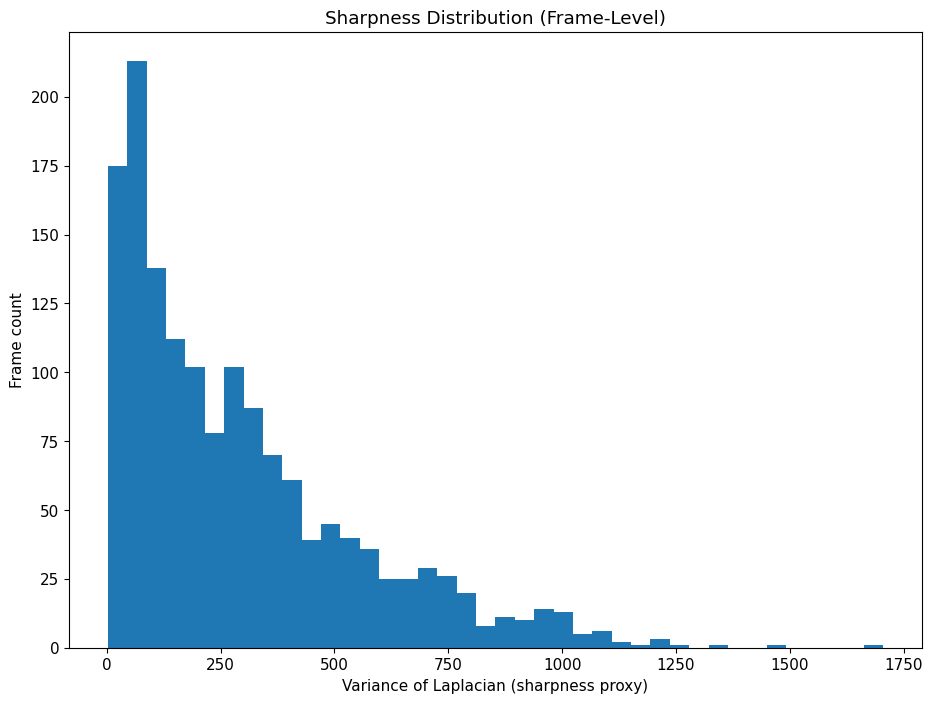

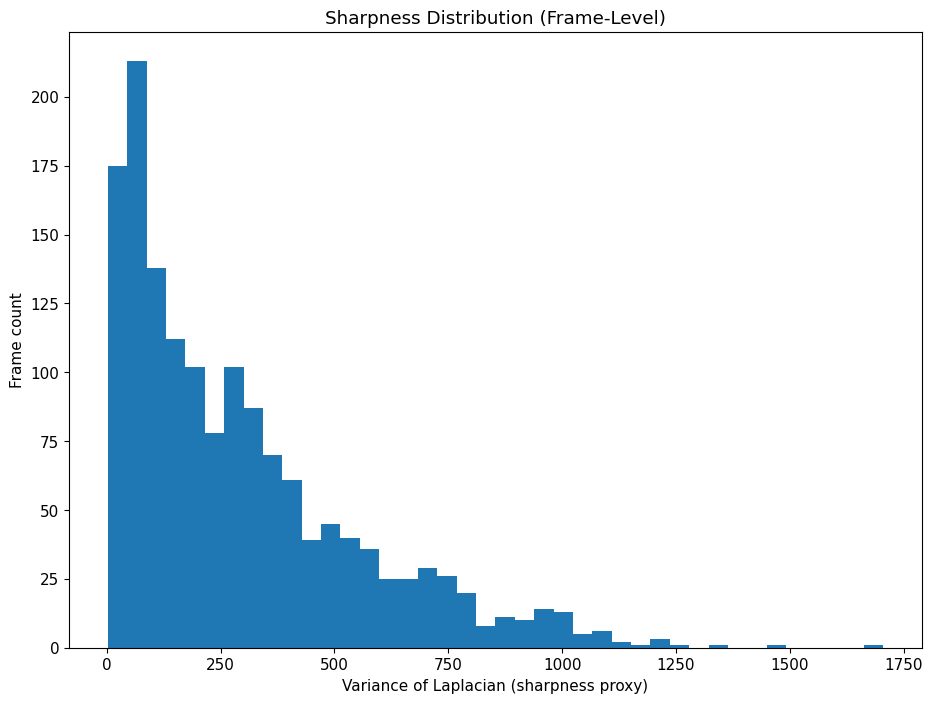

In [183]:
# ============================================================
# Sub-Step D4.2 — Sharpness Distribution
# ============================================================

fig, ax = plt.subplots()
ax.hist(sharpness_df["laplacian_var"], bins=40)
ax.set_xlabel("Variance of Laplacian (sharpness proxy)")
ax.set_ylabel("Frame count")
ax.set_title("Sharpness Distribution (Frame-Level)")

add_fig_page_d4("STEP D4.2 — Sharpness Distribution", fig)

fig

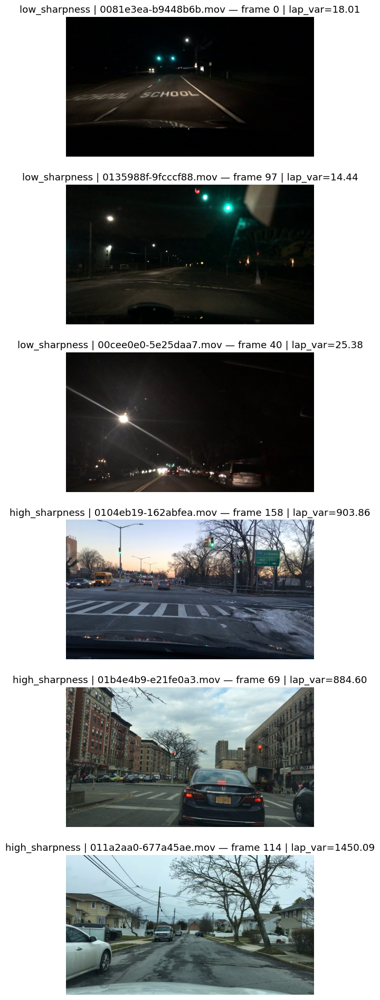

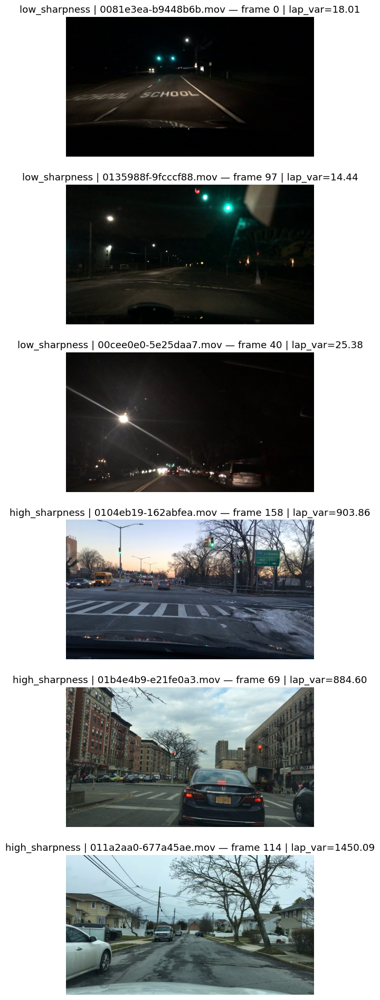

In [184]:
# ============================================================
# Sub-Step D4.3 — Visual Examples (Low vs High Sharpness)
# ============================================================

low_samples = sharpness_df[sharpness_df["laplacian_var"] <= thr_low].head(3)
high_samples = sharpness_df[sharpness_df["laplacian_var"] >= thr_high].head(3)

samples = pd.concat([
    low_samples.assign(bucket="low_sharpness"),
    high_samples.assign(bucket="high_sharpness")
])

fig, axes = plt.subplots(len(samples), 1, figsize=(13, 4 * len(samples)))
if len(samples) == 1:
    axes = [axes]

for ax, r in zip(axes, samples.itertuples(index=False)):
    vp = os.path.join(VIDEO_DIR, r.videoName_norm)
    cap = cv2.VideoCapture(vp)
    cap.set(cv2.CAP_PROP_POS_FRAMES, int(r.frameIndex))
    ret, frame = cap.read()
    cap.release()
    assert ret, f"Gagal membaca frame {r.frameIndex} dari {r.videoName_norm}"

    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    ax.imshow(frame_rgb)
    ax.set_title(f"{r.bucket} | {r.videoName_norm} — frame {r.frameIndex} | lap_var={r.laplacian_var:.2f}")
    ax.axis("off")

add_fig_page_d4("STEP D4.3 — Visual Examples (Low vs High Sharpness)", fig)

fig

In [185]:
# ============================================================
# Sub-Step D4.4 — Export PDF (Finalize)
# ============================================================

render_report_d4(PDF_PATH_D4)

print(f"✅ PDF generated: {PDF_PATH_D4}")
display(FileLink(PDF_PATH_D4))

✅ PDF generated: EDA_STEP_D4_Motion_Blur_and_Sharpness_Proxy.pdf


/kaggle/working/EDA_STEP_D4_Motion_Blur_and_Sharpness_Proxy.pdf

__Insight Kesimpulan__

Sub-step D4.1
Pengukuran sharpness pada 1.500 frame memperlihatkan bahwa dataset memiliki variasi ketajaman yang sangat luas, dari frame dengan hampir tidak ada detail tepi hingga frame dengan detail struktural sangat kuat. 

Sub-step D4.2
Distribusi sharpness yang kontinu dan berekor panjang mengindikasikan bahwa blur bukan sekadar outlier, melainkan bagian dari karakter visual dataset yang muncul berulang. 

Sub-step D4.3
Contoh visual low vs high sharpness memvalidasi bahwa nilai Laplacian variance yang rendah dan tinggi memang berkorelasi dengan perbedaan ketajaman visual yang nyata, sehingga proxy yang digunakan layak sebagai indikator eksploratif. 

## D5 - Extreme / Failure Case Sampling

In [186]:
# ============================================================
# STEP D5 — Report Setup (Collector)
# ============================================================

import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
from textwrap import wrap
from IPython.display import FileLink, display

PDF_PATH_D5 = "EDA_STEP_D5_Extreme_and_Failure_Case_Sampling.pdf"
REPORT_PAGES_D5 = []

def add_text_page_d5(title: str, lines: list[str]):
    REPORT_PAGES_D5.append({
        "type": "text",
        "title": title,
        "lines": [str(x) for x in lines]
    })

def add_fig_page_d5(title: str, fig):
    REPORT_PAGES_D5.append({
        "type": "fig",
        "title": title,
        "fig": fig
    })

def render_report_d5(pdf_path: str):
    plt.rcParams["figure.figsize"] = (11, 8)
    plt.rcParams["font.size"] = 11

    def _render_text(ax, title, lines):
        ax.axis("off")
        wrapped = []
        for line in lines:
            wrapped.extend(wrap(str(line), 110))
            wrapped.append("")
        ax.text(
            0.01, 0.98,
            f"{title}\n\n" + "\n".join(wrapped),
            va="top", ha="left", family="monospace"
        )

    with PdfPages(pdf_path) as pdf:
        for page in REPORT_PAGES_D5:
            if page["type"] == "text":
                fig, ax = plt.subplots()
                _render_text(ax, page["title"], page["lines"])
                pdf.savefig(fig)
                plt.close(fig)
            elif page["type"] == "fig":
                page["fig"].suptitle(page["title"], y=0.98)
                pdf.savefig(page["fig"])
                plt.close(page["fig"])

print("✅ Collector STEP D5 siap. Lanjut D5.1")


✅ Collector STEP D5 siap. Lanjut D5.1


In [187]:
# ============================================================
# Sub-Step D5.1 — Extreme Case Rules (Explicit, EDA-only)
# ============================================================

# Prasyarat
assert "df_d1" in globals(), "df_d1 tidak ditemukan. Jalankan STEP D1."
assert "VIDEO_DIR" in globals(), "VIDEO_DIR tidak ditemukan."

# Hitung bbox area ratio
df_ext = df_d1.copy()

# frame size diperlukan → kita estimasi via satu frame per video (EDA-only)
video_sizes = {}
for v in df_ext["videoName_norm"].drop_duplicates().head(50):
    vp = os.path.join(VIDEO_DIR, v)
    cap = cv2.VideoCapture(vp)
    ret, frame = cap.read()
    cap.release()
    if ret:
        H, W = frame.shape[:2]
        video_sizes[v] = (H, W)

def bbox_area_ratio(row):
    v = row["videoName_norm"]
    if v not in video_sizes:
        return np.nan
    H, W = video_sizes[v]
    try:
        a = abs((row["box2d.x2"] - row["box2d.x1"]) * (row["box2d.y2"] - row["box2d.y1"]))
        return float(a / (H * W))
    except:
        return np.nan

df_ext["bbox_area_ratio"] = df_ext.apply(bbox_area_ratio, axis=1)

# Track length
track_len = (
    df_ext
    .groupby(["videoName_norm", "id"])
    .size()
    .reset_index(name="track_length")
)

df_ext = df_ext.merge(track_len, on=["videoName_norm", "id"], how="left")

# Object count per frame
frame_density = (
    df_ext
    .groupby(["videoName_norm", "frameIndex"])
    .size()
    .reset_index(name="n_objects")
)

df_ext = df_ext.merge(frame_density, on=["videoName_norm", "frameIndex"], how="left")

# Quantile-based extreme thresholds (numeric only)
thr_small = df_ext["bbox_area_ratio"].quantile(0.01)
thr_large = df_ext["bbox_area_ratio"].quantile(0.99)
thr_dense = df_ext["n_objects"].quantile(0.99)
thr_short_track = df_ext["track_length"].quantile(0.05)

add_text_page_d5(
    title="STEP D5.1 — Extreme Case Rules (Numeric Thresholds)",
    lines=[
        "Defined thresholds (quantile-based):",
        "",
        f"bbox_area_ratio <= Q1% : {thr_small}",
        f"bbox_area_ratio >= Q99%: {thr_large}",
        f"frame n_objects >= Q99%: {thr_dense}",
        f"track_length <= Q5%   : {thr_short_track}",
        "",
        "Notes:",
        "- Thresholds are numeric only (no interpretation)."
    ]
)

pd.Series({
    "bbox_small_Q1": thr_small,
    "bbox_large_Q99": thr_large,
    "frame_dense_Q99": thr_dense,
    "track_short_Q5": thr_short_track
})

bbox_small_Q1       0.000179
bbox_large_Q99      0.216468
frame_dense_Q99    32.000000
track_short_Q5      8.000000
dtype: float64

In [188]:
# ============================================================
# Sub-Step D5.2 — Sample Extreme Cases
# ============================================================

samples = []

# Extreme small bbox
small_bbox = df_ext[df_ext["bbox_area_ratio"] <= thr_small]
samples.append(small_bbox.sample(min(3, len(small_bbox)), random_state=42))

# Extreme large bbox
large_bbox = df_ext[df_ext["bbox_area_ratio"] >= thr_large]
samples.append(large_bbox.sample(min(3, len(large_bbox)), random_state=42))

# Extremely crowded frames
dense_frames = df_ext[df_ext["n_objects"] >= thr_dense]
samples.append(dense_frames.sample(min(3, len(dense_frames)), random_state=42))

# Very short tracks
short_tracks = df_ext[df_ext["track_length"] <= thr_short_track]
samples.append(short_tracks.sample(min(3, len(short_tracks)), random_state=42))

extreme_df = pd.concat(samples).drop_duplicates()

add_text_page_d5(
    title="STEP D5.2 — Sampled Extreme Cases (Metadata)",
    lines=[
        f"Total sampled rows: {len(extreme_df)}",
        "",
        extreme_df[[
            "videoName_norm", "frameIndex", "id",
            "bbox_area_ratio", "n_objects", "track_length"
        ]].to_string(index=False)
    ]
)

extreme_df.head()

,name,videoName,frameIndex,id,category,attributes.crowd,attributes.occluded,attributes.truncated,box2d.x1,box2d.x2,box2d.y1,box2d.y2,haveVideo,videoName_norm,bbox_area_ratio,track_length,n_objects
78683,0245bba2-091b06af-0000004.jpg,0245bba2-091b06af,3,00055654,car,False,False,False,755.370336,769.044331,267.821692,279.138102,True,0245bba2-091b06af.mov,0.000168,65,7
79301,0245bba2-091b06af-0000057.jpg,0245bba2-091b06af,56,00055654,car,False,False,False,654.937201,666.725128,264.107316,274.422931,True,0245bba2-091b06af.mov,0.000132,65,10
105070,007aeb45-56d1aed9-0000092.jpg,007aeb45-56d1aed9,91,00031656,car,False,False,False,951.874054,966.707054,367.184176,377.297585,True,007aeb45-56d1aed9.mov,0.000163,4,17
85421,012e9465-1031243b-0000074.jpg,012e9465-1031243b,73,00034557,bus,False,True,True,256.489607,1279.538106,228.637413,511.316397,True,012e9465-1031243b.mov,0.313796,18,3
90244,00091078-875c1f73-0000077.jpg,00091078-875c1f73,76,00109371,car,False,True,False,256.440289,759.070937,259.373133,699.967350,True,00091078-875c1f73.mov,0.240295,202,10


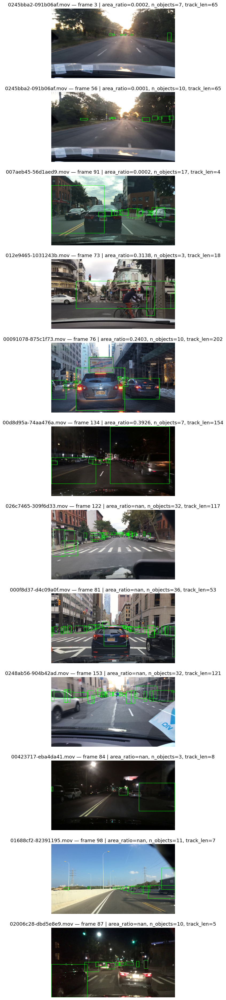

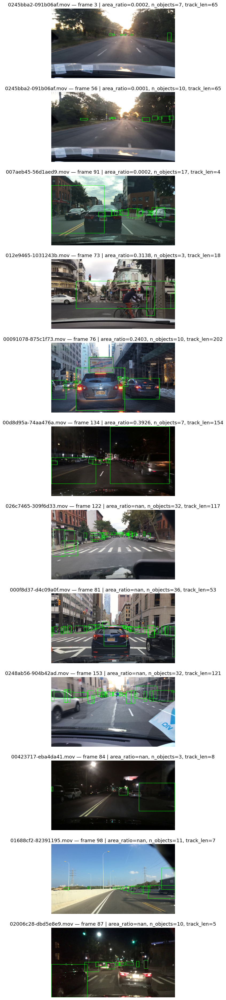

In [189]:
# ============================================================
# Sub-Step D5.3 — Visual Gallery (Extreme Cases)
# ============================================================

def draw_overlay_simple(frame_bgr, rows):
    img = frame_bgr.copy()
    for _, r in rows.iterrows():
        x1, y1 = int(r["box2d.x1"]), int(r["box2d.y1"])
        x2, y2 = int(r["box2d.x2"]), int(r["box2d.y2"])
        cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
    return img

fig, axes = plt.subplots(len(extreme_df), 1, figsize=(13, 4 * len(extreme_df)))
if len(extreme_df) == 1:
    axes = [axes]

for ax, r in zip(axes, extreme_df.itertuples(index=False)):
    vp = os.path.join(VIDEO_DIR, r.videoName_norm)
    cap = cv2.VideoCapture(vp)
    cap.set(cv2.CAP_PROP_POS_FRAMES, int(r.frameIndex))
    ret, frame = cap.read()
    cap.release()
    if not ret:
        continue

    rows = df_ext[
        (df_ext["videoName_norm"] == r.videoName_norm) &
        (df_ext["frameIndex"] == r.frameIndex)
    ]

    overlay = draw_overlay_simple(frame, rows)
    overlay_rgb = cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB)

    ax.imshow(overlay_rgb)
    ax.set_title(
        f"{r.videoName_norm} — frame {r.frameIndex} | "
        f"area_ratio={r.bbox_area_ratio:.4f}, "
        f"n_objects={r.n_objects}, "
        f"track_len={r.track_length}"
    )
    ax.axis("off")

add_fig_page_d5("STEP D5.3 — Extreme / Failure Case Gallery", fig)

fig


In [190]:
# ============================================================
# Sub-Step D5.4 — Export PDF (Finalize)
# ============================================================

render_report_d5(PDF_PATH_D5)

print(f"✅ PDF generated: {PDF_PATH_D5}")
display(FileLink(PDF_PATH_D5))

✅ PDF generated: EDA_STEP_D5_Extreme_and_Failure_Case_Sampling.pdf


/kaggle/working/EDA_STEP_D5_Extreme_and_Failure_Case_Sampling.pdf

__Insight Kesimpulan__

Sub-step D5.1
Pendefinisian threshold ekstrem berbasis kuantil memastikan bahwa kasus yang dipilih merupakan ekor distribusi nyata dari ukuran bbox, kepadatan frame, dan panjang track, serta konsisten dengan temuan kuantitatif di Block B dan C. 

Sub-step D5.2
Metadata sampel menunjukkan bahwa extreme cases tidak homogen; terdapat variasi antara bbox kecil, bbox besar, frame padat, dan track pendek, yang semuanya muncul dalam jumlah terbatas namun terukur. Hal ini mengindikasikan bahwa kegagalan model potensial tidak akan terpusat pada satu pola tunggal. 

Sub-step D5.3
Validasi visual mengonfirmasi bahwa kasus-kasus yang terdeteksi secara numerik memang memiliki karakter visual ekstrem, sehingga koneksi antara analisis statistik dan inspeksi visual tetap terjaga.